In [1]:
!unzip mnist.zip

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

Se corrieron los dos modelos obteniendo que el mejor era el segundo. Sin embargo, se van a mostrar solo las matrices del modelo más adecuado con el fin de que no se ocupe tanto espacio en el archivo y se pueda cargar al repositorio.

## **MODELO 1**

In [3]:
from glob import glob

train_files = glob('./mnist/train/*/*.png')
valid_files = glob('./mnist/valid/*/*.png')
test_files = glob('./mnist/test/*/*.png')

In [4]:
np.random.shuffle(train_files)
np.random.shuffle(valid_files)
np.random.shuffle(test_files)
len(train_files), len(valid_files), len(test_files)

(6000, 2000, 992)

In [5]:
from PIL import Image

N_train = len(train_files)
X_train = []
Y_train = []

for i, train_file in enumerate(train_files):
  Y_train.append( int(train_file.split('/')[3]) )
  X_train.append(np.array(Image.open(train_file)))

In [6]:
N_valid = len(valid_files)
X_valid = []
Y_valid = []

for i, valid_file in enumerate(valid_files):
  Y_valid.append( int(valid_file.split('/')[3]) )
  X_valid.append( np.array(Image.open(valid_file)) )

In [7]:
N_test = len(test_files)
X_test = []
Y_test = []

for i, test_file in enumerate(test_files):
  Y_test.append( int(test_file.split('/')[3]) )
  X_test.append( np.array(Image.open(test_file)) )

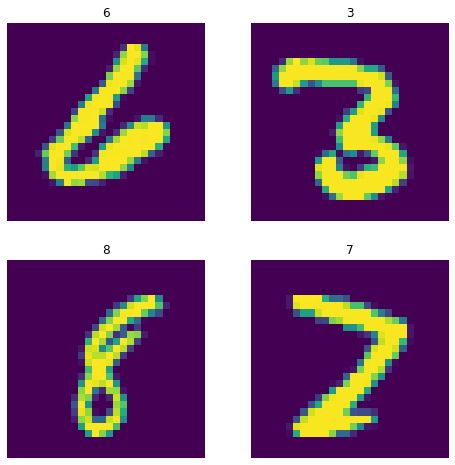

In [8]:
fig = plt.figure(figsize=(8,8))
for i in range(4):
  plt.subplot(2,2,i+1)
  plt.imshow(X_test[i*15])
  plt.title(Y_test[i*15])
  plt.axis(False)
plt.show()


In [9]:
import torch
from torch.autograd import Variable


X_train = Variable(torch.from_numpy(np.array(X_train))).float()
Y_train = Variable(torch.from_numpy(np.array(Y_train))).long()

X_valid = Variable(torch.from_numpy(np.array(X_valid))).float()
Y_valid = Variable(torch.from_numpy(np.array(Y_valid))).long()

X_test = Variable(torch.from_numpy(np.array(X_test))).float()
Y_test = Variable(torch.from_numpy(np.array(Y_test))).long()

X_train.data.size()

torch.Size([6000, 28, 28])

In [10]:
from sklearn.metrics import confusion_matrix

def CM(Y_true, Y_pred, classes):
  fig = plt.figure(figsize=(10, 10))
  cm = confusion_matrix(Y_true, Y_pred)
  lclasses = np.arange(0,classes)
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
  cmap=plt.cm.Blues
  ax = fig.add_subplot(1,1,1)
  im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
  ax.figure.colorbar(im, ax=ax, pad=0.01, shrink=0.86)
  ax.set(xticks=np.arange(cm.shape[1]), yticks=np.arange(cm.shape[0]),xticklabels=lclasses, yticklabels=lclasses)
  ax.set_xlabel("Predicted",size=20)
  ax.set_ylabel("True",size=20)
  ax.set_ylim(classes-0.5, -0.5)

  plt.setp(ax.get_xticklabels(), size=12)
  plt.setp(ax.get_yticklabels(), size=12)

  fmt = '.2f'
  thresh = cm.max()/2.
  for i in range(cm.shape[0]):
      for j in range(cm.shape[1]):
          ax.text(j, i, format(cm[i, j], fmt),ha="center", va="center",size=15 , color="white" if cm[i, j] > thresh else "black")

  plt.show()

In [11]:
from sklearn.metrics import f1_score

def train_valid(model, n_epoch, optimizer, criterion):
  loss_train = []
  f1_train = []
  acc_train = []

  loss_valid = []
  f1_valid = []
  acc_valid = []

  for epoch in range(n_epoch):
    model.train()

    Xtr = X_train.view(X_train.size(0), -1)
    Y_pred = model(Xtr)

    loss = criterion(Y_pred,Y_train)
    loss_train.append(loss.item())

    Y_pred = torch.argmax(Y_pred, 1)
    f1_train.append( f1_score(Y_train,Y_pred, average='macro') )
    
    acc = sum(Y_train == Y_pred)/len(Y_pred)
    acc_train.append(acc)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    model.eval()
    Xvl = X_valid.view(X_valid.size(0), -1)
    Y_pred = model(Xvl)  
    loss = criterion(Y_pred,Y_valid)
    loss_valid.append(loss.item())

    Y_pred = torch.argmax(Y_pred, 1)
    f1_valid.append( f1_score(Y_valid, Y_pred, average='macro') )

    acc = sum(Y_valid == Y_pred)/len(Y_pred)
    acc_valid.append(acc)

  print( 'Valid Evaluation loss: {}. f1:{} acc: {} '.format(loss_valid[-1], f1_valid[-1], acc_valid[-1]) )
  CM(Y_valid, Y_pred, 10)

In [24]:
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from tqdm.notebook import tqdm


bs_list = [100,300,600]
lr_list = [0.0005,0.005,0.05]
wd_list = [0.0005,0.005,0.05]
hd_list = [10,50,80]
ne_list = [25,50,75]

pbar = tqdm(total=len(bs_list)*len(lr_list)*len(wd_list)*len(hd_list)*len(ne_list))

for ne in ne_list:
  for bs in bs_list:
    train_ds = TensorDataset(X_train, Y_train)
    train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True)

    for lr in lr_list:
      for wd in wd_list:
        for hd in hd_list:
          input_dim = 28*28
          out_dim = 10
          hidden = hd

          model = torch.nn.Sequential(
            torch.nn.Linear(input_dim, hidden),
            torch.nn.ReLU(),
            torch.nn.Linear(hidden, out_dim)
          )

          optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
          criterion = torch.nn.CrossEntropyLoss()

          print('ne: {}, hd:{}, wd:{}, lr: {}, bs:{} '.format(ne,hd,wd,lr,bs))
          train_valid(model,ne,optimizer,criterion)
          print('###################\n')

          pbar.update()
pbar.close()


## **MODELO 2**

In [13]:
from glob import glob

train_files = glob('./mnist/train/*/*.png')
valid_files = glob('./mnist/valid/*/*.png')
test_files = glob('./mnist/test/*/*.png')

In [14]:
np.random.shuffle(train_files)
np.random.shuffle(valid_files)
np.random.shuffle(test_files)
len(train_files), len(valid_files), len(test_files)

(6000, 2000, 992)

In [15]:
from PIL import Image

N_train = len(train_files)
X_train = []
Y_train = []

for i, train_file in enumerate(train_files):
  Y_train.append( int(train_file.split('/')[3]) )
  X_train.append(np.array(Image.open(train_file)))

In [16]:
N_valid = len(valid_files)
X_valid = []
Y_valid = []

for i, valid_file in enumerate(valid_files):
  Y_valid.append( int(valid_file.split('/')[3]) )
  X_valid.append( np.array(Image.open(valid_file)) )

In [17]:
N_test = len(test_files)
X_test = []
Y_test = []

for i, test_file in enumerate(test_files):
  Y_test.append( int(test_file.split('/')[3]) )
  X_test.append( np.array(Image.open(test_file)) )

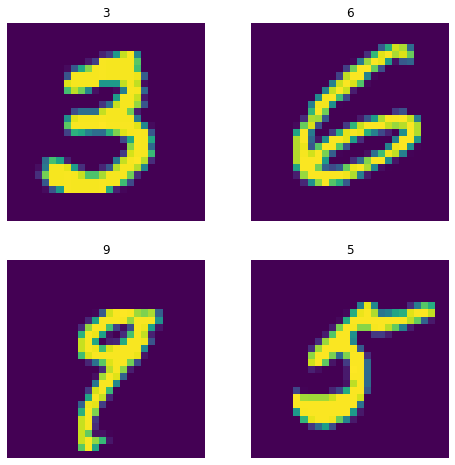

In [18]:
fig = plt.figure(figsize=(8,8))
for i in range(4):
  plt.subplot(2,2,i+1)
  plt.imshow(X_test[i*15])
  plt.title(Y_test[i*15])
  plt.axis(False)
plt.show()


In [19]:
import torch
from torch.autograd import Variable


X_train = Variable(torch.from_numpy(np.array(X_train))).float()
Y_train = Variable(torch.from_numpy(np.array(Y_train))).long()

X_valid = Variable(torch.from_numpy(np.array(X_valid))).float()
Y_valid = Variable(torch.from_numpy(np.array(Y_valid))).long()

X_test = Variable(torch.from_numpy(np.array(X_test))).float()
Y_test = Variable(torch.from_numpy(np.array(Y_test))).long()

X_train.data.size()

torch.Size([6000, 28, 28])

In [20]:
from sklearn.metrics import confusion_matrix

def CM(Y_true, Y_pred, classes):
  fig = plt.figure(figsize=(10, 10))
  cm = confusion_matrix(Y_true, Y_pred)
  lclasses = np.arange(0,classes)
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
  cmap=plt.cm.Blues
  ax = fig.add_subplot(1,1,1)
  im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
  ax.figure.colorbar(im, ax=ax, pad=0.01, shrink=0.86)
  ax.set(xticks=np.arange(cm.shape[1]), yticks=np.arange(cm.shape[0]),xticklabels=lclasses, yticklabels=lclasses)
  ax.set_xlabel("Predicted",size=20)
  ax.set_ylabel("True",size=20)
  ax.set_ylim(classes-0.5, -0.5)

  plt.setp(ax.get_xticklabels(), size=12)
  plt.setp(ax.get_yticklabels(), size=12)

  fmt = '.2f'
  thresh = cm.max()/2.
  for i in range(cm.shape[0]):
      for j in range(cm.shape[1]):
          ax.text(j, i, format(cm[i, j], fmt),ha="center", va="center",size=15 , color="white" if cm[i, j] > thresh else "black")

  plt.show()

In [21]:
from sklearn.metrics import f1_score

def train_valid(model, n_epoch, optimizer, criterion):
  loss_train = []
  f1_train = []
  acc_train = []

  loss_valid = []
  f1_valid = []
  acc_valid = []

  for epoch in range(n_epoch):
    model.train()

    Xtr = X_train.view(X_train.size(0), -1)
    Y_pred = model(Xtr)

    loss = criterion(Y_pred,Y_train)
    loss_train.append(loss.item())

    Y_pred = torch.argmax(Y_pred, 1)
    f1_train.append( f1_score(Y_train,Y_pred, average='macro') )
    
    acc = sum(Y_train == Y_pred)/len(Y_pred)
    acc_train.append(acc)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    model.eval()
    Xvl = X_valid.view(X_valid.size(0), -1)
    Y_pred = model(Xvl)  
    loss = criterion(Y_pred,Y_valid)
    loss_valid.append(loss.item())

    Y_pred = torch.argmax(Y_pred, 1)
    f1_valid.append( f1_score(Y_valid, Y_pred, average='macro') )

    acc = sum(Y_valid == Y_pred)/len(Y_pred)
    acc_valid.append(acc)

  print( 'Valid Evaluation loss: {}. f1:{} acc: {} '.format(loss_valid[-1], f1_valid[-1], acc_valid[-1]) )
  CM(Y_valid, Y_pred, 10)

  0%|          | 0/243 [00:00<?, ?it/s]

ne: 70, hd:70, wd:0.002, lr: 0.002, bs:300 
Valid Evaluation loss: 0.36689475178718567. f1:0.8974196921372035 acc: 0.8974999785423279 


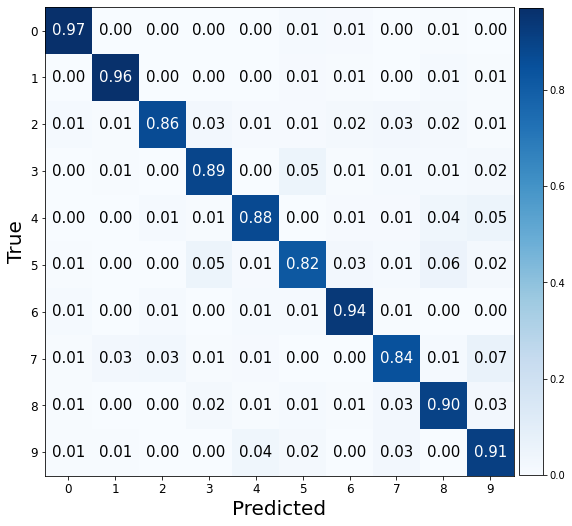

###################

ne: 70, hd:100, wd:0.002, lr: 0.002, bs:300 
Valid Evaluation loss: 0.3187917470932007. f1:0.9119407813297812 acc: 0.9120000004768372 


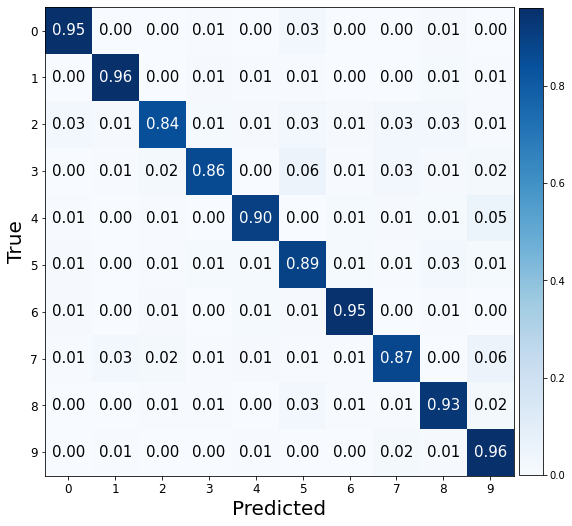

###################

ne: 70, hd:120, wd:0.002, lr: 0.002, bs:300 
Valid Evaluation loss: 0.31664973497390747. f1:0.9197966619001449 acc: 0.9200000166893005 


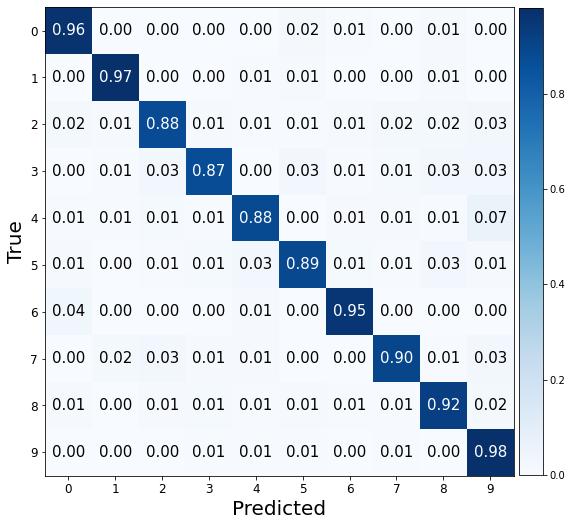

###################

ne: 70, hd:70, wd:0.02, lr: 0.002, bs:300 
Valid Evaluation loss: 0.34632614254951477. f1:0.9015053584132099 acc: 0.9014999866485596 


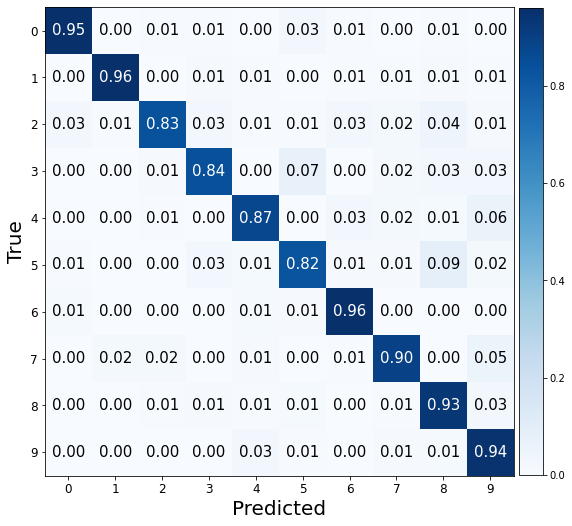

###################

ne: 70, hd:100, wd:0.02, lr: 0.002, bs:300 
Valid Evaluation loss: 0.3432225286960602. f1:0.896835569386959 acc: 0.8970000147819519 


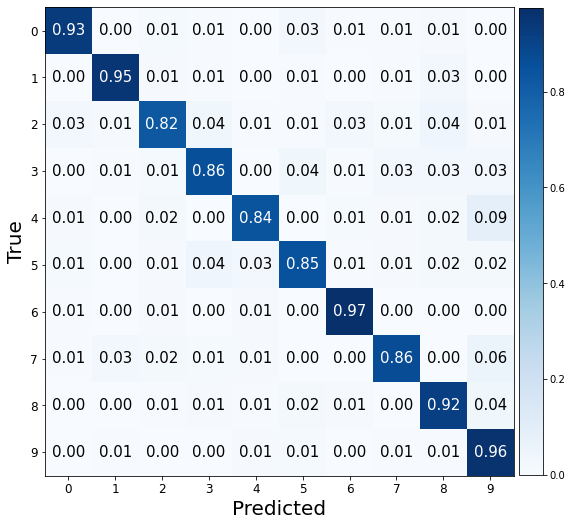

###################

ne: 70, hd:120, wd:0.02, lr: 0.002, bs:300 
Valid Evaluation loss: 0.3434767723083496. f1:0.9006901642846398 acc: 0.9010000228881836 


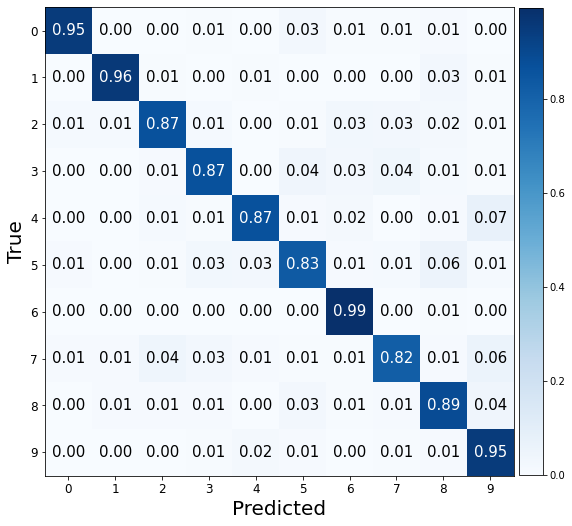

###################

ne: 70, hd:70, wd:0.2, lr: 0.002, bs:300 
Valid Evaluation loss: 0.3279878497123718. f1:0.9062668794177297 acc: 0.906499981880188 


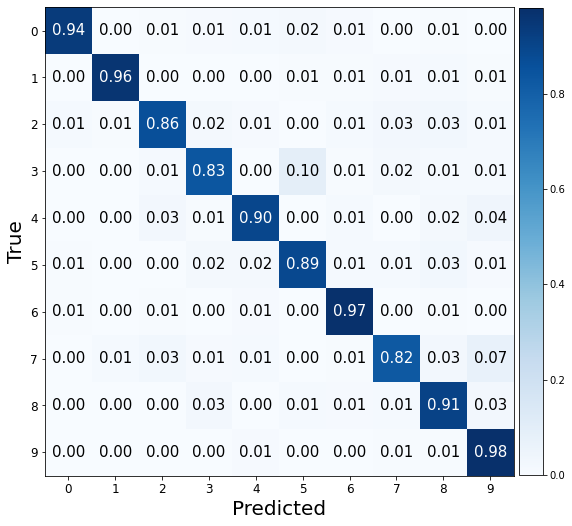

###################

ne: 70, hd:100, wd:0.2, lr: 0.002, bs:300 
Valid Evaluation loss: 0.264451801776886. f1:0.914700760231878 acc: 0.9150000214576721 


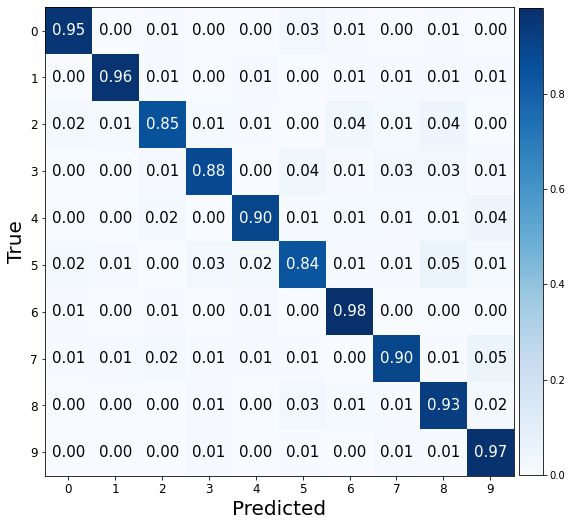

###################

ne: 70, hd:120, wd:0.2, lr: 0.002, bs:300 
Valid Evaluation loss: 0.30686521530151367. f1:0.9013634233157115 acc: 0.9014999866485596 


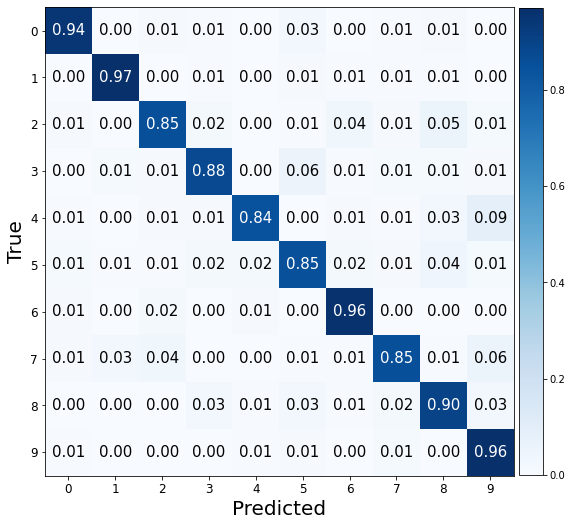

###################

ne: 70, hd:70, wd:0.002, lr: 0.02, bs:300 
Valid Evaluation loss: 2.076869487762451. f1:0.11237498626222661 acc: 0.1875 


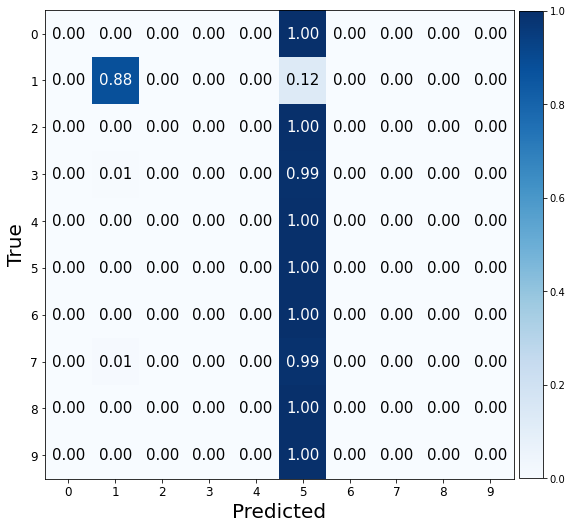

###################

ne: 70, hd:100, wd:0.002, lr: 0.02, bs:300 
Valid Evaluation loss: 1.8164286613464355. f1:0.2809174802378342 acc: 0.3334999978542328 


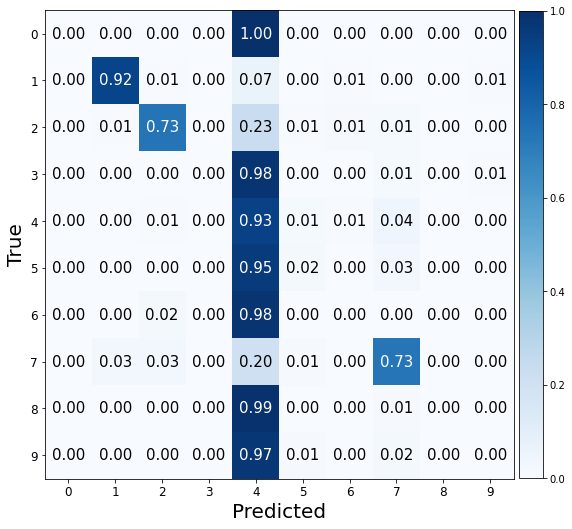

###################

ne: 70, hd:120, wd:0.002, lr: 0.02, bs:300 
Valid Evaluation loss: 2.261471748352051. f1:0.25481563176154165 acc: 0.2980000078678131 


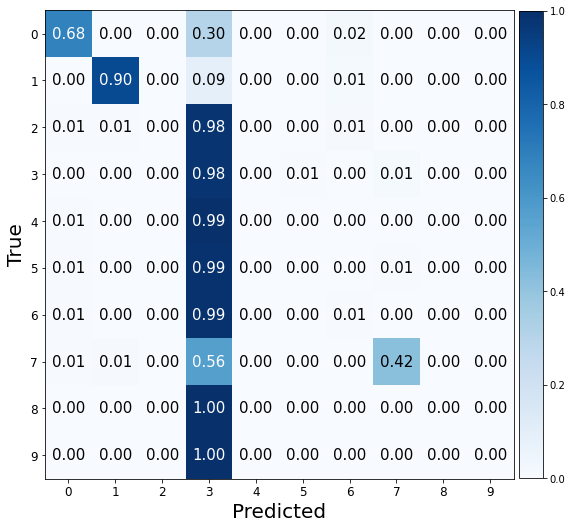

###################

ne: 70, hd:70, wd:0.02, lr: 0.02, bs:300 
Valid Evaluation loss: 1.160780668258667. f1:0.6070930413139659 acc: 0.6365000009536743 


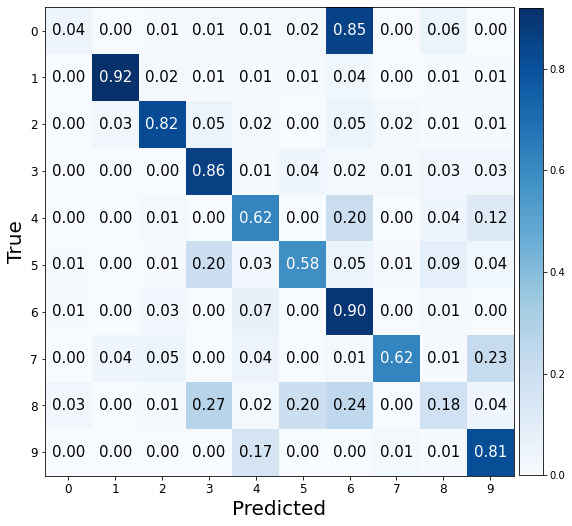

###################

ne: 70, hd:100, wd:0.02, lr: 0.02, bs:300 
Valid Evaluation loss: 1.6575654745101929. f1:0.30896212772520154 acc: 0.3709999918937683 


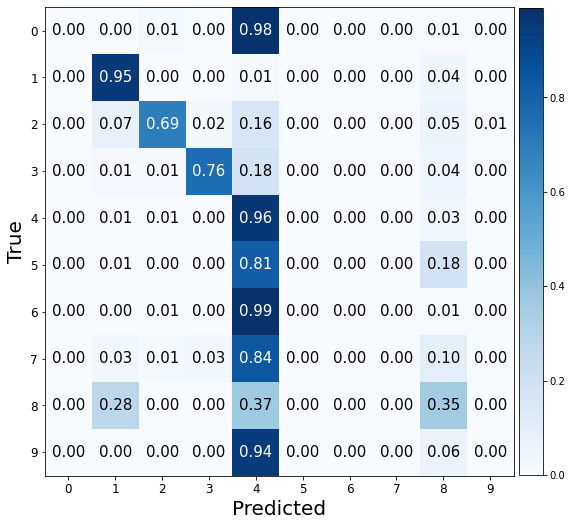

###################

ne: 70, hd:120, wd:0.02, lr: 0.02, bs:300 
Valid Evaluation loss: 1.4321345090866089. f1:0.45485941007643377 acc: 0.5009999871253967 


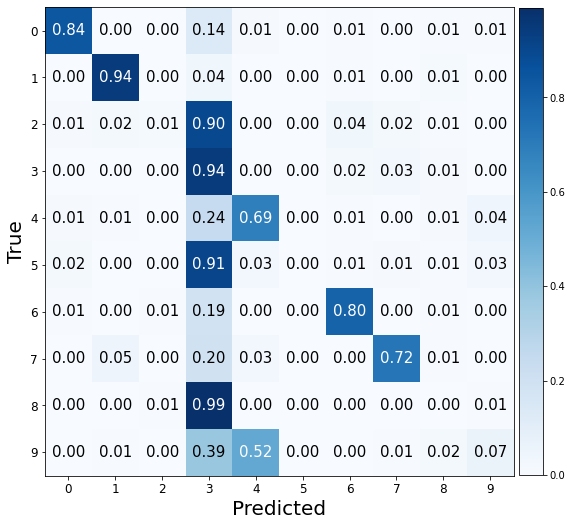

###################

ne: 70, hd:70, wd:0.2, lr: 0.02, bs:300 
Valid Evaluation loss: 1.2681337594985962. f1:0.5438303414000449 acc: 0.5870000123977661 


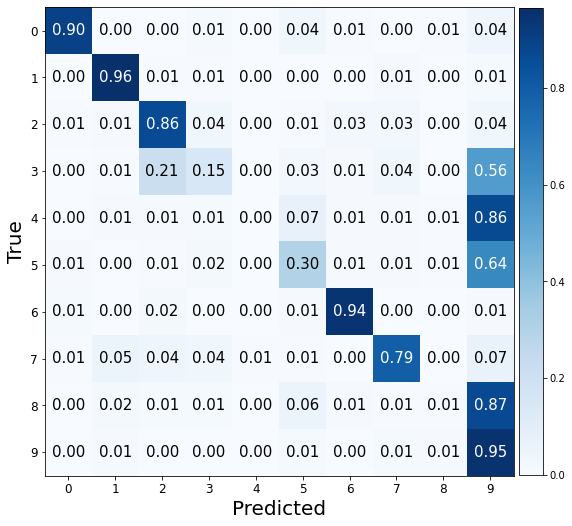

###################

ne: 70, hd:100, wd:0.2, lr: 0.02, bs:300 
Valid Evaluation loss: 0.5236163139343262. f1:0.8371380820018899 acc: 0.8379999995231628 


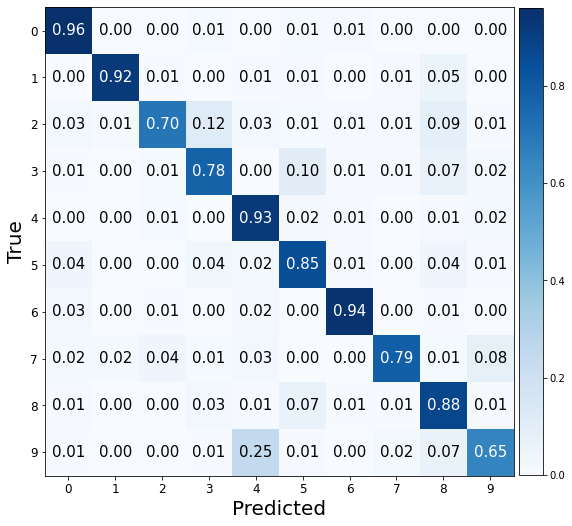

###################

ne: 70, hd:120, wd:0.2, lr: 0.02, bs:300 
Valid Evaluation loss: 1.6638665199279785. f1:0.4530062457272697 acc: 0.5295000076293945 


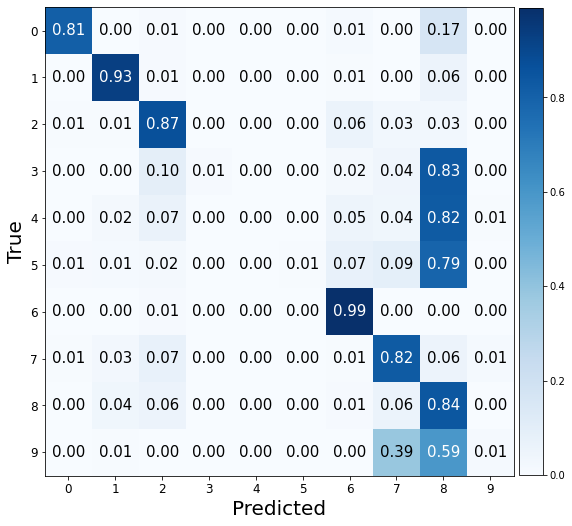

###################

ne: 70, hd:70, wd:0.002, lr: 0.2, bs:300 
Valid Evaluation loss: 2.306795120239258. f1:0.01818181818181818 acc: 0.10000000149011612 


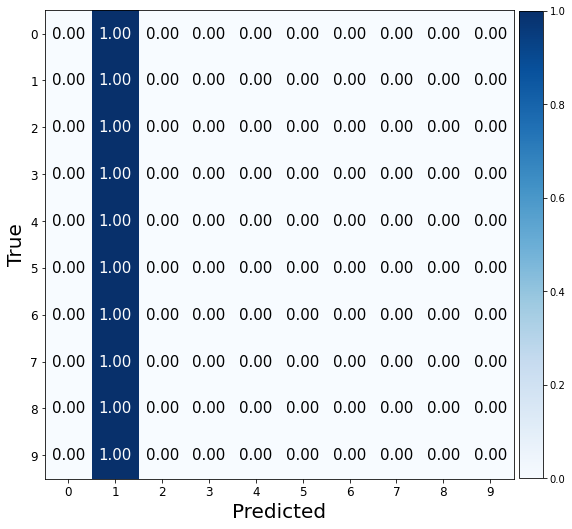

###################

ne: 70, hd:100, wd:0.002, lr: 0.2, bs:300 
Valid Evaluation loss: 2.313000202178955. f1:0.01818181818181818 acc: 0.10000000149011612 


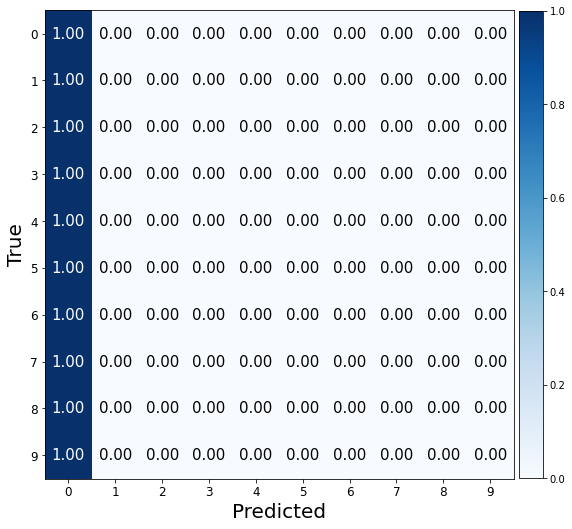

###################

ne: 70, hd:120, wd:0.002, lr: 0.2, bs:300 
Valid Evaluation loss: 2.305203676223755. f1:0.01818181818181818 acc: 0.10000000149011612 


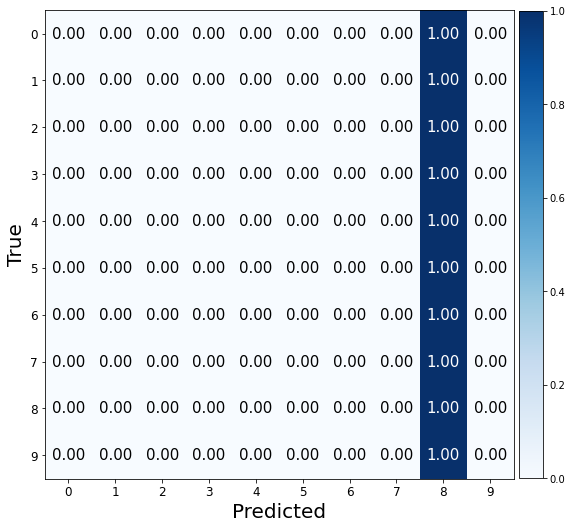

###################

ne: 70, hd:70, wd:0.02, lr: 0.2, bs:300 
Valid Evaluation loss: 2.287222385406494. f1:0.051199137357005875 acc: 0.11900000274181366 


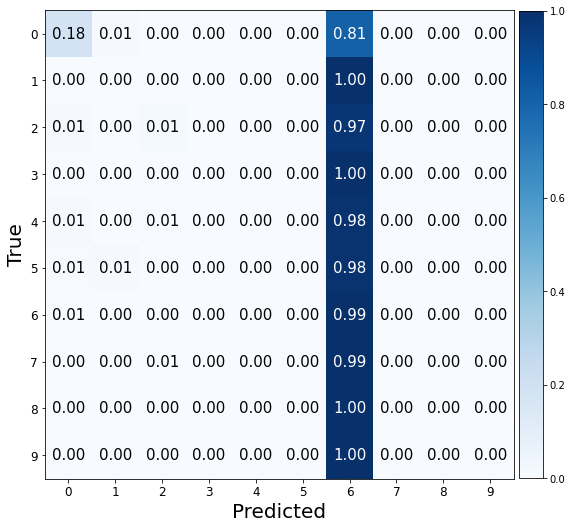

###################

ne: 70, hd:100, wd:0.02, lr: 0.2, bs:300 
Valid Evaluation loss: 11.681024551391602. f1:0.03616056787901936 acc: 0.11249999701976776 


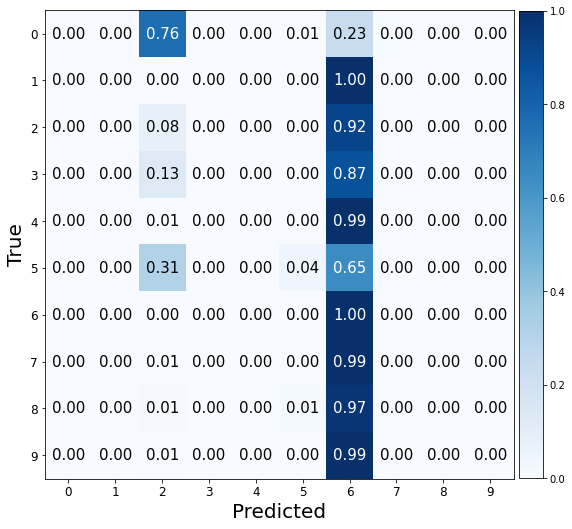

###################

ne: 70, hd:120, wd:0.02, lr: 0.2, bs:300 
Valid Evaluation loss: 2.252124786376953. f1:0.06875473846235045 acc: 0.13300000131130219 


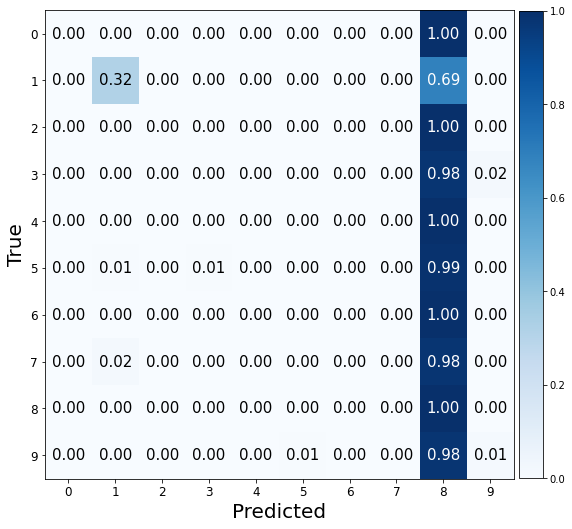

###################

ne: 70, hd:70, wd:0.2, lr: 0.2, bs:300 
Valid Evaluation loss: 154.0426025390625. f1:0.056766216709517425 acc: 0.11999999731779099 


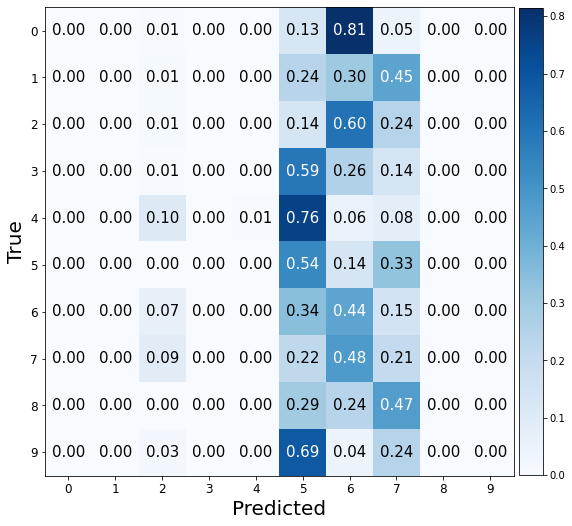

###################

ne: 70, hd:100, wd:0.2, lr: 0.2, bs:300 
Valid Evaluation loss: 2.4392316341400146. f1:0.02425631364909934 acc: 0.10050000250339508 


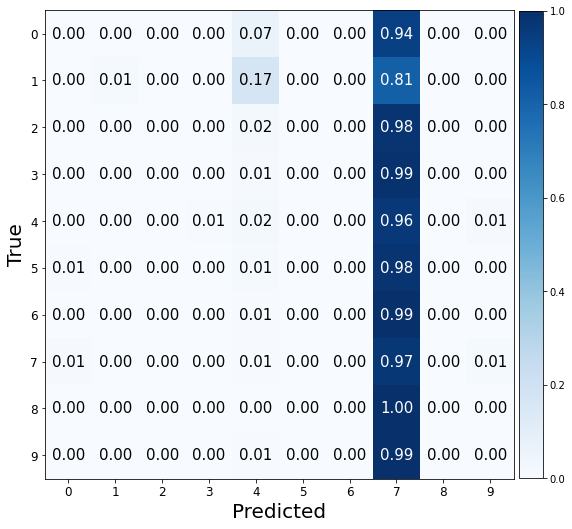

###################

ne: 70, hd:120, wd:0.2, lr: 0.2, bs:300 
Valid Evaluation loss: 440.20587158203125. f1:0.023260401721664277 acc: 0.10249999910593033 


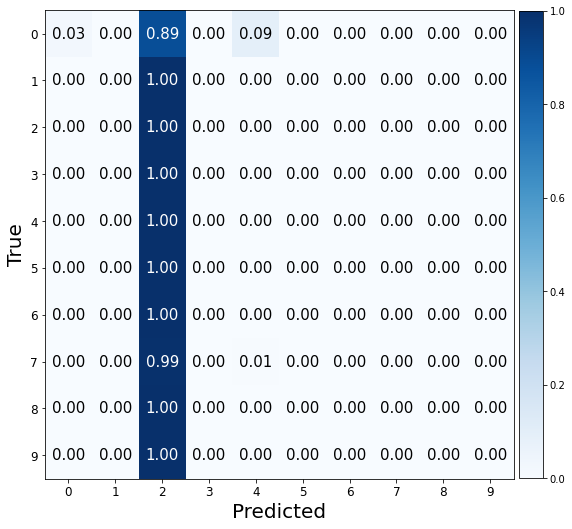

###################

ne: 70, hd:70, wd:0.002, lr: 0.002, bs:600 
Valid Evaluation loss: 0.3382871448993683. f1:0.8981228261337748 acc: 0.8980000019073486 


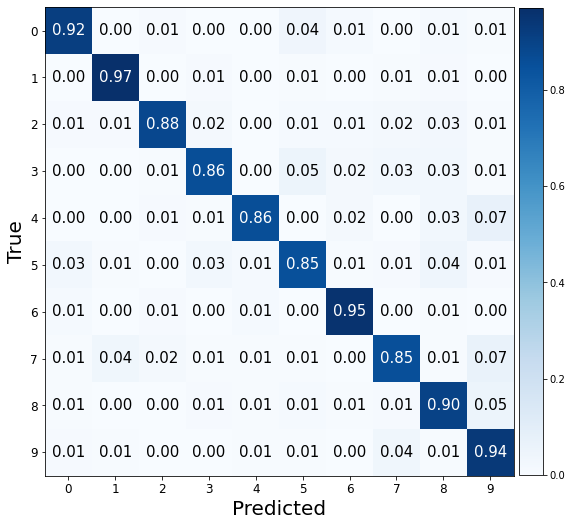

###################

ne: 70, hd:100, wd:0.002, lr: 0.002, bs:600 
Valid Evaluation loss: 0.34219658374786377. f1:0.906169801908615 acc: 0.906499981880188 


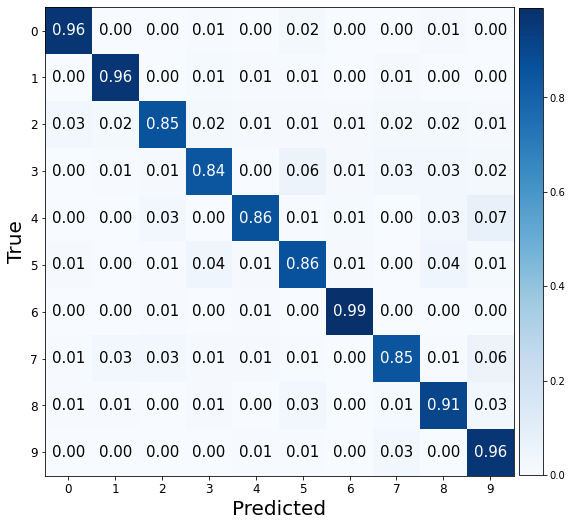

###################

ne: 70, hd:120, wd:0.002, lr: 0.002, bs:600 
Valid Evaluation loss: 0.382890909910202. f1:0.8946458600373335 acc: 0.8945000171661377 


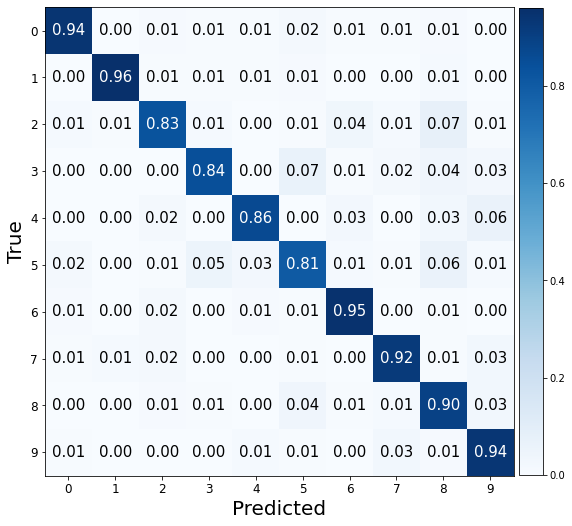

###################

ne: 70, hd:70, wd:0.02, lr: 0.002, bs:600 
Valid Evaluation loss: 0.35032573342323303. f1:0.8999268723859373 acc: 0.8999999761581421 


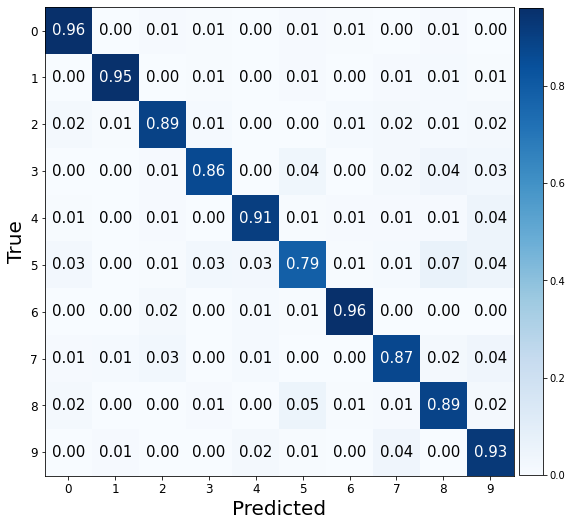

###################

ne: 70, hd:100, wd:0.02, lr: 0.002, bs:600 
Valid Evaluation loss: 0.33408206701278687. f1:0.8999617535645328 acc: 0.8999999761581421 


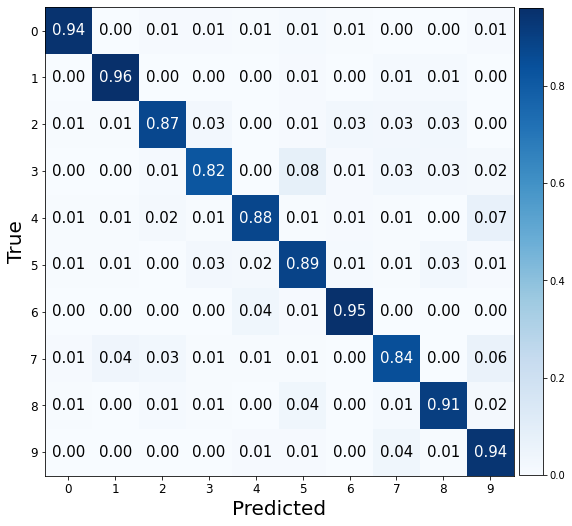

###################

ne: 70, hd:120, wd:0.02, lr: 0.002, bs:600 
Valid Evaluation loss: 0.3197331428527832. f1:0.9071561856441616 acc: 0.9075000286102295 


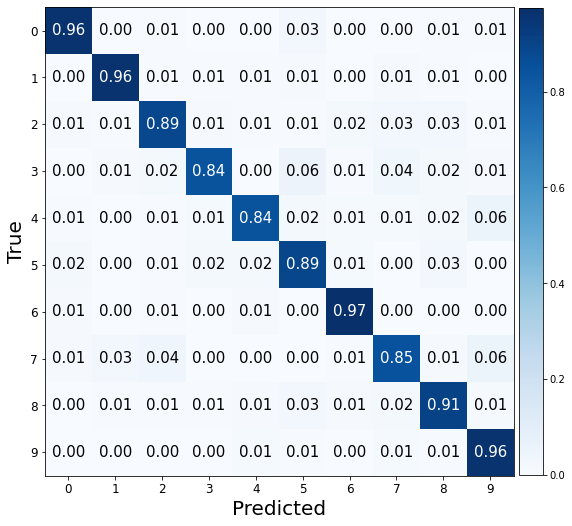

###################

ne: 70, hd:70, wd:0.2, lr: 0.002, bs:600 
Valid Evaluation loss: 0.30935075879096985. f1:0.9036853303398447 acc: 0.9039999842643738 


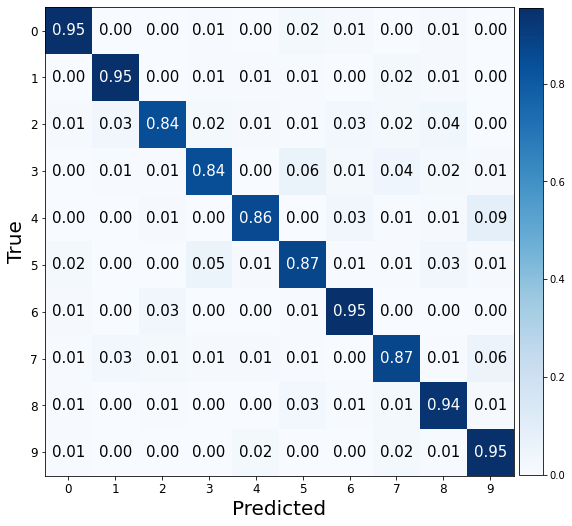

###################

ne: 70, hd:100, wd:0.2, lr: 0.002, bs:600 
Valid Evaluation loss: 0.27707037329673767. f1:0.9122877982838323 acc: 0.9125000238418579 


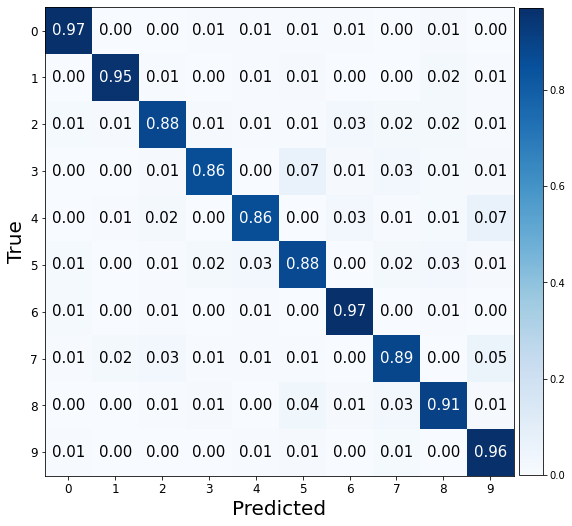

###################

ne: 70, hd:120, wd:0.2, lr: 0.002, bs:600 
Valid Evaluation loss: 0.3277670741081238. f1:0.9027901551246058 acc: 0.902999997138977 


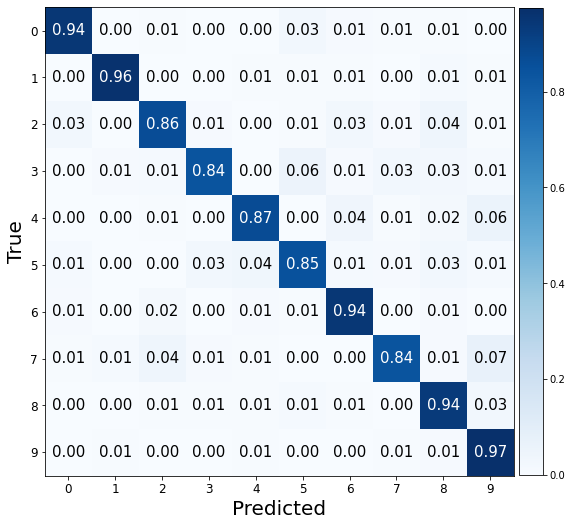

###################

ne: 70, hd:70, wd:0.002, lr: 0.02, bs:600 
Valid Evaluation loss: 2.299722909927368. f1:0.021181868321004205 acc: 0.1014999970793724 


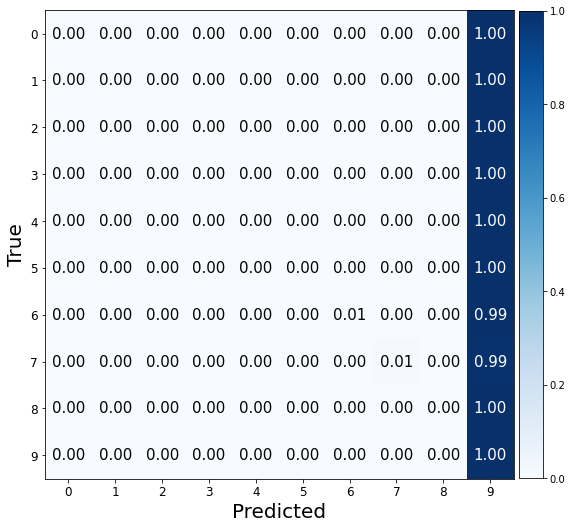

###################

ne: 70, hd:100, wd:0.002, lr: 0.02, bs:600 
Valid Evaluation loss: 2.0032739639282227. f1:0.25741691420514673 acc: 0.2955000102519989 


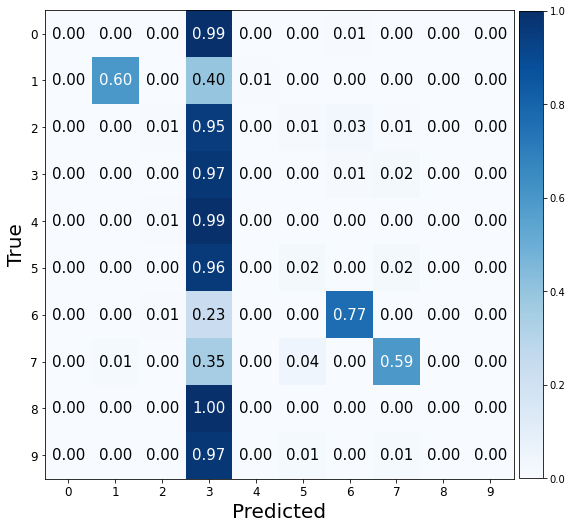

###################

ne: 70, hd:120, wd:0.002, lr: 0.02, bs:600 
Valid Evaluation loss: 2.0317344665527344. f1:0.19440960877788765 acc: 0.2549999952316284 


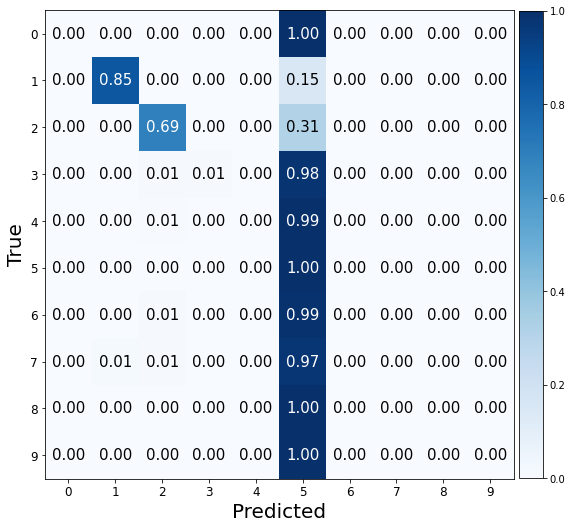

###################

ne: 70, hd:70, wd:0.02, lr: 0.02, bs:600 
Valid Evaluation loss: 0.9371678233146667. f1:0.6194659492272562 acc: 0.6600000262260437 


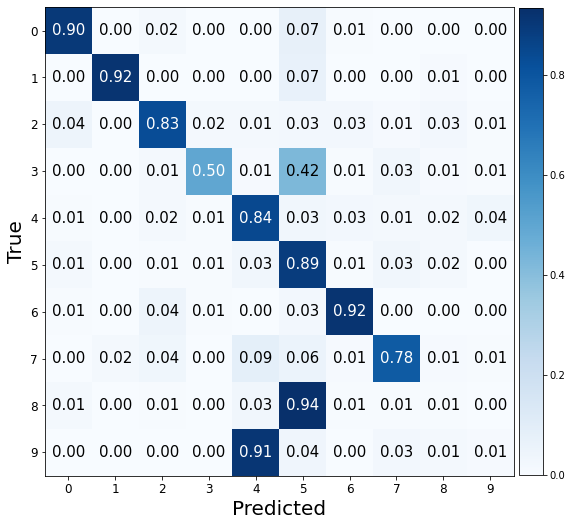

###################

ne: 70, hd:100, wd:0.02, lr: 0.02, bs:600 
Valid Evaluation loss: 2.035630941390991. f1:0.20112988680313088 acc: 0.25200000405311584 


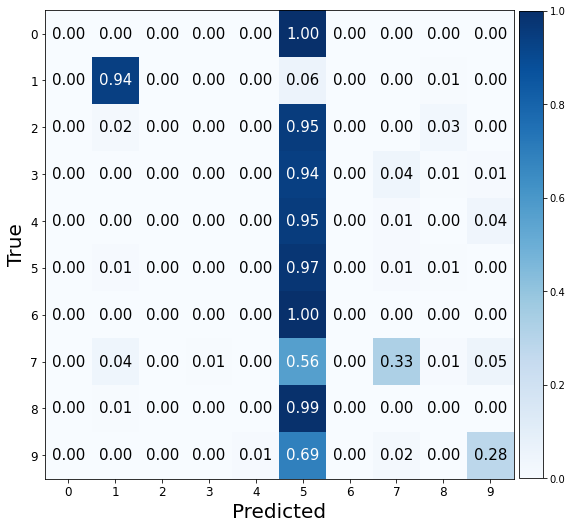

###################

ne: 70, hd:120, wd:0.02, lr: 0.02, bs:600 
Valid Evaluation loss: 2.4984817504882812. f1:0.09743361895694488 acc: 0.16599999368190765 


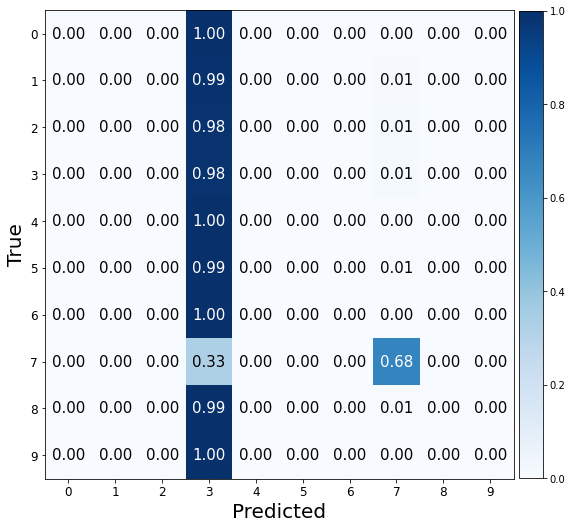

###################

ne: 70, hd:70, wd:0.2, lr: 0.02, bs:600 
Valid Evaluation loss: 1.1135433912277222. f1:0.6010069272361568 acc: 0.6384999752044678 


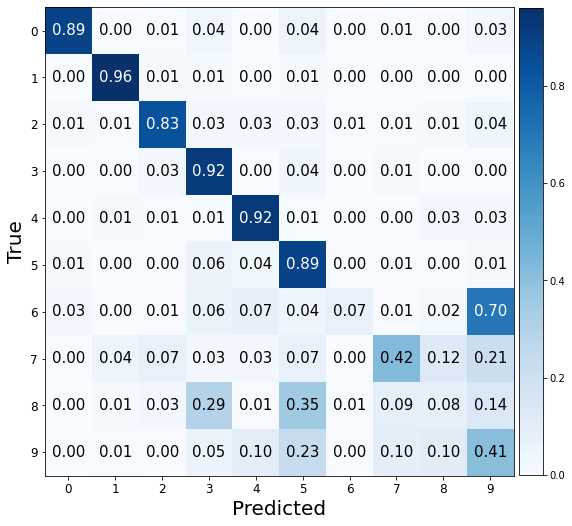

###################

ne: 70, hd:100, wd:0.2, lr: 0.02, bs:600 
Valid Evaluation loss: 0.8216589093208313. f1:0.6939637657340417 acc: 0.7105000019073486 


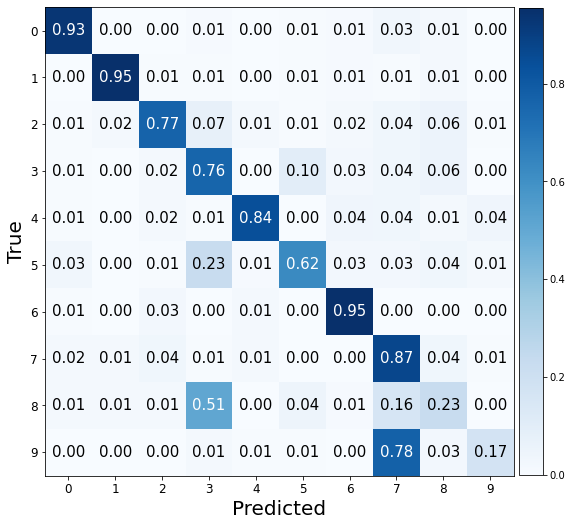

###################

ne: 70, hd:120, wd:0.2, lr: 0.02, bs:600 
Valid Evaluation loss: 0.9136502146720886. f1:0.6912078808801311 acc: 0.6865000128746033 


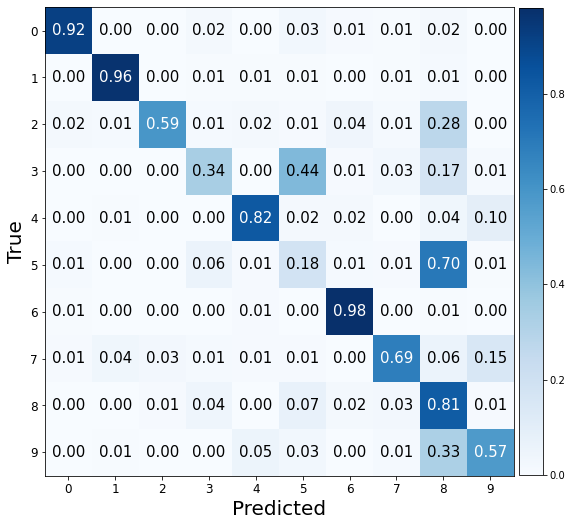

###################

ne: 70, hd:70, wd:0.002, lr: 0.2, bs:600 
Valid Evaluation loss: 2.306284189224243. f1:0.01818181818181818 acc: 0.10000000149011612 


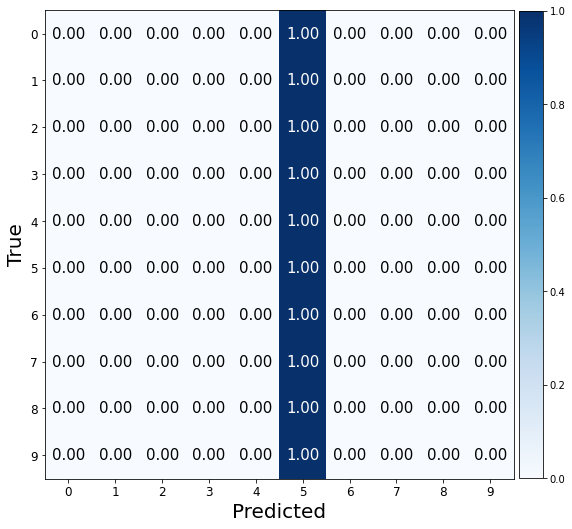

###################

ne: 70, hd:100, wd:0.002, lr: 0.2, bs:600 
Valid Evaluation loss: 2.3028781414031982. f1:0.01818181818181818 acc: 0.10000000149011612 


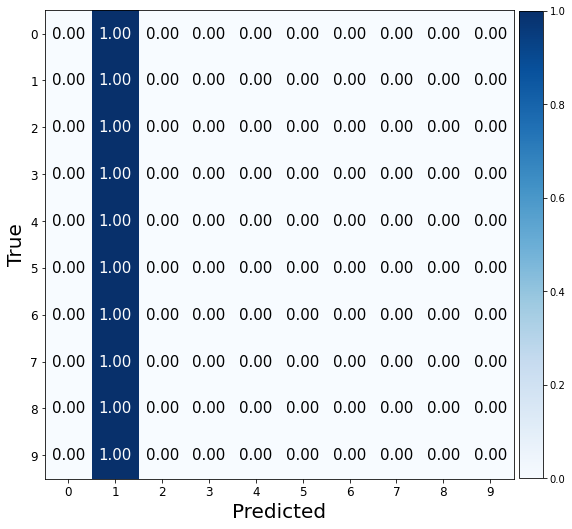

###################

ne: 70, hd:120, wd:0.002, lr: 0.2, bs:600 
Valid Evaluation loss: 2.3047080039978027. f1:0.01818181818181818 acc: 0.10000000149011612 


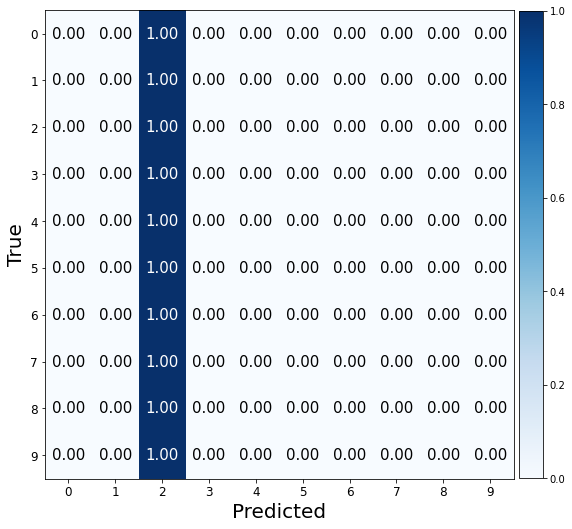

###################

ne: 70, hd:70, wd:0.02, lr: 0.2, bs:600 
Valid Evaluation loss: 2.3083577156066895. f1:0.021156112718311366 acc: 0.1014999970793724 


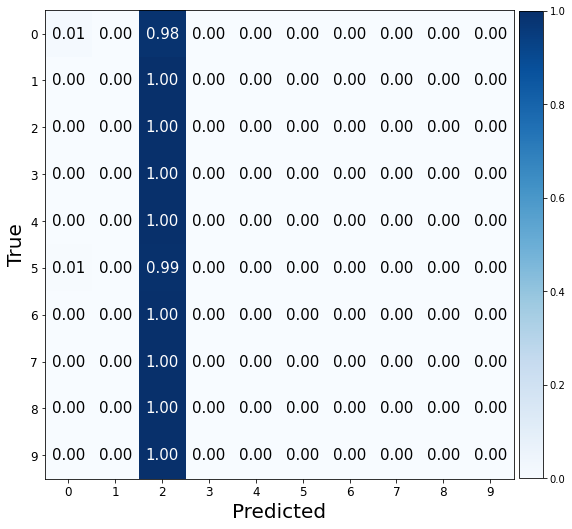

###################

ne: 70, hd:100, wd:0.02, lr: 0.2, bs:600 
Valid Evaluation loss: 2.512106418609619. f1:0.01919186710045718 acc: 0.10050000250339508 


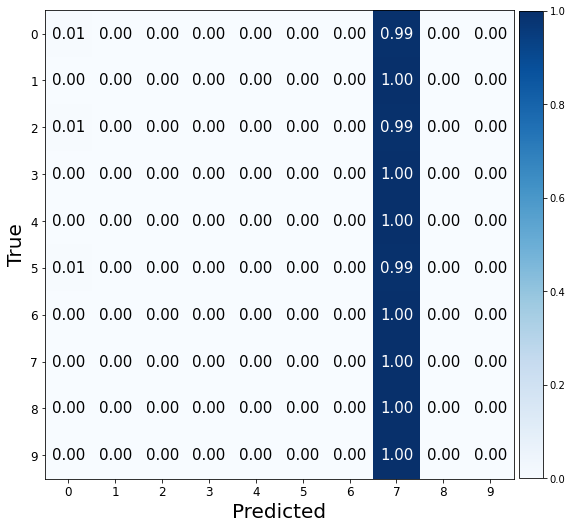

###################

ne: 70, hd:120, wd:0.02, lr: 0.2, bs:600 
Valid Evaluation loss: 14.87880802154541. f1:0.07790364615397004 acc: 0.15199999511241913 


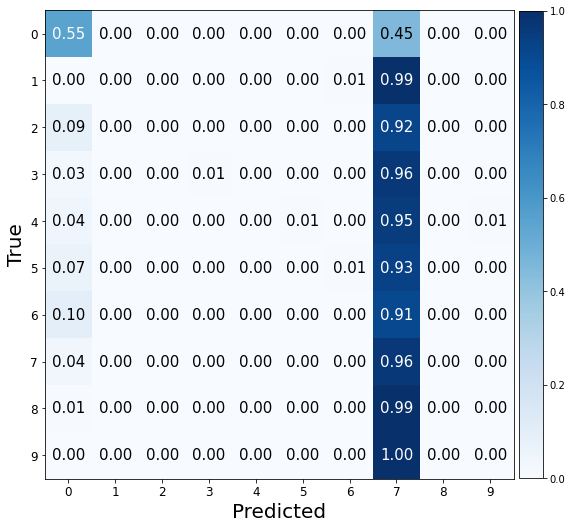

###################

ne: 70, hd:70, wd:0.2, lr: 0.2, bs:600 
Valid Evaluation loss: 2.303133964538574. f1:0.01818181818181818 acc: 0.10000000149011612 


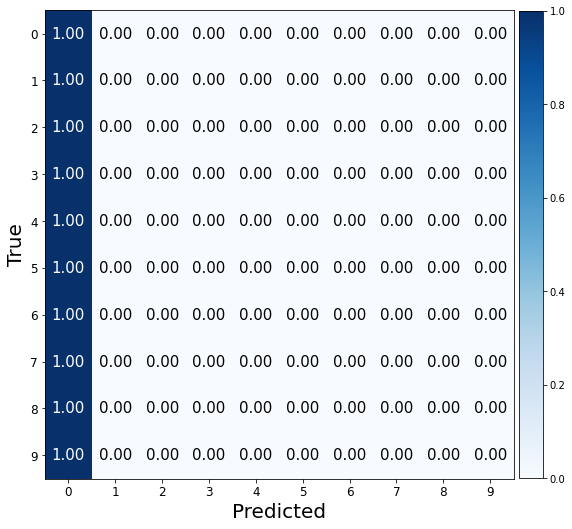

###################

ne: 70, hd:100, wd:0.2, lr: 0.2, bs:600 
Valid Evaluation loss: 3.2726032733917236. f1:0.1357766387429473 acc: 0.18700000643730164 


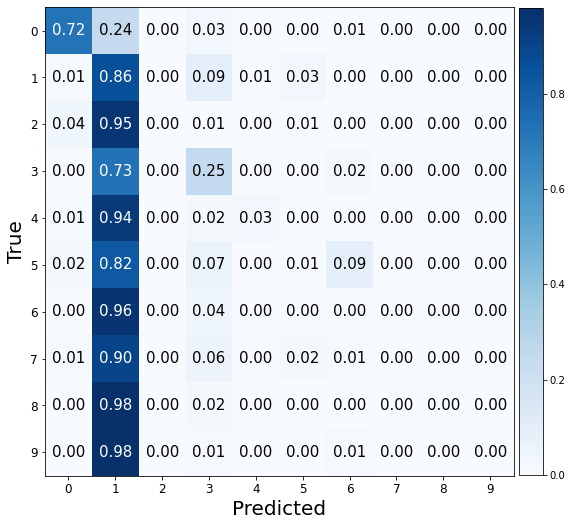

###################

ne: 70, hd:120, wd:0.2, lr: 0.2, bs:600 
Valid Evaluation loss: 2.2765438556671143. f1:0.07318021780070416 acc: 0.13750000298023224 


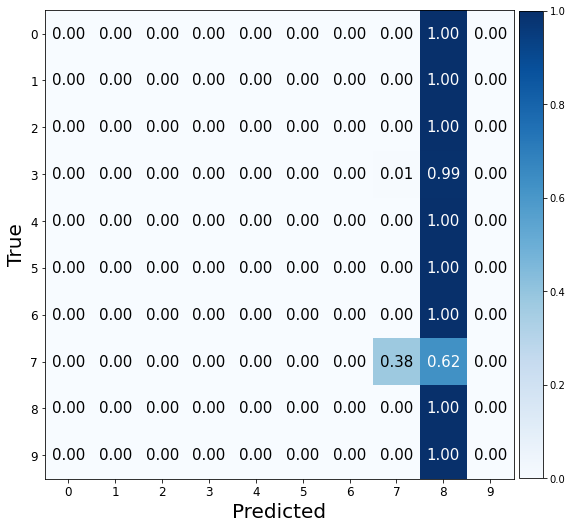

###################

ne: 70, hd:70, wd:0.002, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.3486408591270447. f1:0.9048695907266712 acc: 0.9049999713897705 


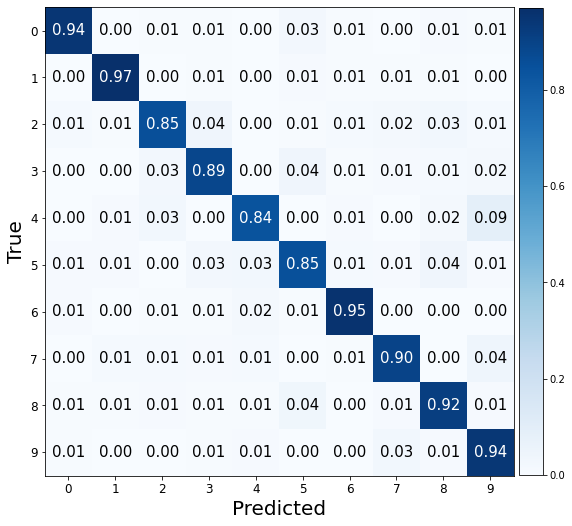

###################

ne: 70, hd:100, wd:0.002, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.35691532492637634. f1:0.9044163403614076 acc: 0.9045000076293945 


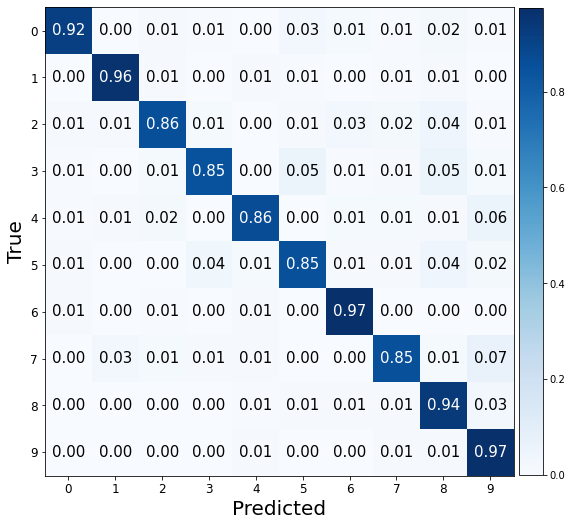

###################

ne: 70, hd:120, wd:0.002, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.39168843626976013. f1:0.8894261129931609 acc: 0.8895000219345093 


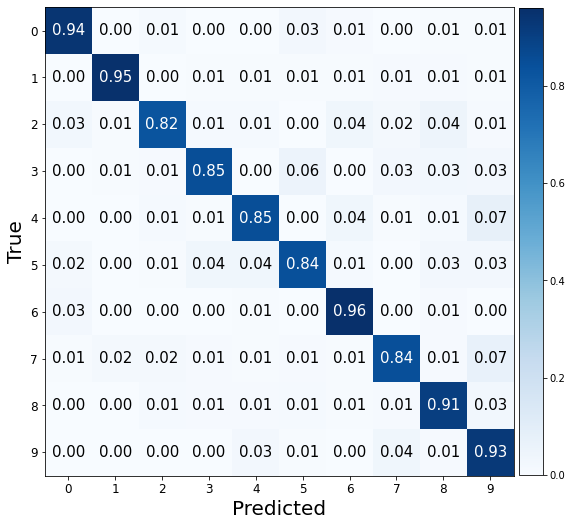

###################

ne: 70, hd:70, wd:0.02, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.3631555140018463. f1:0.892617573376452 acc: 0.8924999833106995 


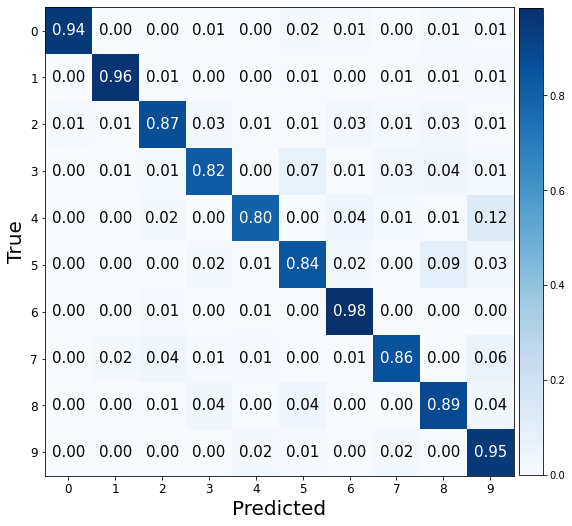

###################

ne: 70, hd:100, wd:0.02, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.29136109352111816. f1:0.9213582584455136 acc: 0.921500027179718 


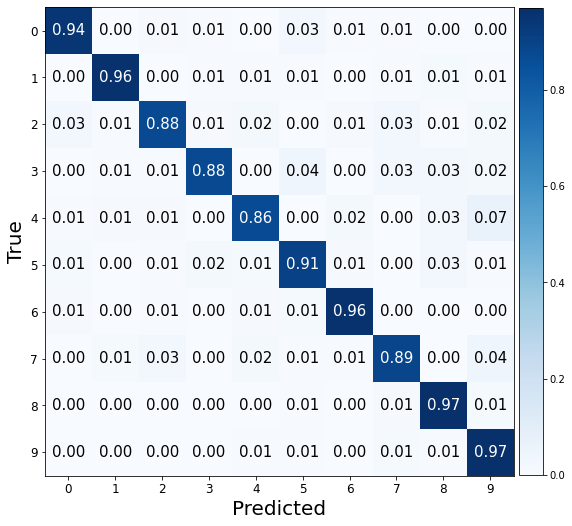

###################

ne: 70, hd:120, wd:0.02, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.31424760818481445. f1:0.9098025314280462 acc: 0.9100000262260437 


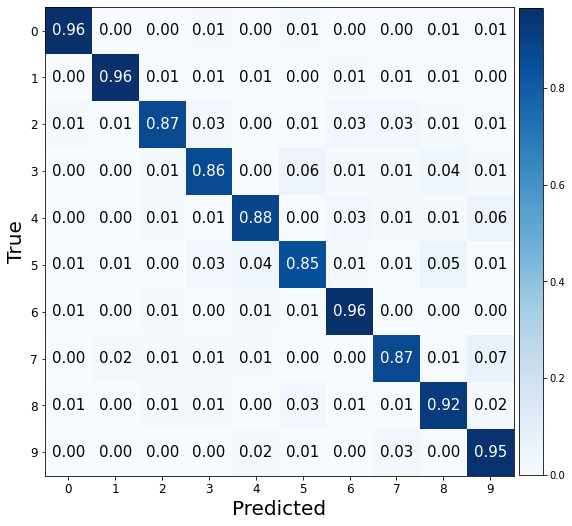

###################

ne: 70, hd:70, wd:0.2, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.32635462284088135. f1:0.8991980238485372 acc: 0.8995000123977661 


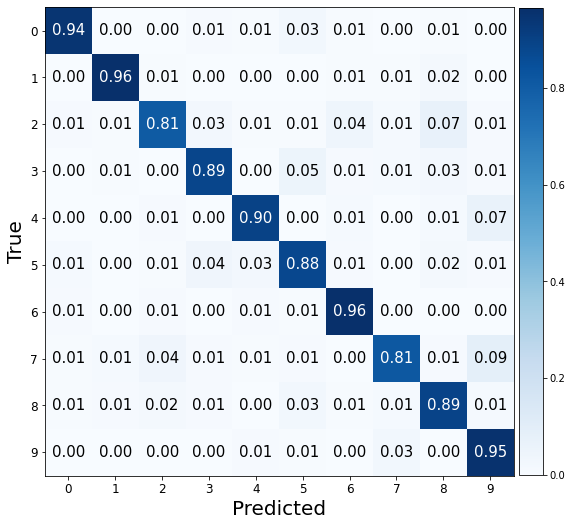

###################

ne: 70, hd:100, wd:0.2, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.34011659026145935. f1:0.8963025910932441 acc: 0.8964999914169312 


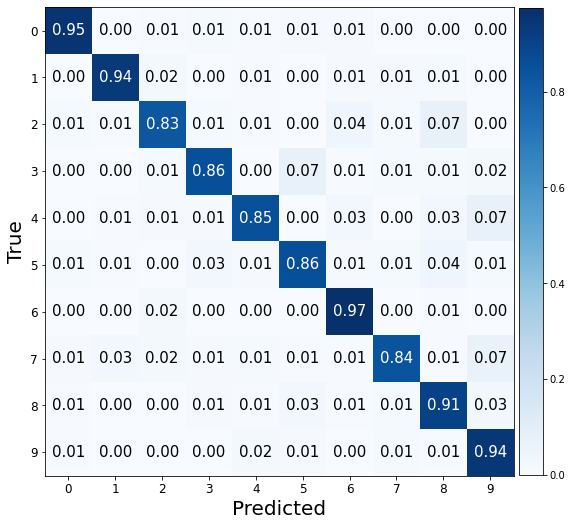

###################

ne: 70, hd:120, wd:0.2, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.25629860162734985. f1:0.9177164812470509 acc: 0.9179999828338623 


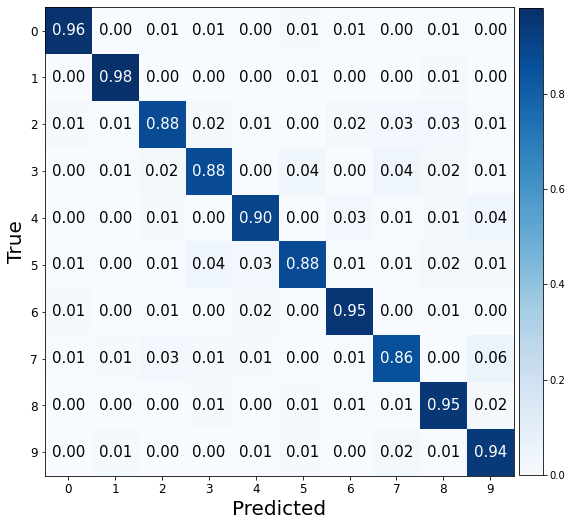

###################

ne: 70, hd:70, wd:0.002, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.0923779010772705. f1:0.5677164737785805 acc: 0.6115000247955322 


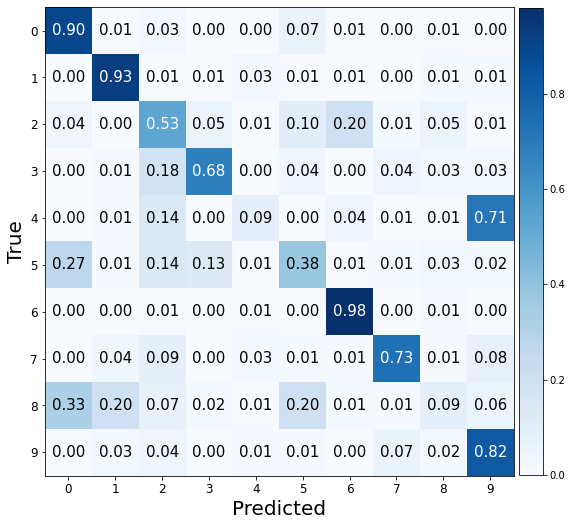

###################

ne: 70, hd:100, wd:0.002, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.9840058088302612. f1:0.18740150835883032 acc: 0.2475000023841858 


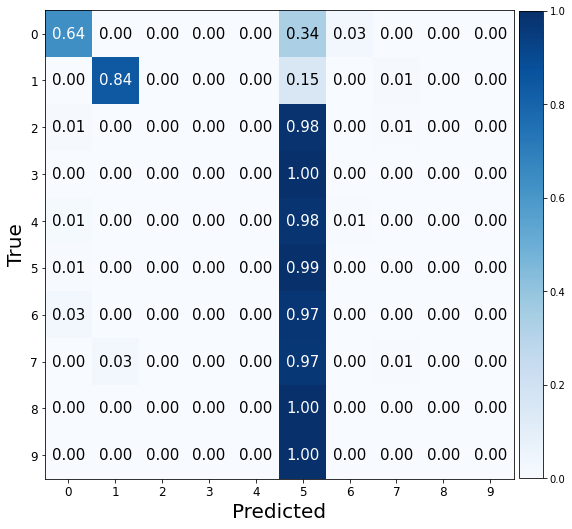

###################

ne: 70, hd:120, wd:0.002, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.5908589363098145. f1:0.4810928077930311 acc: 0.5049999952316284 


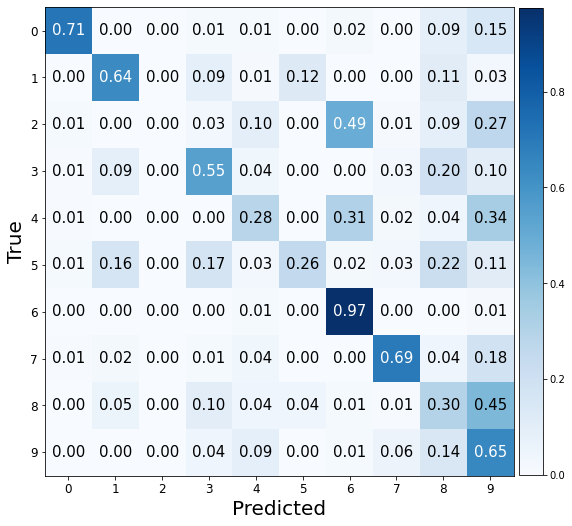

###################

ne: 70, hd:70, wd:0.02, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.2743096351623535. f1:0.49733452906946696 acc: 0.5385000109672546 


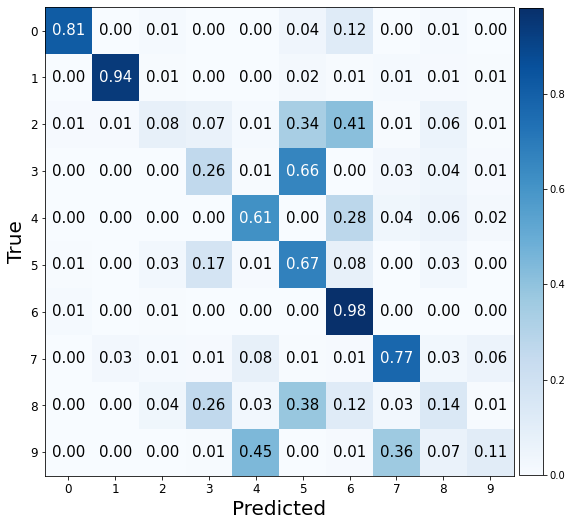

###################

ne: 70, hd:100, wd:0.02, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.893218755722046. f1:0.3671330568538332 acc: 0.4099999964237213 


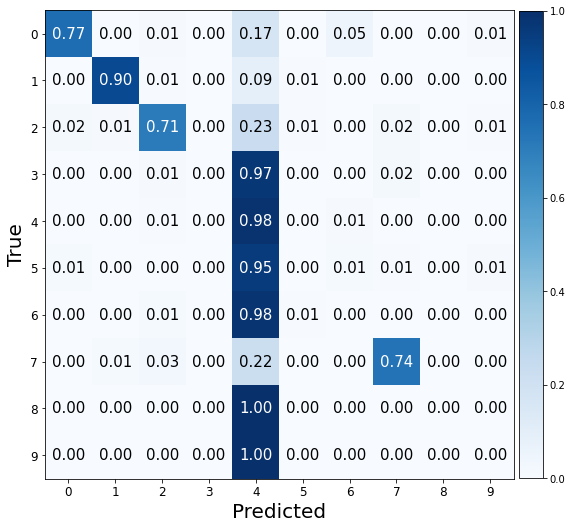

###################

ne: 70, hd:120, wd:0.02, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.6356137990951538. f1:0.35827153118937605 acc: 0.39649999141693115 


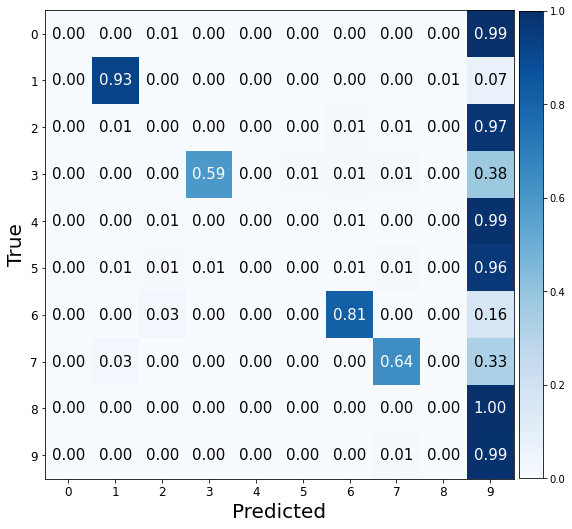

###################

ne: 70, hd:70, wd:0.2, lr: 0.02, bs:1100 
Valid Evaluation loss: 2.073103666305542. f1:0.12121541661882063 acc: 0.19050000607967377 


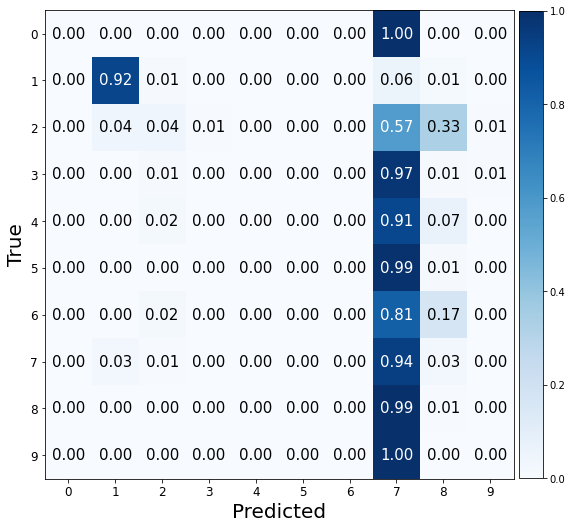

###################

ne: 70, hd:100, wd:0.2, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.4829291105270386. f1:0.5540244384220401 acc: 0.6119999885559082 


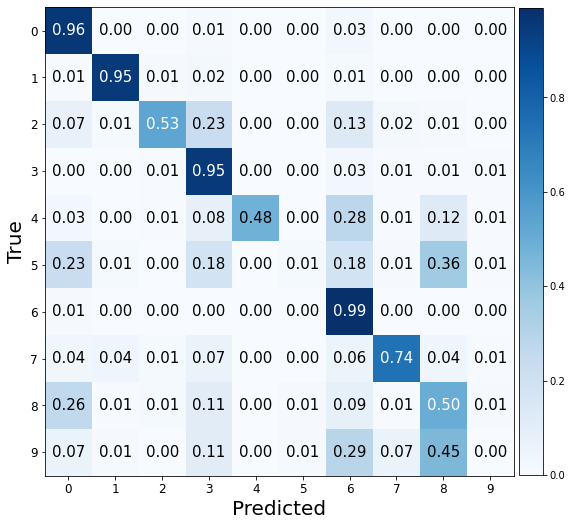

###################

ne: 70, hd:120, wd:0.2, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.8711066246032715. f1:0.5628255953309629 acc: 0.612500011920929 


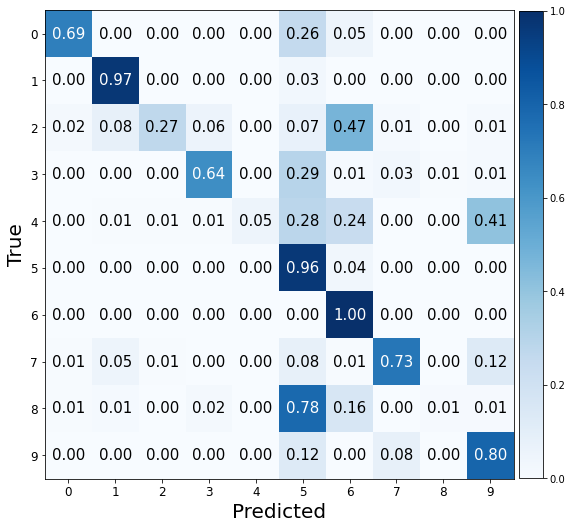

###################

ne: 70, hd:70, wd:0.002, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.3026740550994873. f1:0.01818181818181818 acc: 0.10000000149011612 


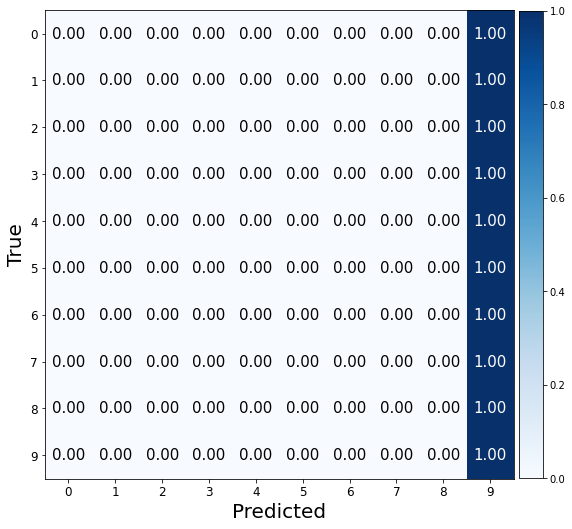

###################

ne: 70, hd:100, wd:0.002, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.3026235103607178. f1:0.01818181818181818 acc: 0.10000000149011612 


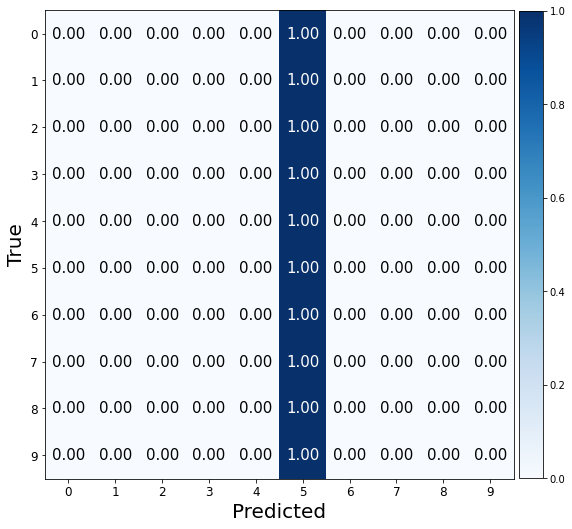

###################

ne: 70, hd:120, wd:0.002, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.306335926055908. f1:0.01818181818181818 acc: 0.10000000149011612 


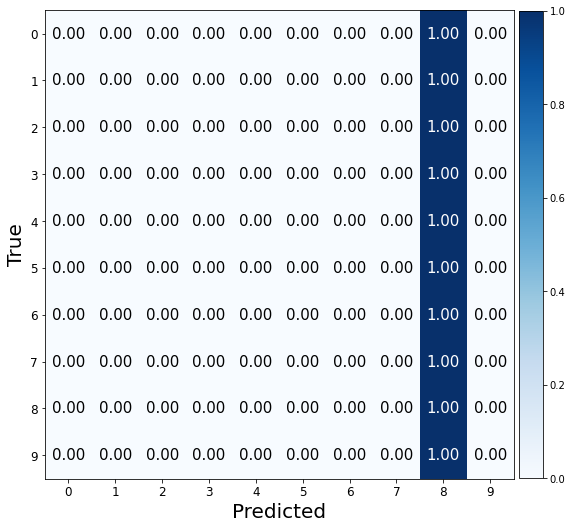

###################

ne: 70, hd:70, wd:0.02, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.2997777462005615. f1:0.021162310450210876 acc: 0.1014999970793724 


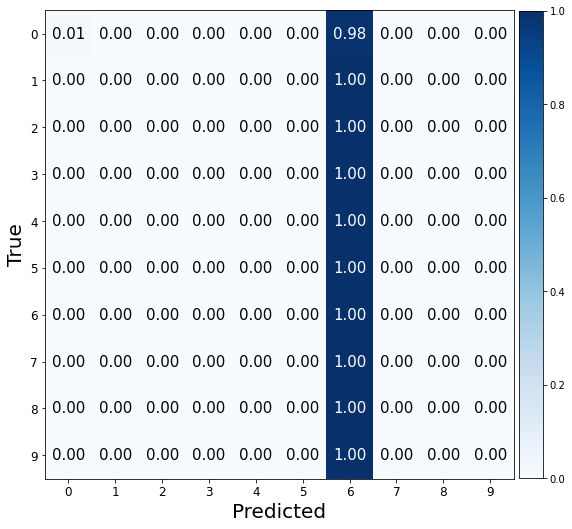

###################

ne: 70, hd:100, wd:0.02, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.3399884700775146. f1:0.01911063707407433 acc: 0.10000000149011612 


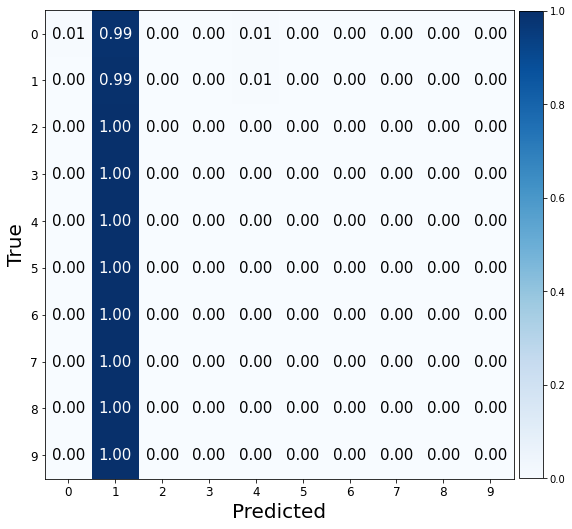

###################

ne: 70, hd:120, wd:0.02, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.740307331085205. f1:0.06429398707714726 acc: 0.12999999523162842 


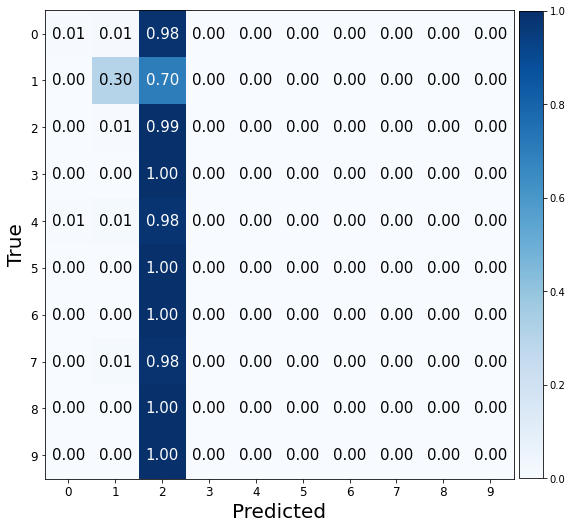

###################

ne: 70, hd:70, wd:0.2, lr: 0.2, bs:1100 
Valid Evaluation loss: 4.682955741882324. f1:0.16839344370547438 acc: 0.20649999380111694 


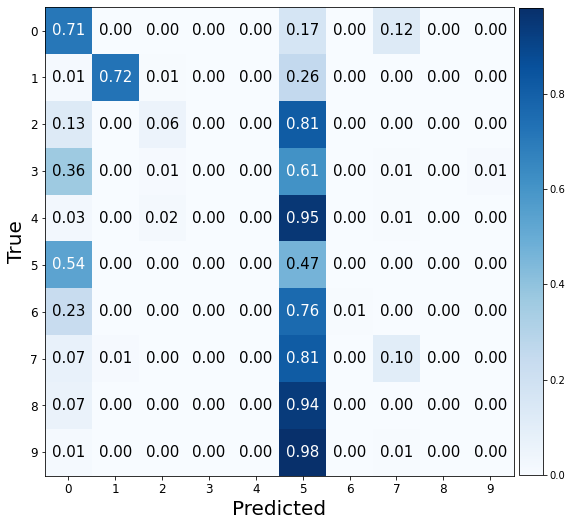

###################

ne: 70, hd:100, wd:0.2, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.5749731063842773. f1:0.017715617715617714 acc: 0.0949999988079071 


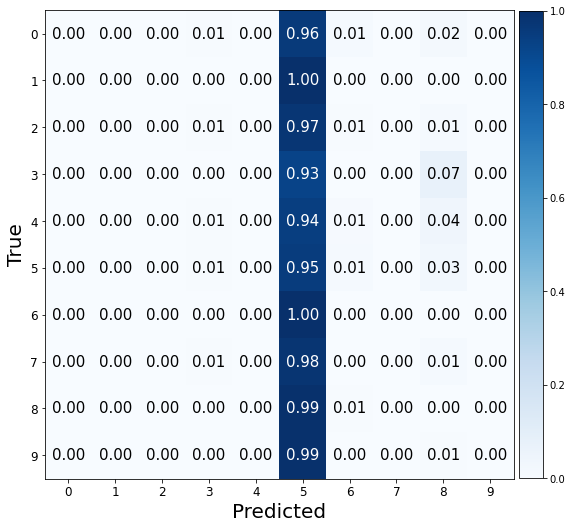

###################

ne: 70, hd:120, wd:0.2, lr: 0.2, bs:1100 
Valid Evaluation loss: 574.50439453125. f1:0.01818181818181818 acc: 0.10000000149011612 


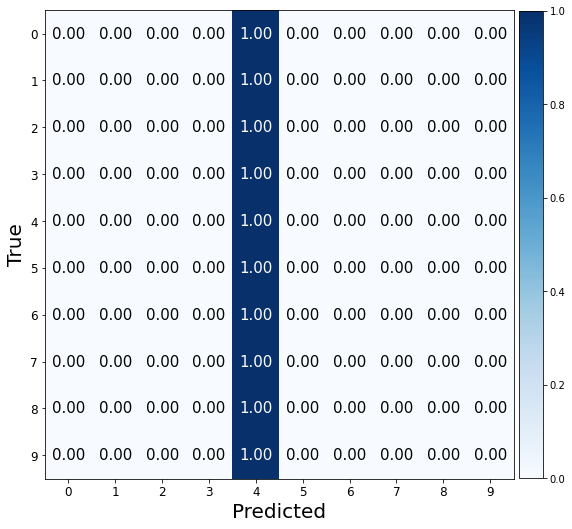

###################

ne: 130, hd:70, wd:0.002, lr: 0.002, bs:300 
Valid Evaluation loss: 0.34529876708984375. f1:0.9162183980896854 acc: 0.9164999723434448 


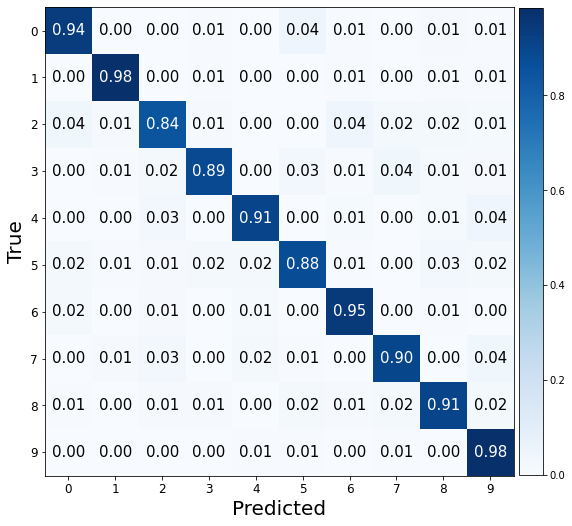

###################

ne: 130, hd:100, wd:0.002, lr: 0.002, bs:300 
Valid Evaluation loss: 0.37011876702308655. f1:0.9151257445559942 acc: 0.9150000214576721 


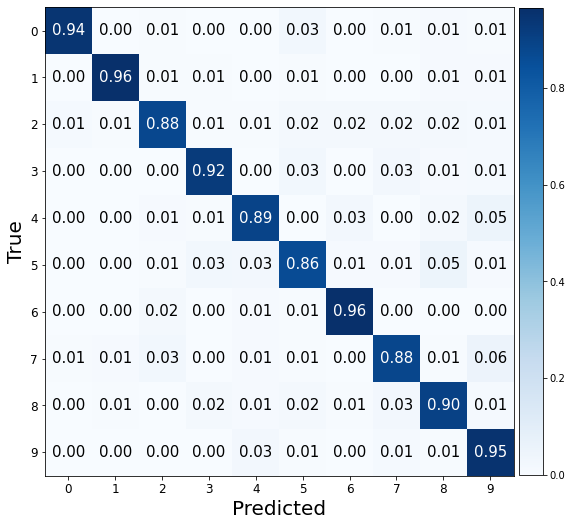

###################

ne: 130, hd:120, wd:0.002, lr: 0.002, bs:300 
Valid Evaluation loss: 0.33293524384498596. f1:0.924194026719943 acc: 0.9244999885559082 


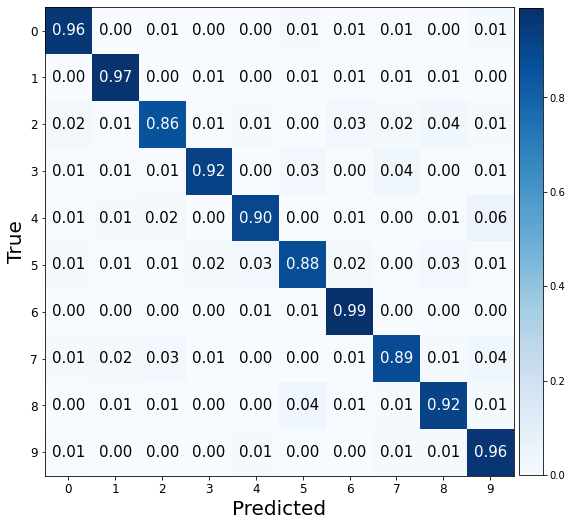

###################

ne: 130, hd:70, wd:0.02, lr: 0.002, bs:300 
Valid Evaluation loss: 0.32026445865631104. f1:0.9217894547895771 acc: 0.921999990940094 


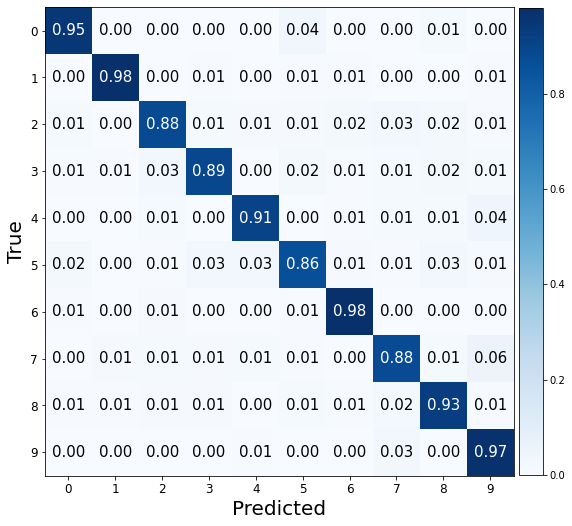

###################

ne: 130, hd:100, wd:0.02, lr: 0.002, bs:300 
Valid Evaluation loss: 0.3261564373970032. f1:0.9087559595482164 acc: 0.9089999794960022 


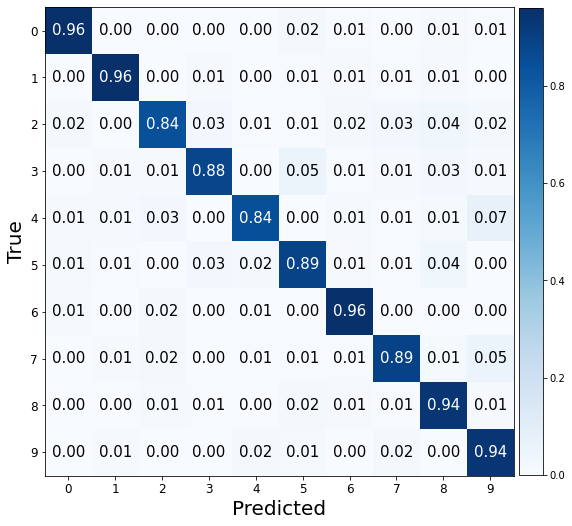

###################

ne: 130, hd:120, wd:0.02, lr: 0.002, bs:300 
Valid Evaluation loss: 0.2484118789434433. f1:0.9261981511711619 acc: 0.9265000224113464 


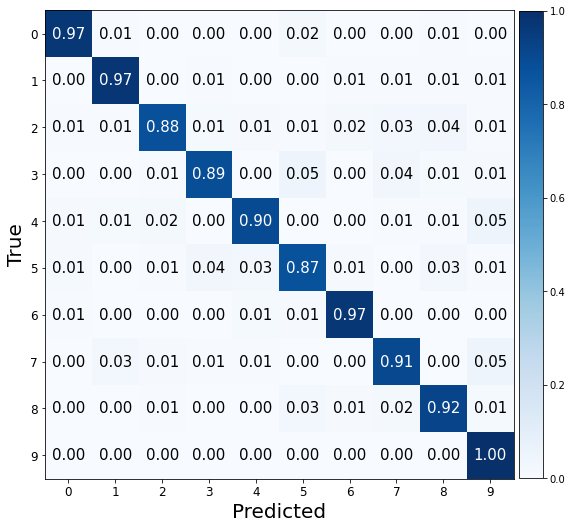

###################

ne: 130, hd:70, wd:0.2, lr: 0.002, bs:300 
Valid Evaluation loss: 0.23008228838443756. f1:0.9308388409736799 acc: 0.9309999942779541 


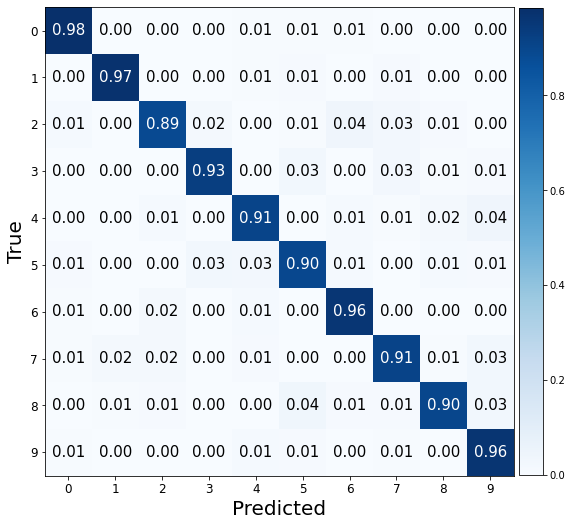

###################

ne: 130, hd:100, wd:0.2, lr: 0.002, bs:300 
Valid Evaluation loss: 0.2321115881204605. f1:0.9249168126955531 acc: 0.925000011920929 


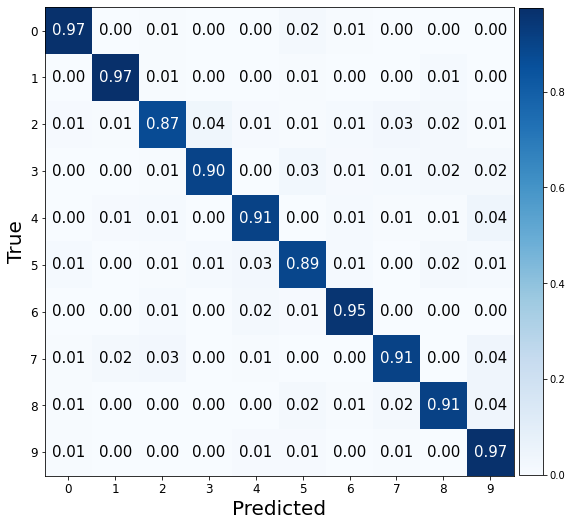

###################

ne: 130, hd:120, wd:0.2, lr: 0.002, bs:300 
Valid Evaluation loss: 0.21193554997444153. f1:0.9318185334570565 acc: 0.9319999814033508 


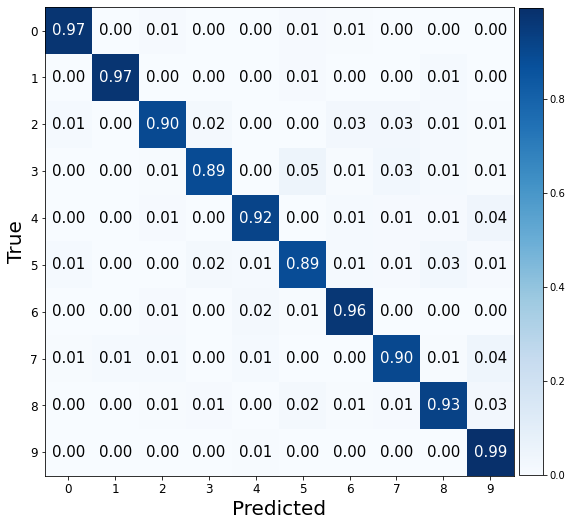

###################

ne: 130, hd:70, wd:0.002, lr: 0.02, bs:300 
Valid Evaluation loss: 2.2016677856445312. f1:0.1729273465485307 acc: 0.2615000009536743 


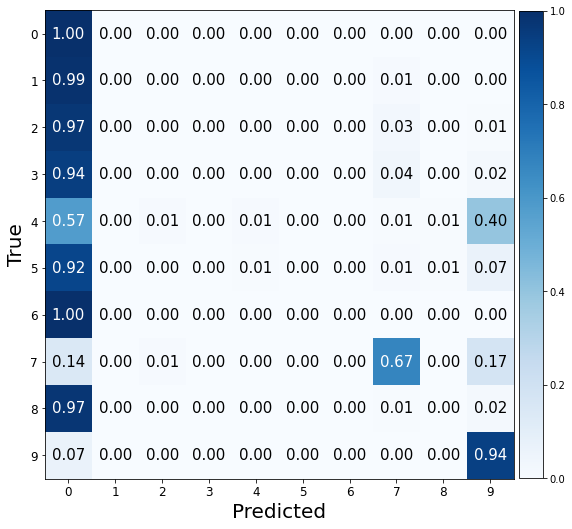

###################

ne: 130, hd:100, wd:0.002, lr: 0.02, bs:300 
Valid Evaluation loss: 2.145127058029175. f1:0.1012565500873345 acc: 0.17499999701976776 


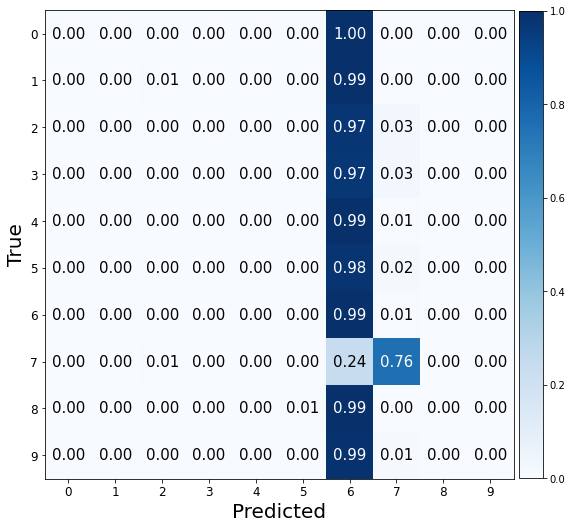

###################

ne: 130, hd:120, wd:0.002, lr: 0.02, bs:300 
Valid Evaluation loss: 1.801376461982727. f1:0.2983387401729714 acc: 0.35749998688697815 


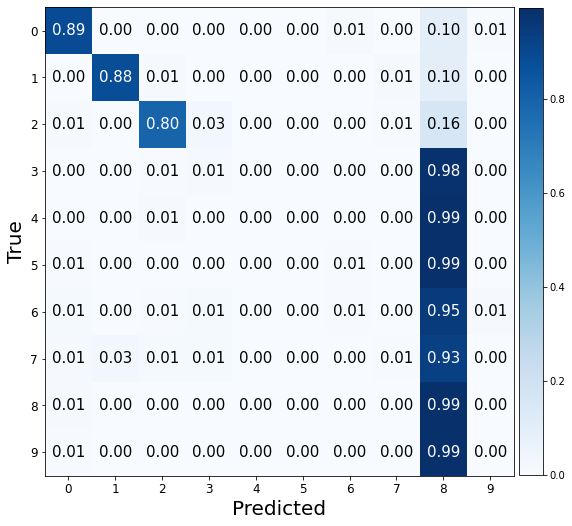

###################

ne: 130, hd:70, wd:0.02, lr: 0.02, bs:300 
Valid Evaluation loss: 1.514080286026001. f1:0.40171575981962365 acc: 0.46700000762939453 


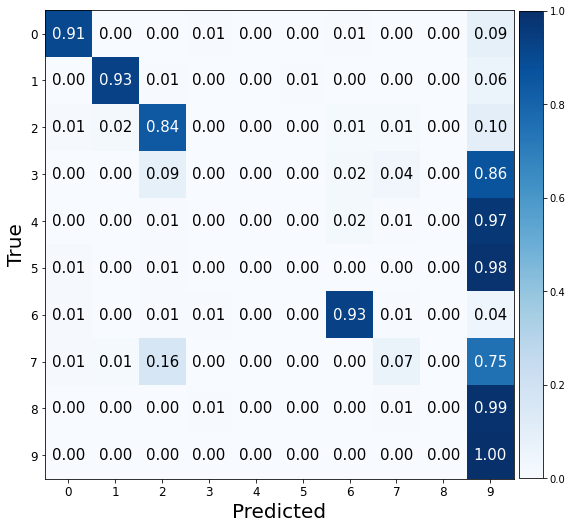

###################

ne: 130, hd:100, wd:0.02, lr: 0.02, bs:300 
Valid Evaluation loss: 1.916121482849121. f1:0.34220459056832686 acc: 0.38499999046325684 


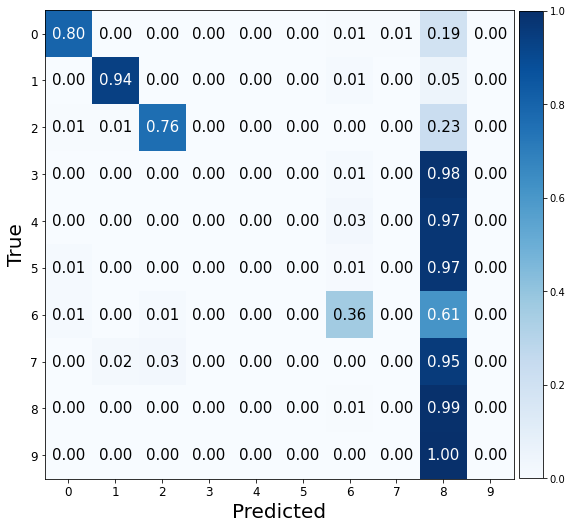

###################

ne: 130, hd:120, wd:0.02, lr: 0.02, bs:300 
Valid Evaluation loss: 1.9749315977096558. f1:0.19836551138441533 acc: 0.2615000009536743 


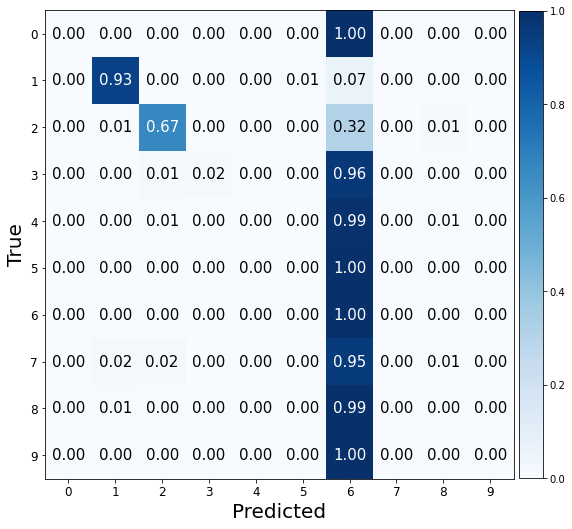

###################

ne: 130, hd:70, wd:0.2, lr: 0.02, bs:300 
Valid Evaluation loss: 1.738950252532959. f1:0.2727368107004028 acc: 0.3564999997615814 


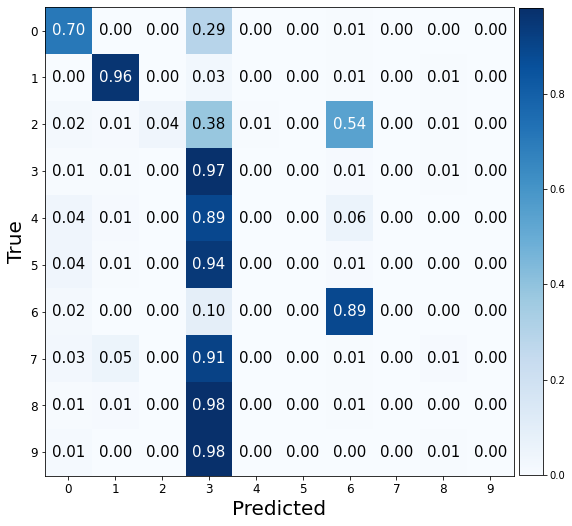

###################

ne: 130, hd:100, wd:0.2, lr: 0.02, bs:300 
Valid Evaluation loss: 1.2923085689544678. f1:0.5858030677335999 acc: 0.5809999704360962 


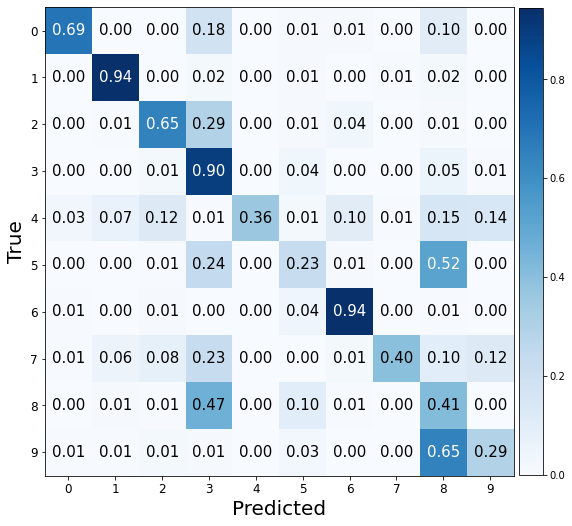

###################

ne: 130, hd:120, wd:0.2, lr: 0.02, bs:300 
Valid Evaluation loss: 0.5224276185035706. f1:0.8320908967691935 acc: 0.8320000171661377 


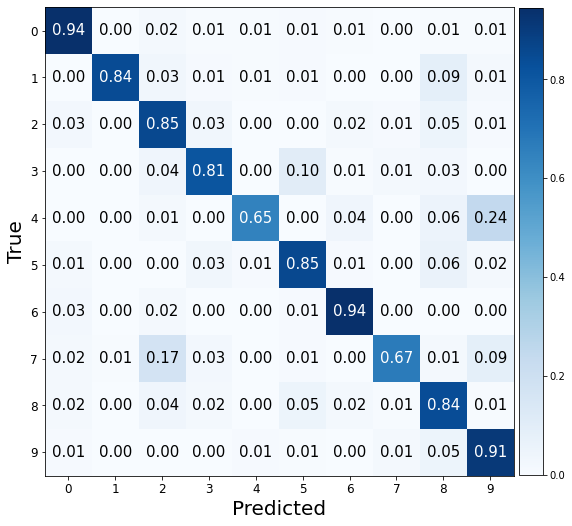

###################

ne: 130, hd:70, wd:0.002, lr: 0.2, bs:300 
Valid Evaluation loss: 2.3028552532196045. f1:0.01818181818181818 acc: 0.10000000149011612 


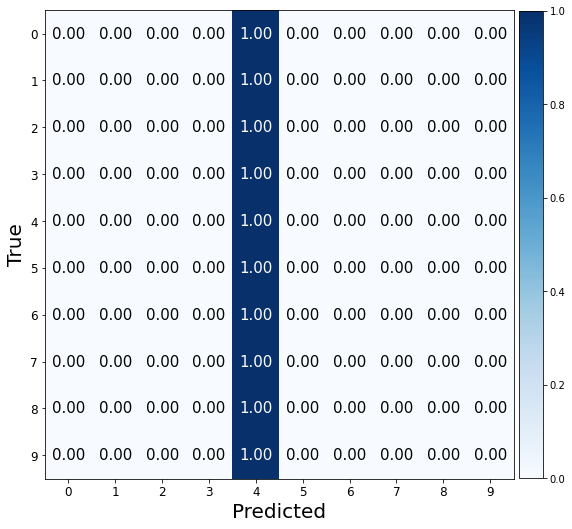

###################

ne: 130, hd:100, wd:0.002, lr: 0.2, bs:300 
Valid Evaluation loss: 2.303410291671753. f1:0.01818181818181818 acc: 0.10000000149011612 


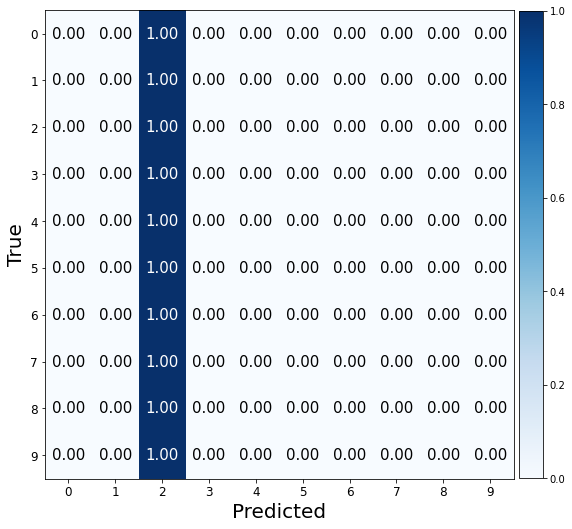

###################

ne: 130, hd:120, wd:0.002, lr: 0.2, bs:300 
Valid Evaluation loss: 2.30261492729187. f1:0.01818181818181818 acc: 0.10000000149011612 


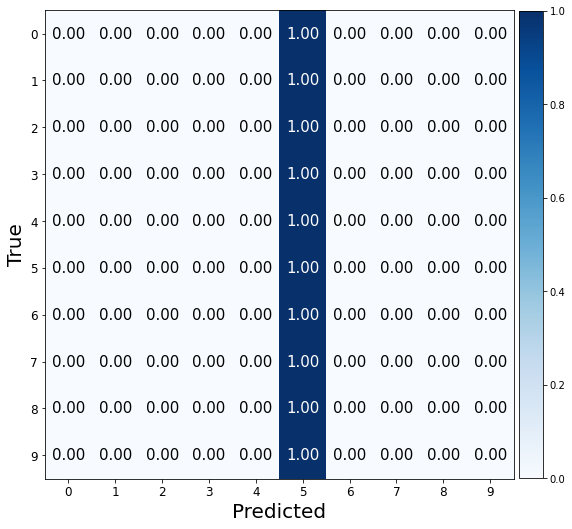

###################

ne: 130, hd:70, wd:0.02, lr: 0.2, bs:300 
Valid Evaluation loss: 2.3030788898468018. f1:0.01818181818181818 acc: 0.10000000149011612 


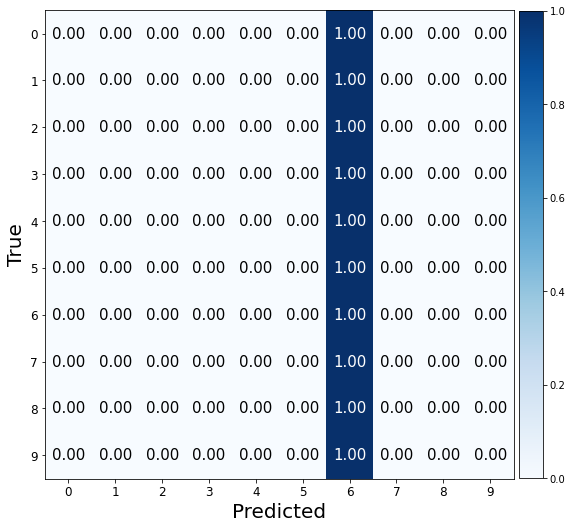

###################

ne: 130, hd:100, wd:0.02, lr: 0.2, bs:300 
Valid Evaluation loss: 2.37461256980896. f1:0.021173668254363058 acc: 0.10100000351667404 


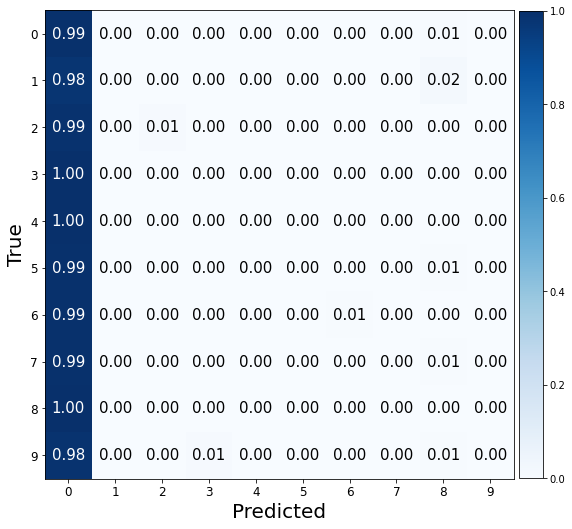

###################

ne: 130, hd:120, wd:0.02, lr: 0.2, bs:300 
Valid Evaluation loss: 2.3723599910736084. f1:0.02941967143161937 acc: 0.1054999977350235 


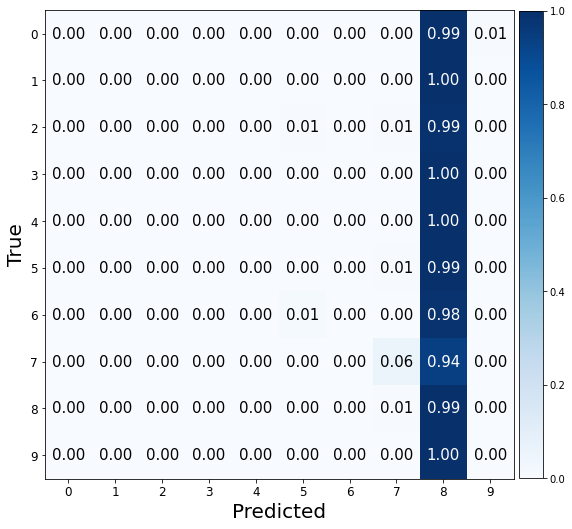

###################

ne: 130, hd:70, wd:0.2, lr: 0.2, bs:300 
Valid Evaluation loss: 3599.034423828125. f1:0.045934838916465257 acc: 0.13300000131130219 


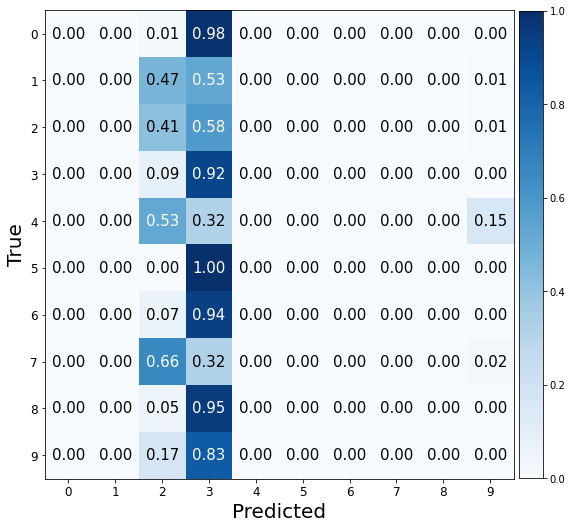

###################

ne: 130, hd:100, wd:0.2, lr: 0.2, bs:300 
Valid Evaluation loss: 2.302593946456909. f1:0.01818181818181818 acc: 0.10000000149011612 


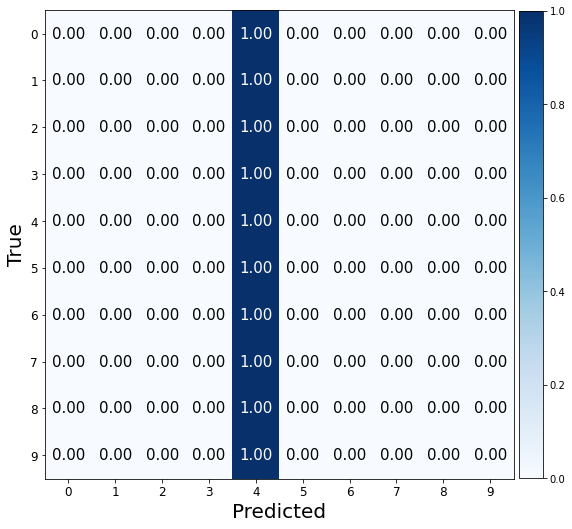

###################

ne: 130, hd:120, wd:0.2, lr: 0.2, bs:300 
Valid Evaluation loss: 2.3033111095428467. f1:0.01818181818181818 acc: 0.10000000149011612 


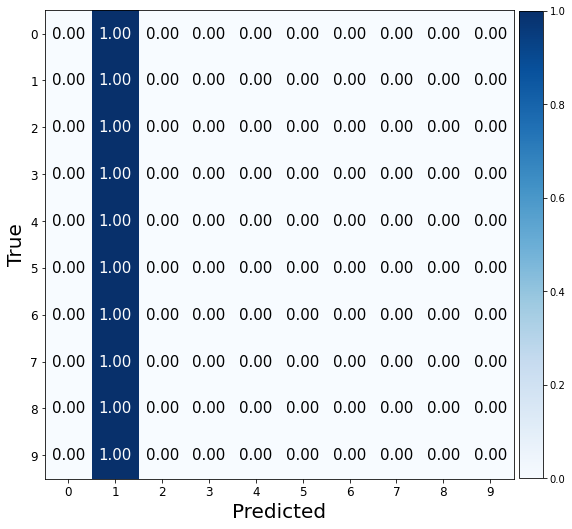

###################

ne: 130, hd:70, wd:0.002, lr: 0.002, bs:600 
Valid Evaluation loss: 0.36104652285575867. f1:0.9085034185175322 acc: 0.9085000157356262 


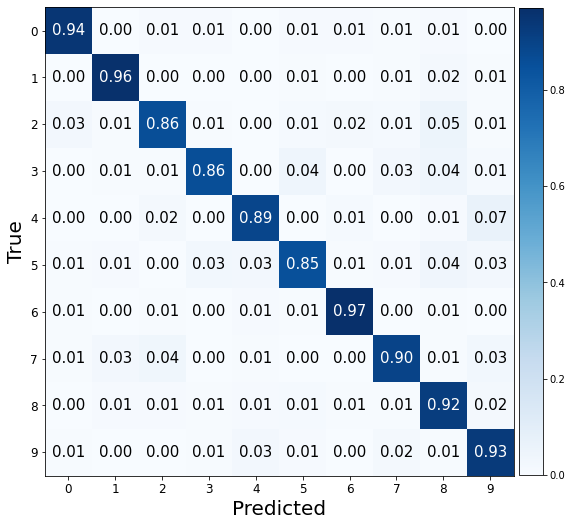

###################

ne: 130, hd:100, wd:0.002, lr: 0.002, bs:600 
Valid Evaluation loss: 0.30383241176605225. f1:0.9277545198752548 acc: 0.9279999732971191 


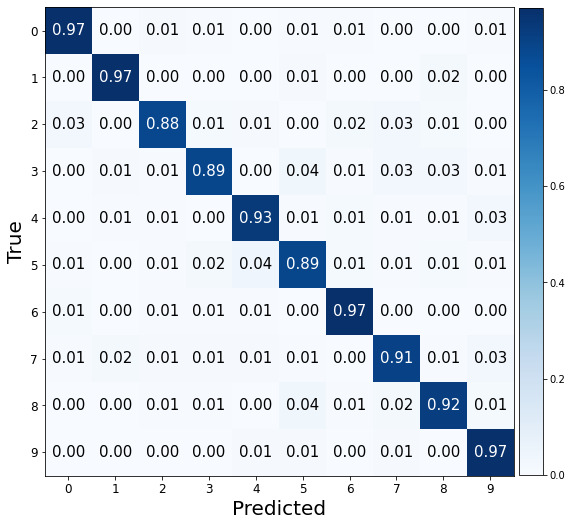

###################

ne: 130, hd:120, wd:0.002, lr: 0.002, bs:600 
Valid Evaluation loss: 0.3393511176109314. f1:0.9177679580740634 acc: 0.9179999828338623 


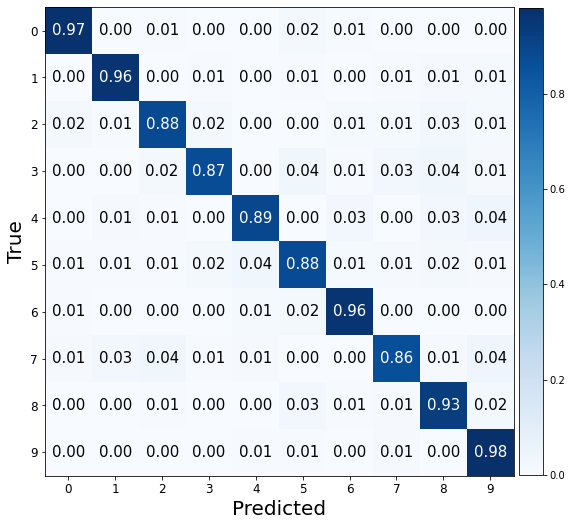

###################

ne: 130, hd:70, wd:0.02, lr: 0.002, bs:600 
Valid Evaluation loss: 0.3549346625804901. f1:0.9082870564525566 acc: 0.9085000157356262 


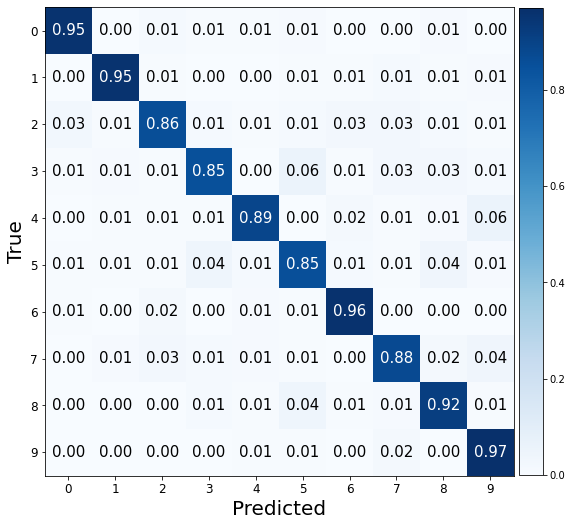

###################

ne: 130, hd:100, wd:0.02, lr: 0.002, bs:600 
Valid Evaluation loss: 0.28234994411468506. f1:0.9193476938526859 acc: 0.9194999933242798 


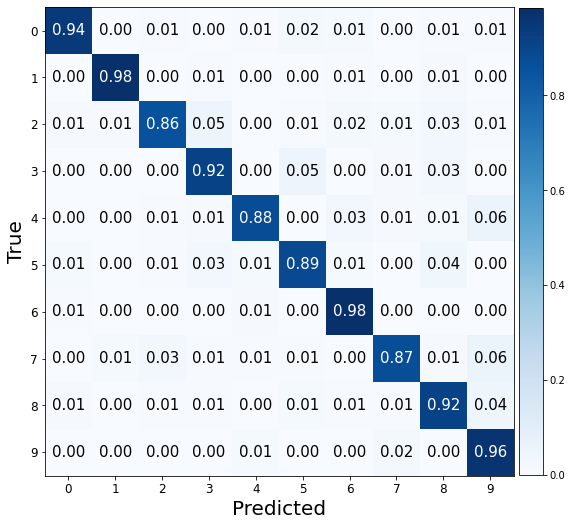

###################

ne: 130, hd:120, wd:0.02, lr: 0.002, bs:600 
Valid Evaluation loss: 0.2778928577899933. f1:0.920519389655165 acc: 0.9204999804496765 


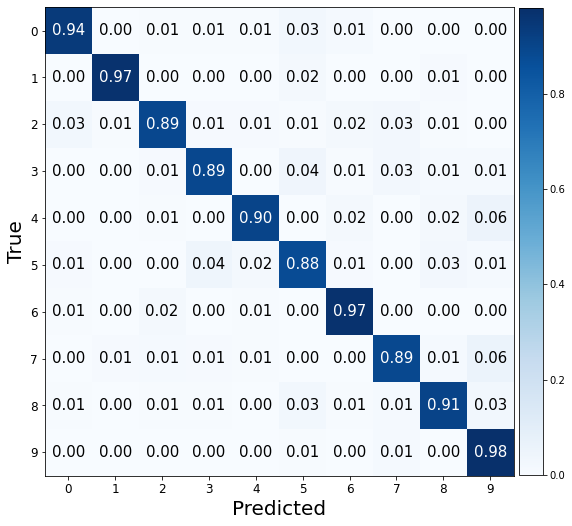

###################

ne: 130, hd:70, wd:0.2, lr: 0.002, bs:600 
Valid Evaluation loss: 0.23720255494117737. f1:0.9262907562520415 acc: 0.9265000224113464 


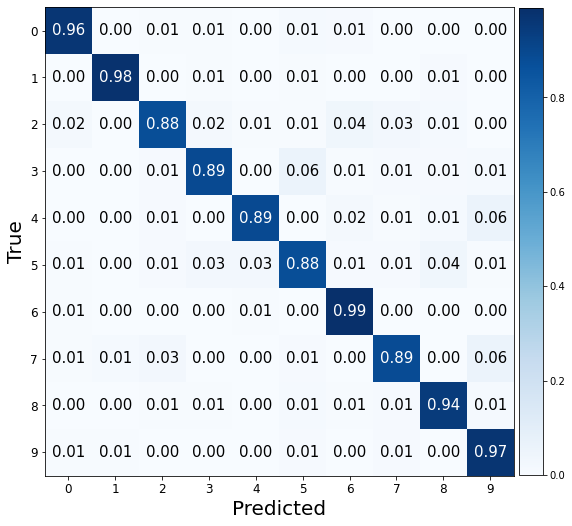

###################

ne: 130, hd:100, wd:0.2, lr: 0.002, bs:600 
Valid Evaluation loss: 0.24417683482170105. f1:0.9277453256389636 acc: 0.9279999732971191 


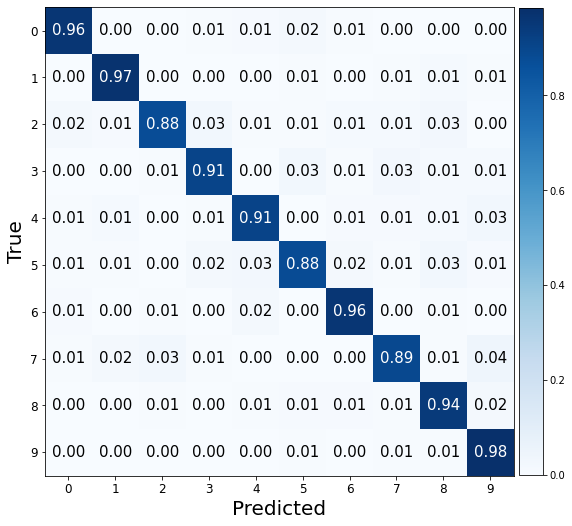

###################

ne: 130, hd:120, wd:0.2, lr: 0.002, bs:600 
Valid Evaluation loss: 0.25056251883506775. f1:0.9247578674179637 acc: 0.925000011920929 


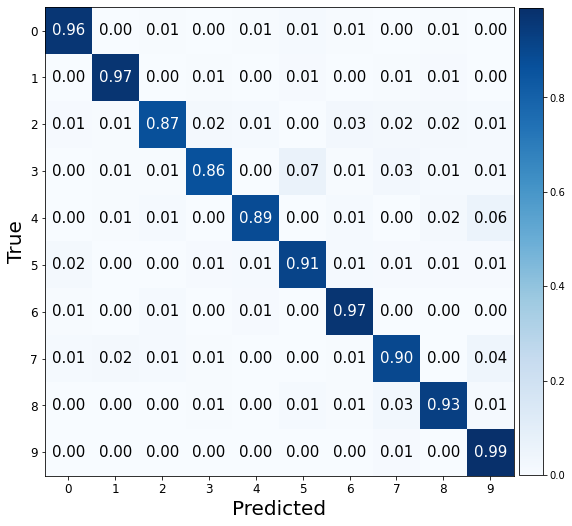

###################

ne: 130, hd:70, wd:0.002, lr: 0.02, bs:600 
Valid Evaluation loss: 1.4274235963821411. f1:0.5518292253917838 acc: 0.5835000276565552 


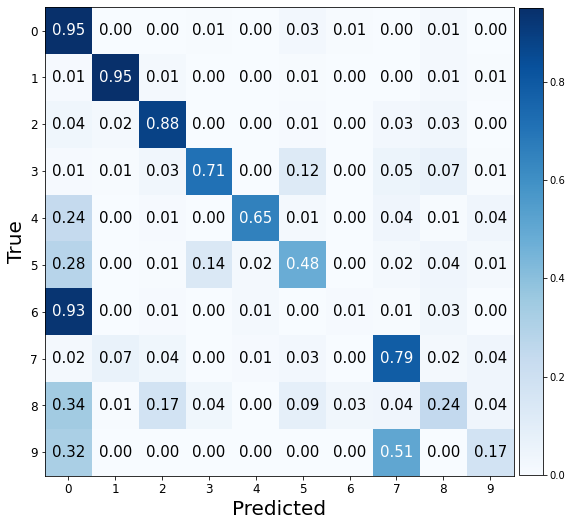

###################

ne: 130, hd:100, wd:0.002, lr: 0.02, bs:600 
Valid Evaluation loss: 1.9317082166671753. f1:0.2780145463123313 acc: 0.33250001072883606 


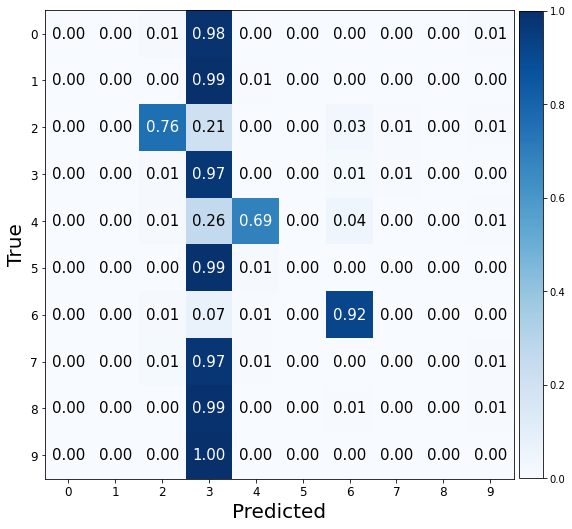

###################

ne: 130, hd:120, wd:0.002, lr: 0.02, bs:600 
Valid Evaluation loss: 2.0995655059814453. f1:0.2720474063748689 acc: 0.3269999921321869 


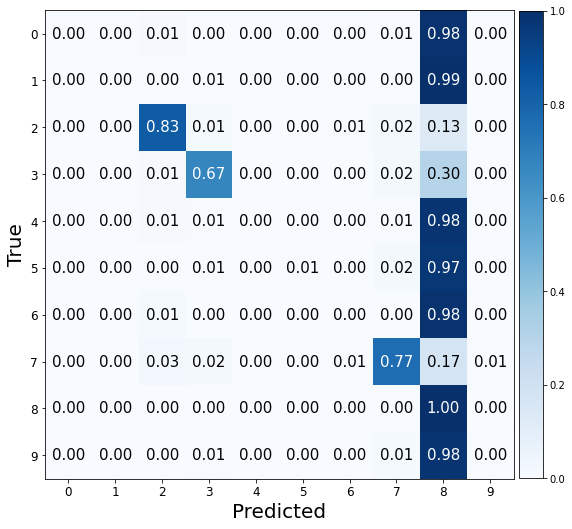

###################

ne: 130, hd:70, wd:0.02, lr: 0.02, bs:600 
Valid Evaluation loss: 2.3025920391082764. f1:0.01818181818181818 acc: 0.10000000149011612 


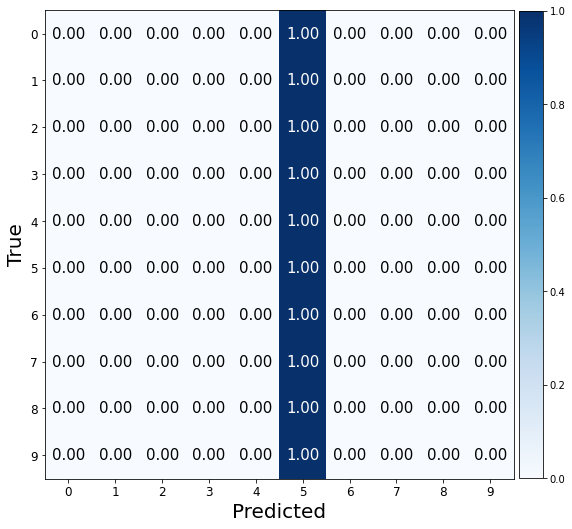

###################

ne: 130, hd:100, wd:0.02, lr: 0.02, bs:600 
Valid Evaluation loss: 2.3008718490600586. f1:0.1025571061455767 acc: 0.17599999904632568 


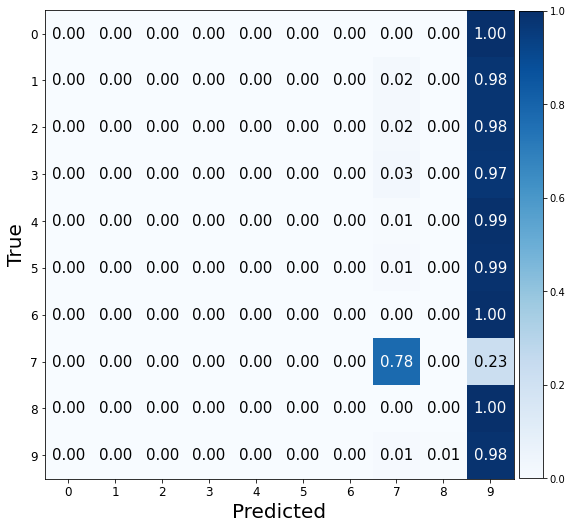

###################

ne: 130, hd:120, wd:0.02, lr: 0.02, bs:600 
Valid Evaluation loss: 1.3900195360183716. f1:0.4850421373448285 acc: 0.5419999957084656 


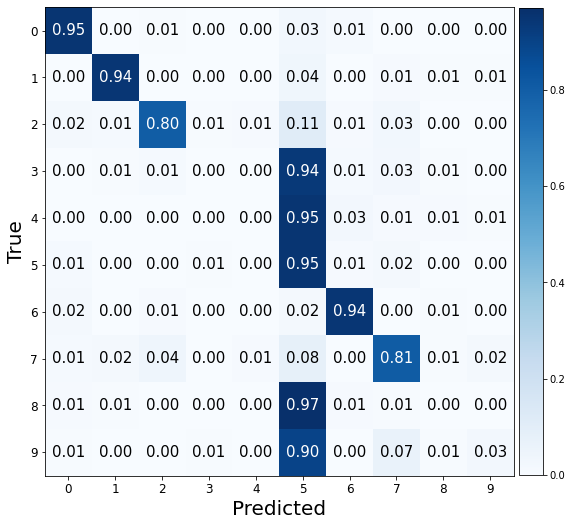

###################

ne: 130, hd:70, wd:0.2, lr: 0.02, bs:600 
Valid Evaluation loss: 1.1178034543991089. f1:0.5974999327307448 acc: 0.6290000081062317 


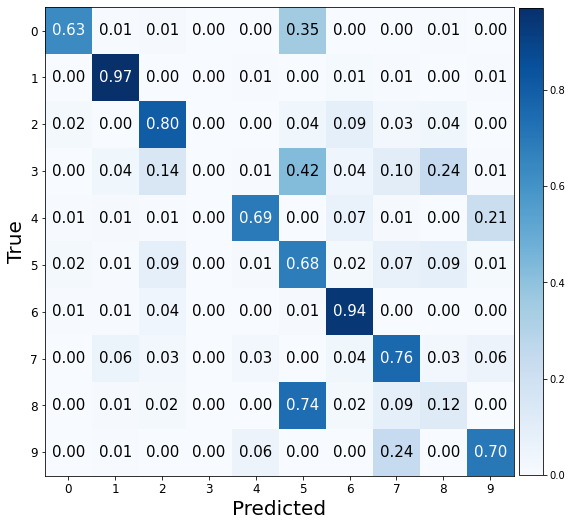

###################

ne: 130, hd:100, wd:0.2, lr: 0.02, bs:600 
Valid Evaluation loss: 1.6340651512145996. f1:0.45343368518129157 acc: 0.5189999938011169 


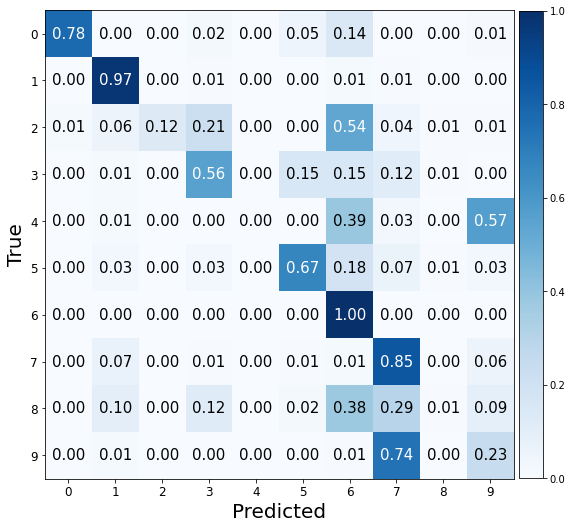

###################

ne: 130, hd:120, wd:0.2, lr: 0.02, bs:600 
Valid Evaluation loss: 1.7522351741790771. f1:0.28966512462143557 acc: 0.3774999976158142 


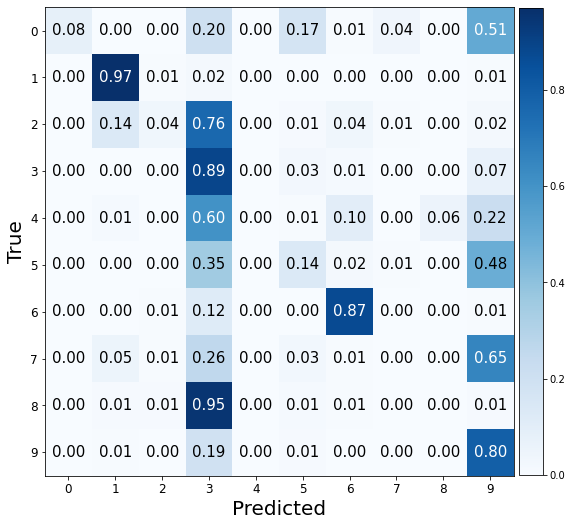

###################

ne: 130, hd:70, wd:0.002, lr: 0.2, bs:600 
Valid Evaluation loss: 2.302950620651245. f1:0.01818181818181818 acc: 0.10000000149011612 


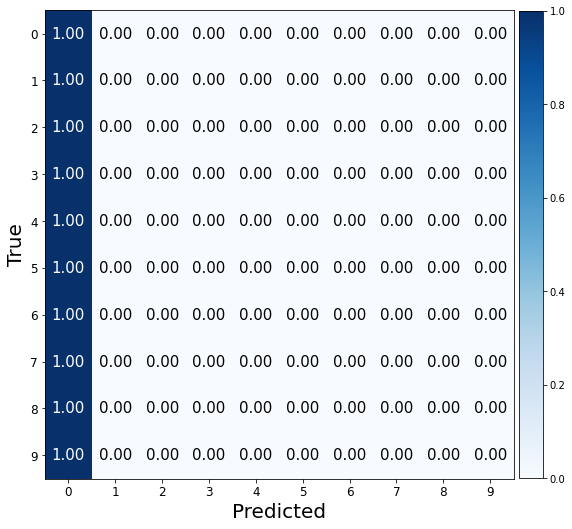

###################

ne: 130, hd:100, wd:0.002, lr: 0.2, bs:600 
Valid Evaluation loss: 2.303119659423828. f1:0.01818181818181818 acc: 0.10000000149011612 


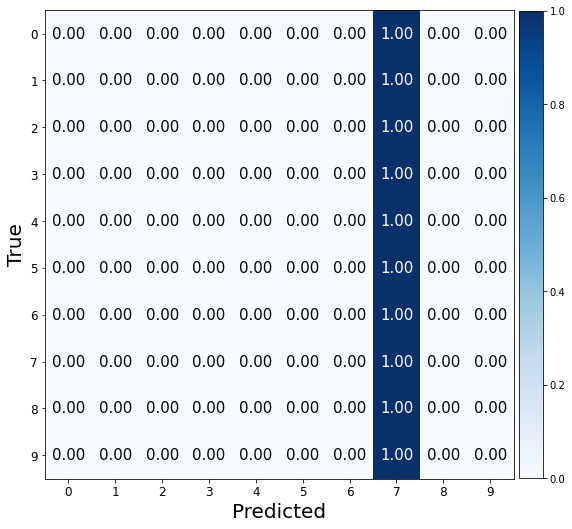

###################

ne: 130, hd:120, wd:0.002, lr: 0.2, bs:600 
Valid Evaluation loss: 2.302722215652466. f1:0.01818181818181818 acc: 0.10000000149011612 


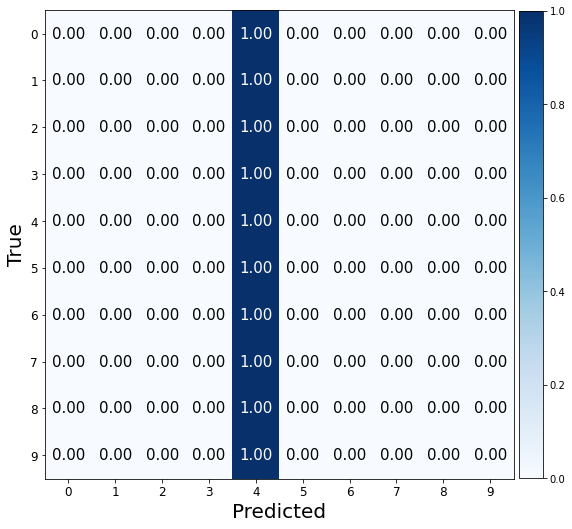

###################

ne: 130, hd:70, wd:0.02, lr: 0.2, bs:600 
Valid Evaluation loss: 2.397890567779541. f1:0.018206645425580335 acc: 0.10000000149011612 


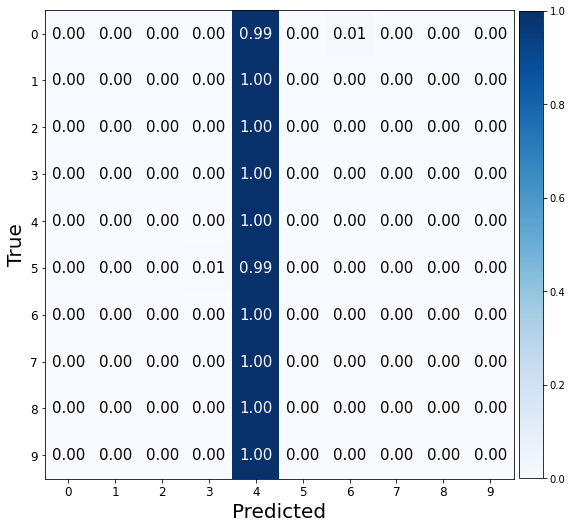

###################

ne: 130, hd:100, wd:0.02, lr: 0.2, bs:600 
Valid Evaluation loss: 2.411146640777588. f1:0.02747323070721322 acc: 0.1054999977350235 


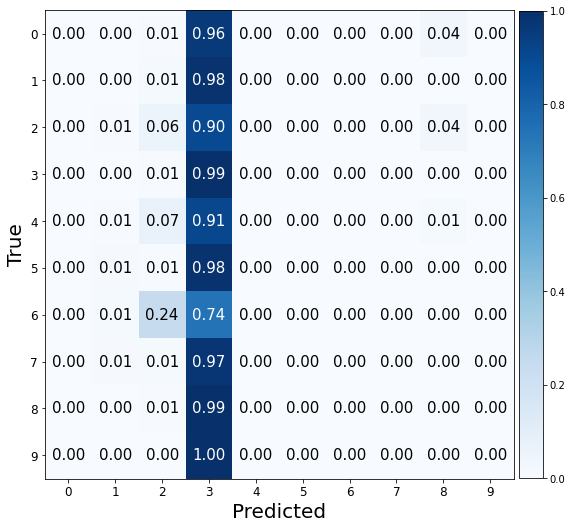

###################

ne: 130, hd:120, wd:0.02, lr: 0.2, bs:600 
Valid Evaluation loss: 2.841247081756592. f1:0.019147033316470333 acc: 0.10000000149011612 


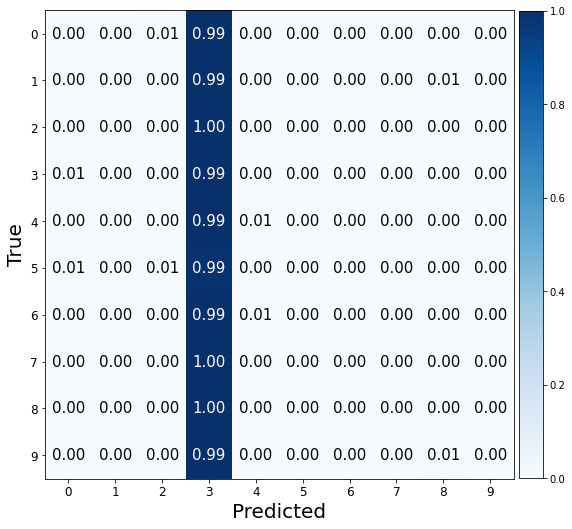

###################

ne: 130, hd:70, wd:0.2, lr: 0.2, bs:600 
Valid Evaluation loss: 2.304922342300415. f1:0.01818181818181818 acc: 0.10000000149011612 


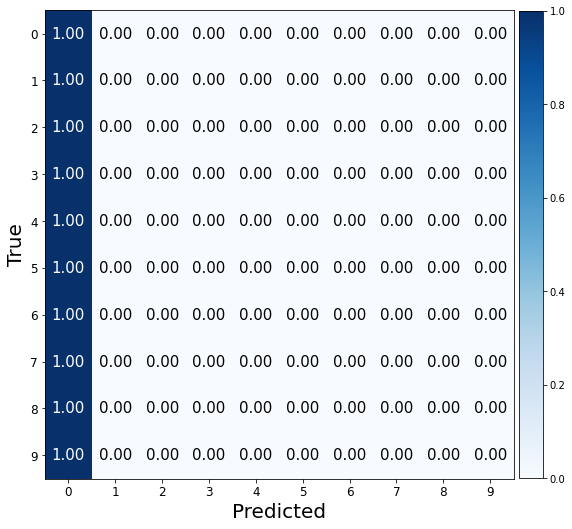

###################

ne: 130, hd:100, wd:0.2, lr: 0.2, bs:600 
Valid Evaluation loss: 3.195571184158325. f1:0.02026199395328202 acc: 0.09950000047683716 


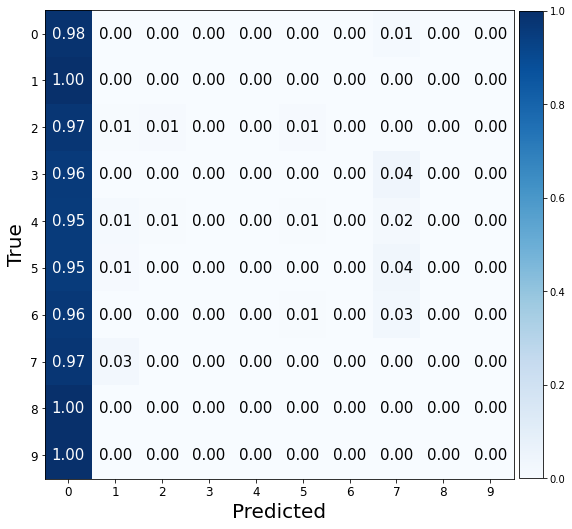

###################

ne: 130, hd:120, wd:0.2, lr: 0.2, bs:600 
Valid Evaluation loss: 2.3415157794952393. f1:0.018206645425580335 acc: 0.10000000149011612 


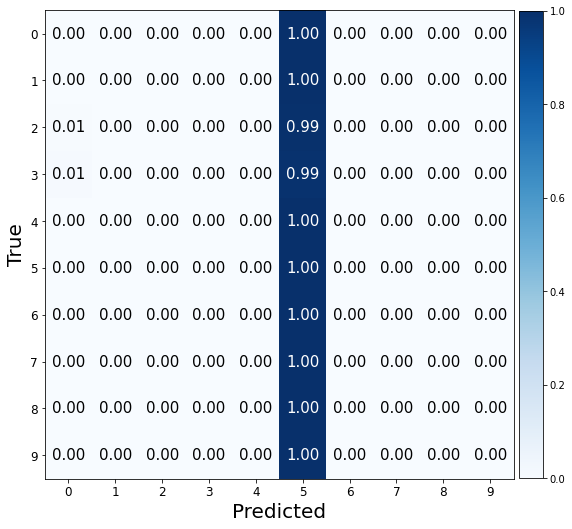

###################

ne: 130, hd:70, wd:0.002, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.3220350444316864. f1:0.9193570222154875 acc: 0.9194999933242798 


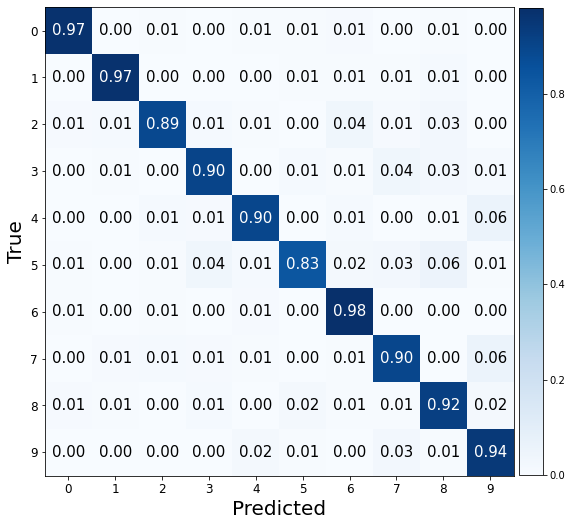

###################

ne: 130, hd:100, wd:0.002, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.3364953100681305. f1:0.9123748073623066 acc: 0.9125000238418579 


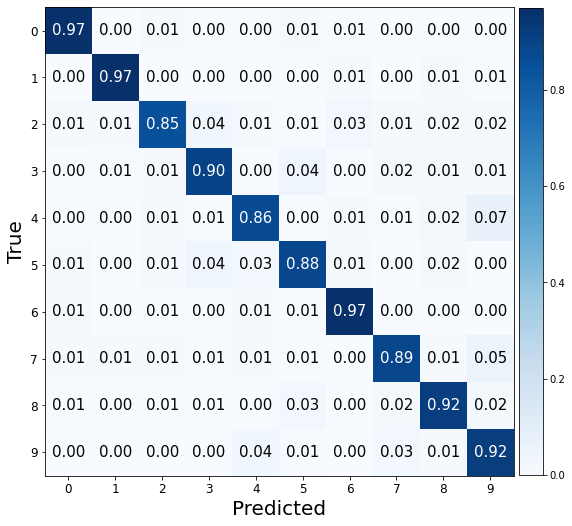

###################

ne: 130, hd:120, wd:0.002, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.33586668968200684. f1:0.9080591138007925 acc: 0.9079999923706055 


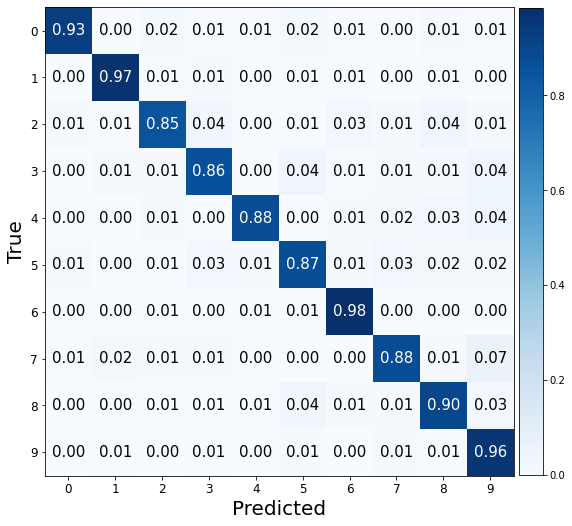

###################

ne: 130, hd:70, wd:0.02, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.28452202677726746. f1:0.9161993741219037 acc: 0.9164999723434448 


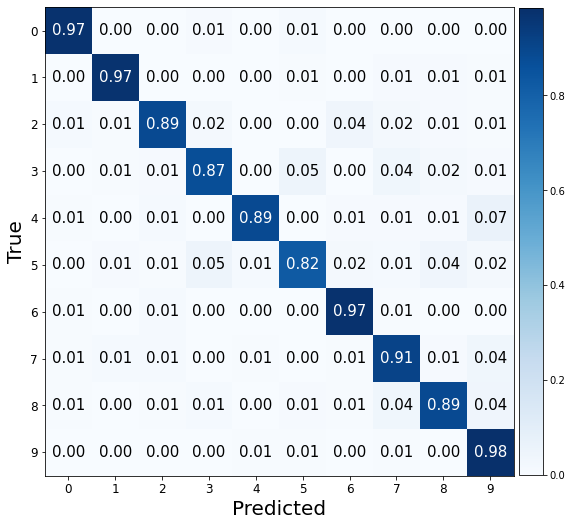

###################

ne: 130, hd:100, wd:0.02, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.2635437548160553. f1:0.927896113678011 acc: 0.9279999732971191 


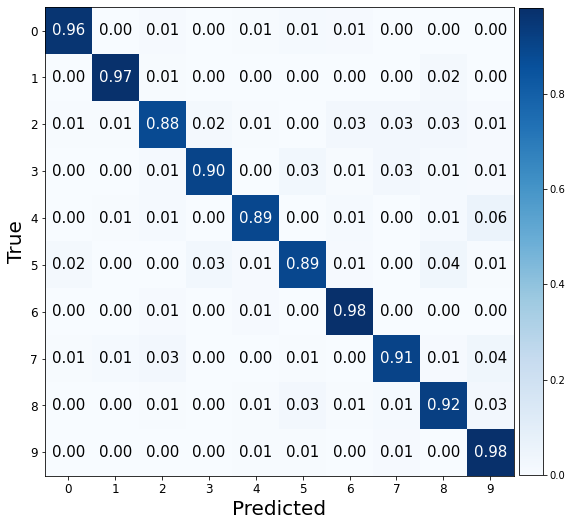

###################

ne: 130, hd:120, wd:0.02, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.2801310420036316. f1:0.9182851117940709 acc: 0.9185000061988831 


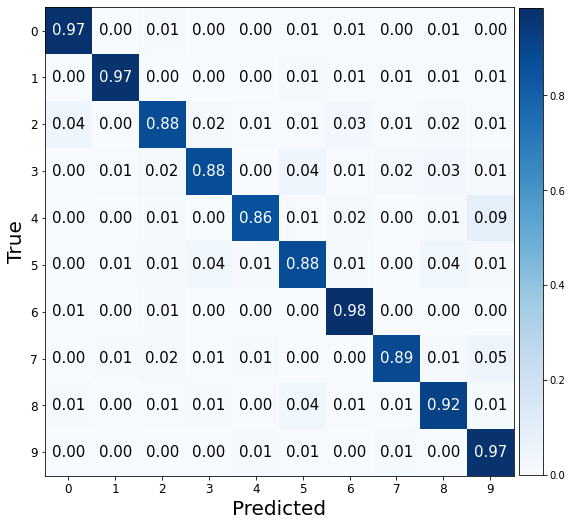

###################

ne: 130, hd:70, wd:0.2, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.2284815013408661. f1:0.9309210622705335 acc: 0.9309999942779541 


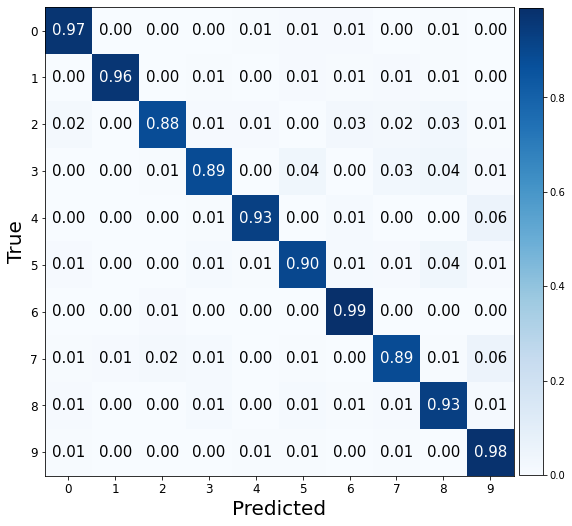

###################

ne: 130, hd:100, wd:0.2, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.24649585783481598. f1:0.9225436394629197 acc: 0.9225000143051147 


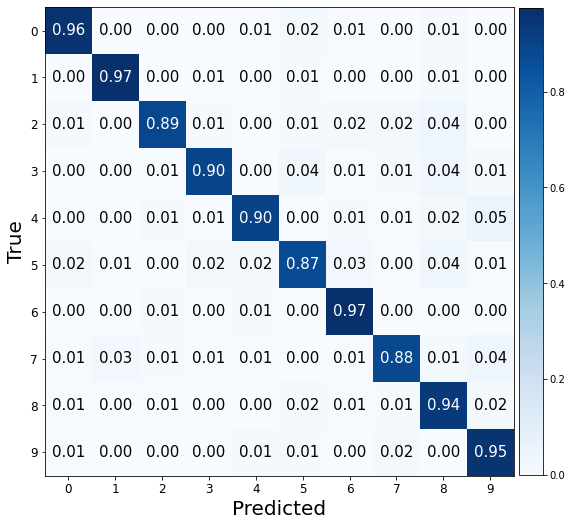

###################

ne: 130, hd:120, wd:0.2, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.2420433759689331. f1:0.924813254145926 acc: 0.925000011920929 


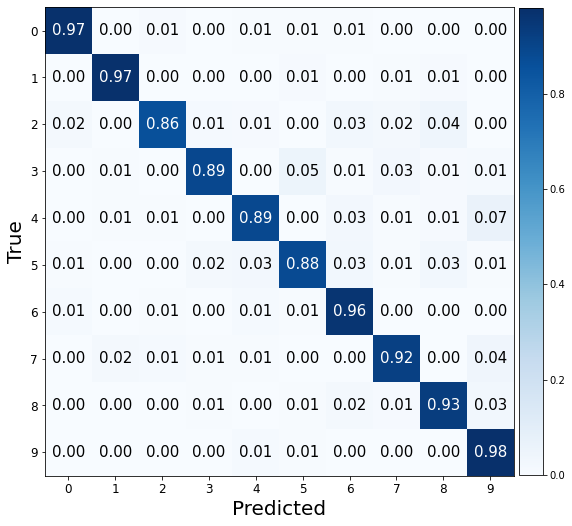

###################

ne: 130, hd:70, wd:0.002, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.1123219728469849. f1:0.6410770249380493 acc: 0.6589999794960022 


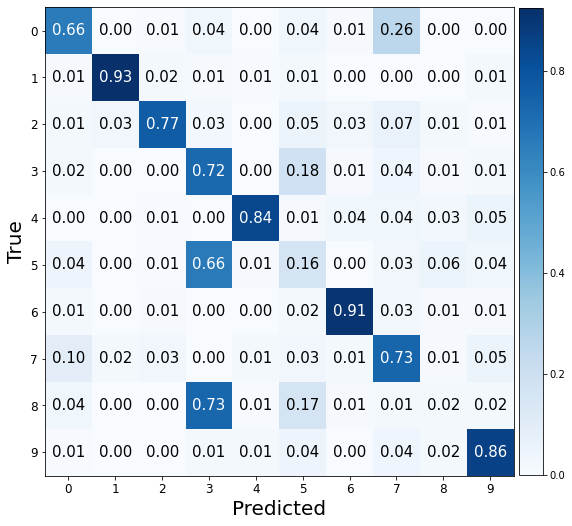

###################

ne: 130, hd:100, wd:0.002, lr: 0.02, bs:1100 
Valid Evaluation loss: 2.061603546142578. f1:0.18927321641989367 acc: 0.2515000104904175 


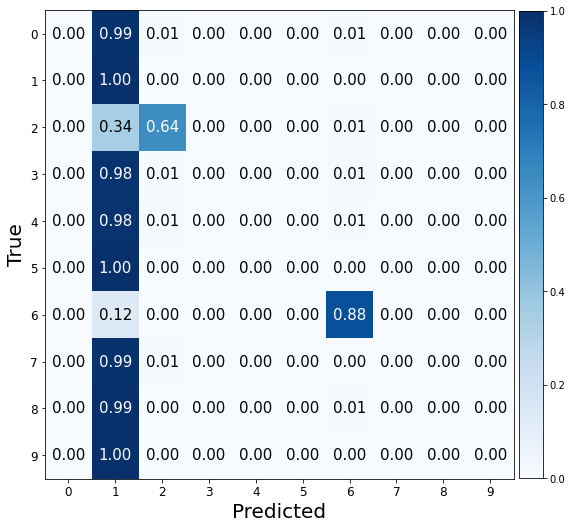

###################

ne: 130, hd:120, wd:0.002, lr: 0.02, bs:1100 
Valid Evaluation loss: 2.0508906841278076. f1:0.1154209687336615 acc: 0.19249999523162842 


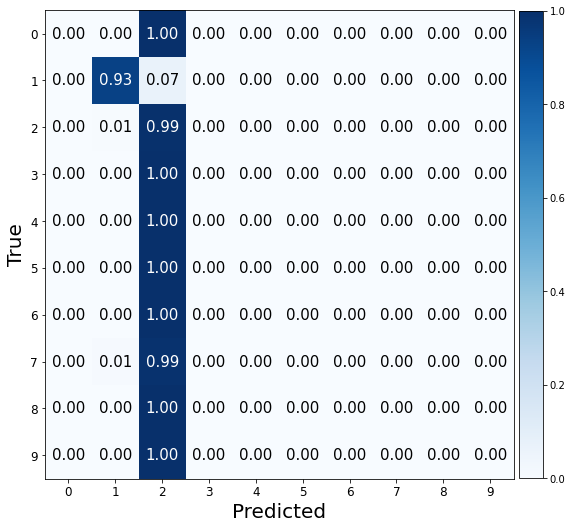

###################

ne: 130, hd:70, wd:0.02, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.0103659629821777. f1:0.6480599531129652 acc: 0.659500002861023 


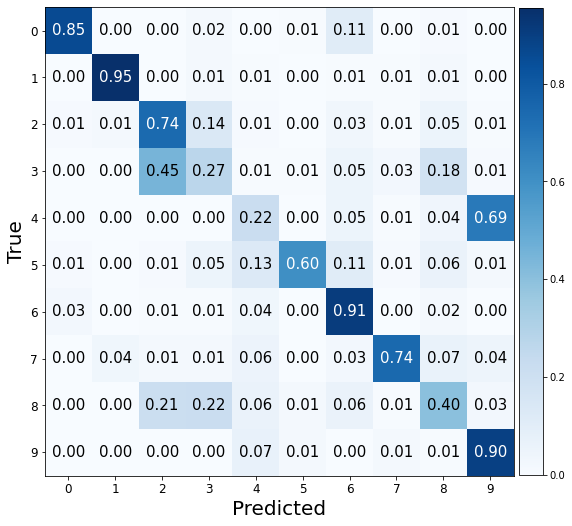

###################

ne: 130, hd:100, wd:0.02, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.9253606796264648. f1:0.19986128072011672 acc: 0.2705000042915344 


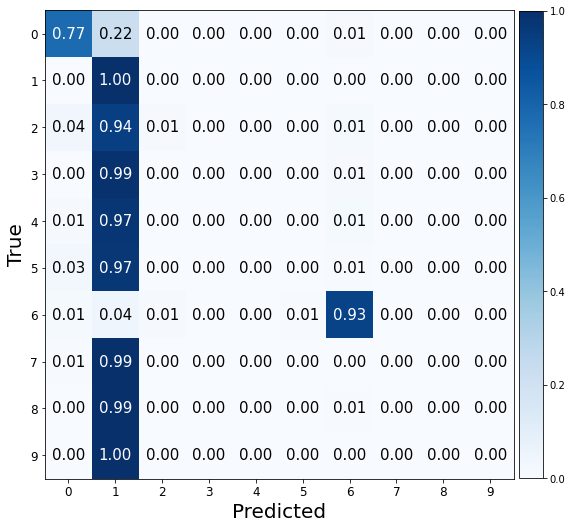

###################

ne: 130, hd:120, wd:0.02, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.9618154764175415. f1:0.2088902491085843 acc: 0.2824999988079071 


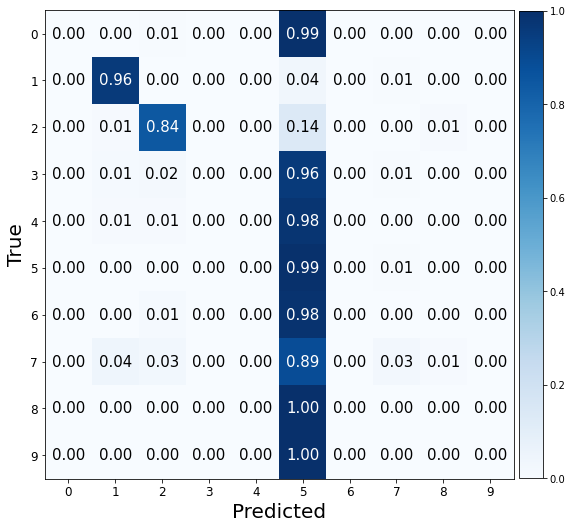

###################

ne: 130, hd:70, wd:0.2, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.6661312580108643. f1:0.4084205703411012 acc: 0.49000000953674316 


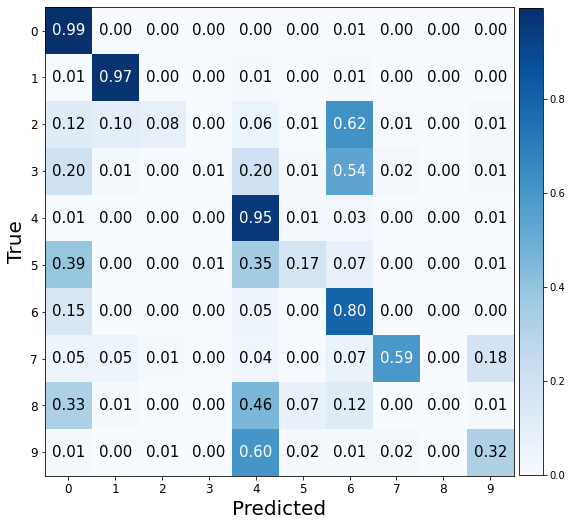

###################

ne: 130, hd:100, wd:0.2, lr: 0.02, bs:1100 
Valid Evaluation loss: 2.2898645401000977. f1:0.4597319923060018 acc: 0.5239999890327454 


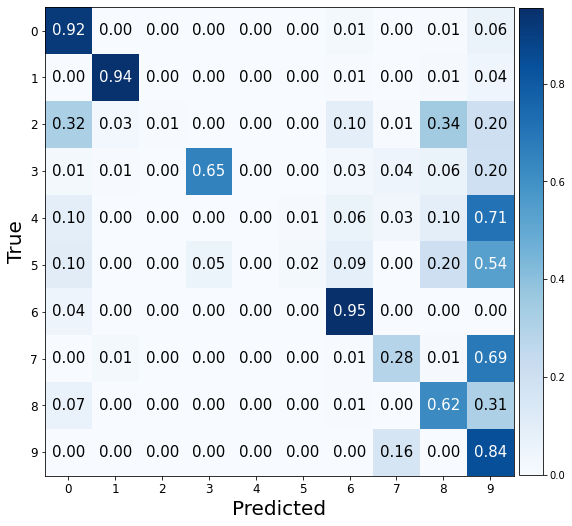

###################

ne: 130, hd:120, wd:0.2, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.6837905645370483. f1:0.47920693555828686 acc: 0.5435000061988831 


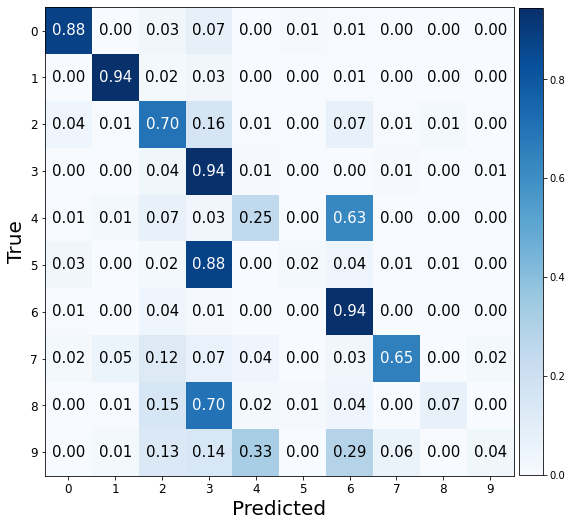

###################

ne: 130, hd:70, wd:0.002, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.3029377460479736. f1:0.01818181818181818 acc: 0.10000000149011612 


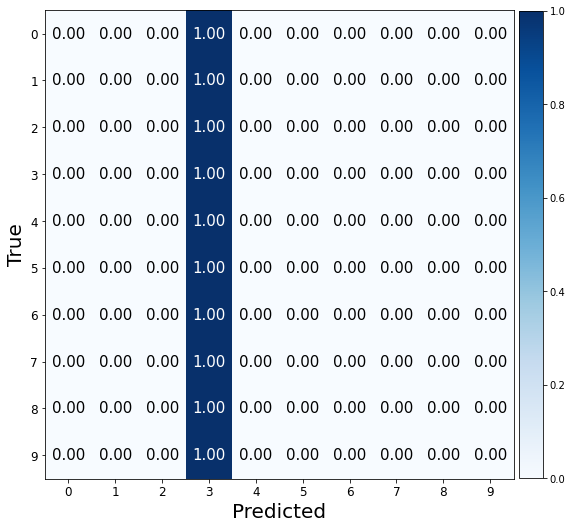

###################

ne: 130, hd:100, wd:0.002, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.393113851547241. f1:0.01818181818181818 acc: 0.10000000149011612 


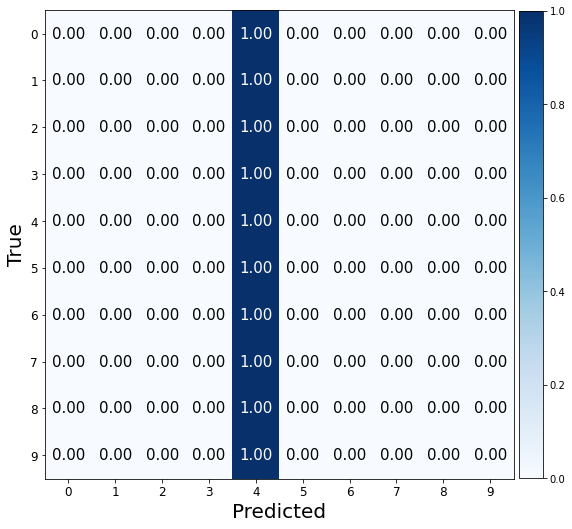

###################

ne: 130, hd:120, wd:0.002, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.3044071197509766. f1:0.01818181818181818 acc: 0.10000000149011612 


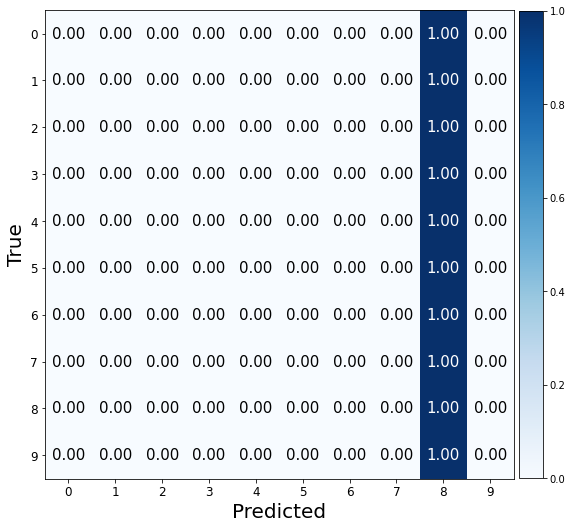

###################

ne: 130, hd:70, wd:0.02, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.340559482574463. f1:0.04419591153348187 acc: 0.1145000010728836 


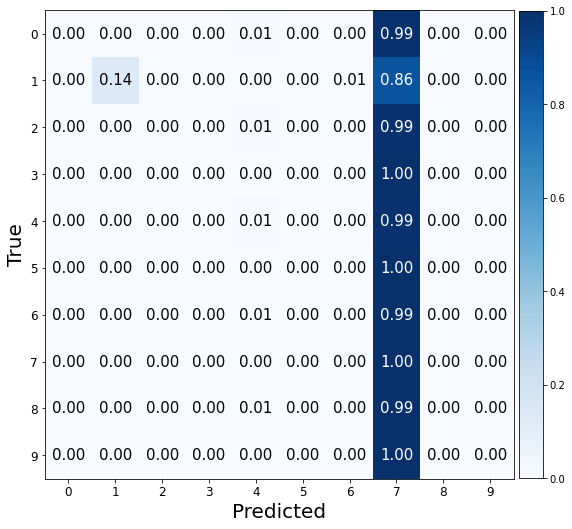

###################

ne: 130, hd:100, wd:0.02, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.517164468765259. f1:0.024209705266294488 acc: 0.10300000011920929 


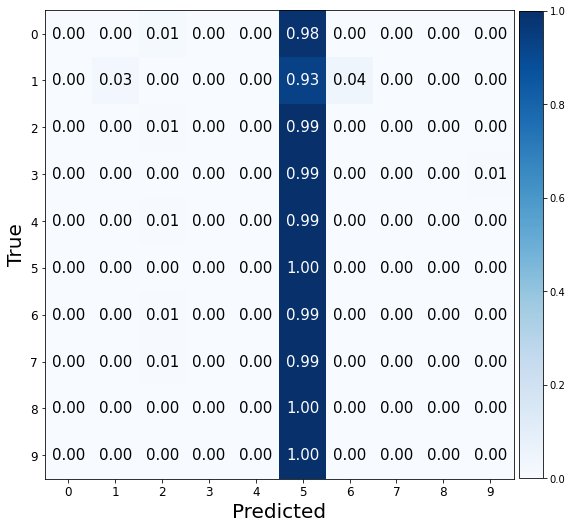

###################

ne: 130, hd:120, wd:0.02, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.3397598266601562. f1:0.02121923720818109 acc: 0.1014999970793724 


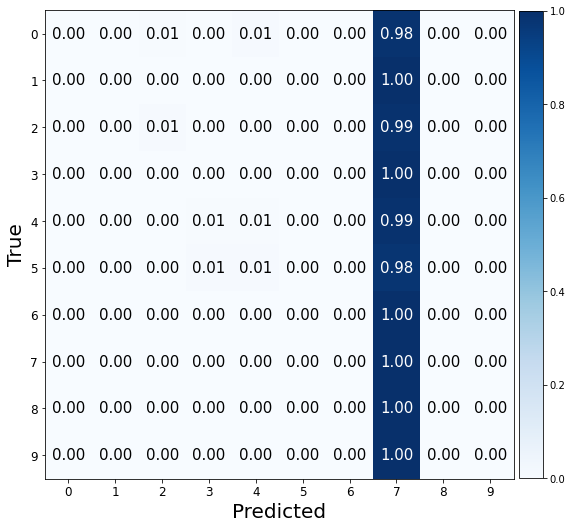

###################

ne: 130, hd:70, wd:0.2, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.3035593032836914. f1:0.01818181818181818 acc: 0.10000000149011612 


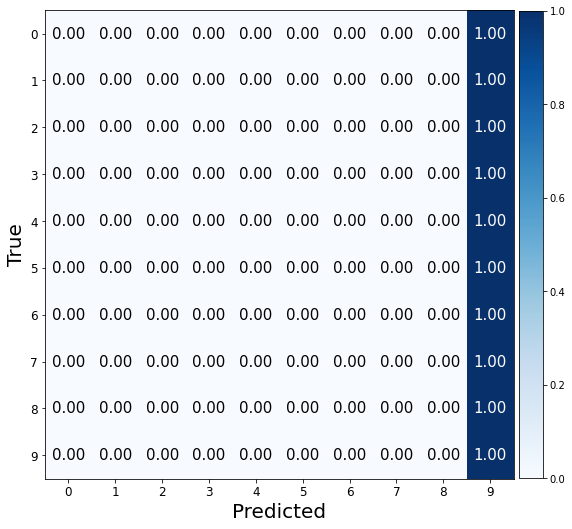

###################

ne: 130, hd:100, wd:0.2, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.8306450843811035. f1:0.06821683572812277 acc: 0.1340000033378601 


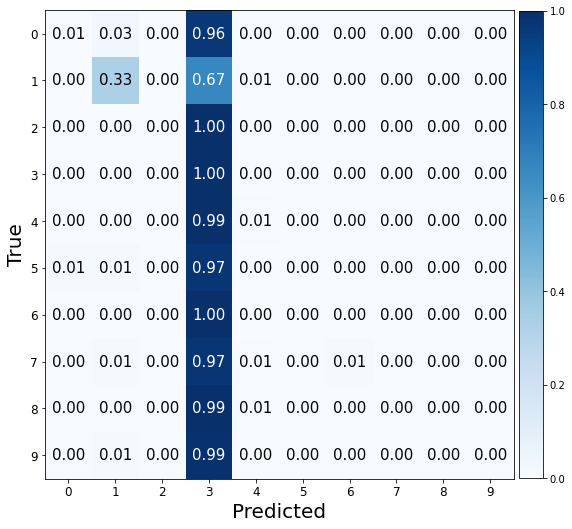

###################

ne: 130, hd:120, wd:0.2, lr: 0.2, bs:1100 
Valid Evaluation loss: 3.8321688175201416. f1:0.022224987555998006 acc: 0.09600000083446503 


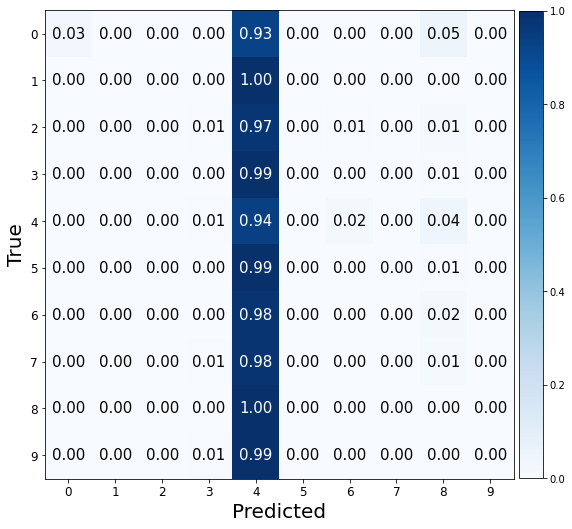

###################

ne: 170, hd:70, wd:0.002, lr: 0.002, bs:300 
Valid Evaluation loss: 0.4053134620189667. f1:0.9074014556019858 acc: 0.9075000286102295 


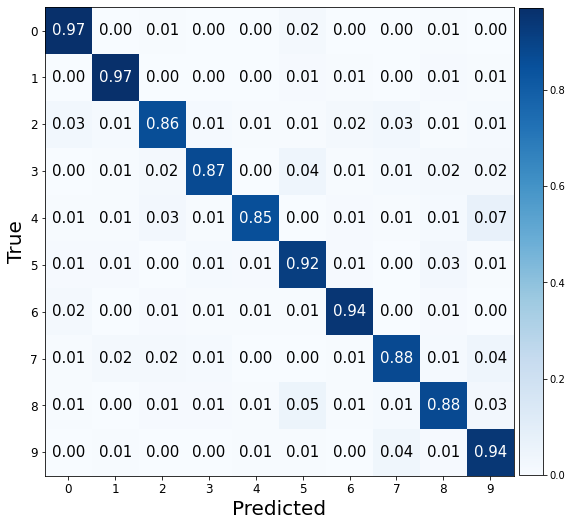

###################

ne: 170, hd:100, wd:0.002, lr: 0.002, bs:300 
Valid Evaluation loss: 0.39490801095962524. f1:0.9133093666710563 acc: 0.9135000109672546 


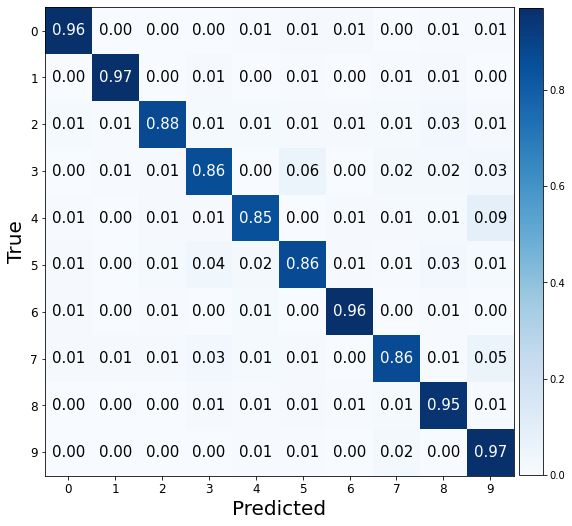

###################

ne: 170, hd:120, wd:0.002, lr: 0.002, bs:300 
Valid Evaluation loss: 0.34663379192352295. f1:0.9219290396877163 acc: 0.921999990940094 


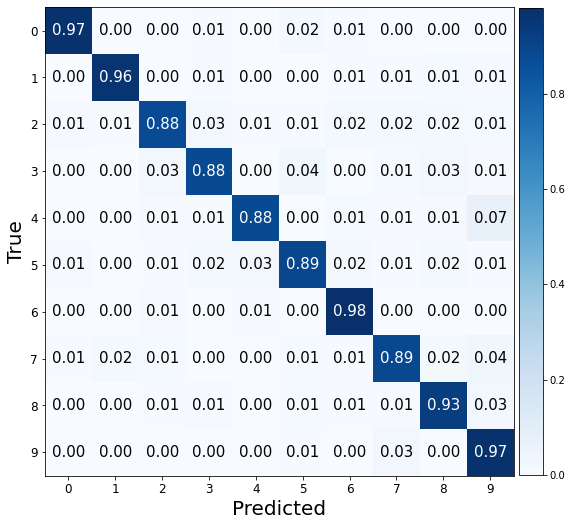

###################

ne: 170, hd:70, wd:0.02, lr: 0.002, bs:300 
Valid Evaluation loss: 0.34060248732566833. f1:0.9155964533042507 acc: 0.9160000085830688 


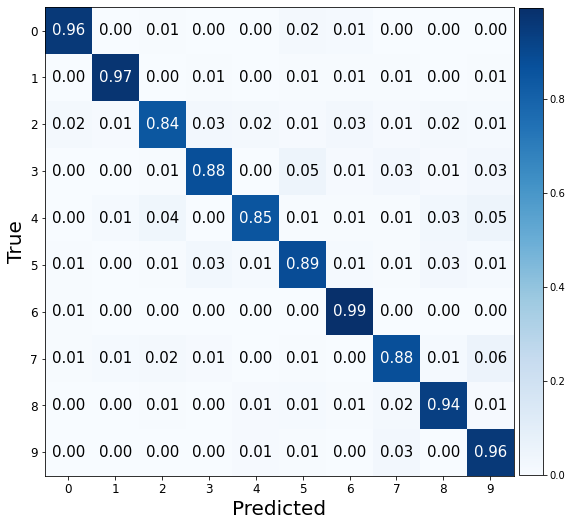

###################

ne: 170, hd:100, wd:0.02, lr: 0.002, bs:300 
Valid Evaluation loss: 0.24784038960933685. f1:0.9333994499670505 acc: 0.9334999918937683 


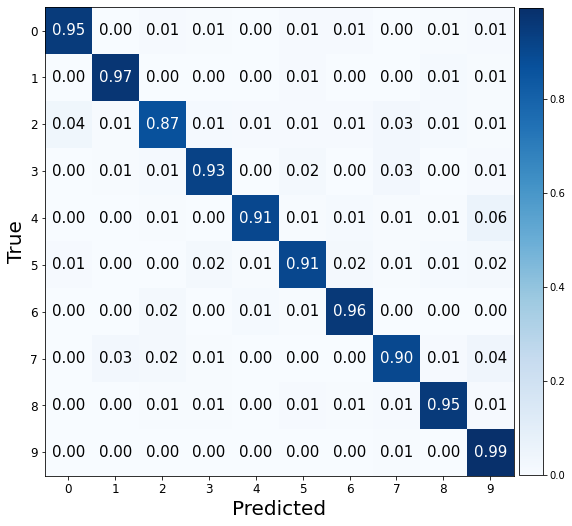

###################

ne: 170, hd:120, wd:0.02, lr: 0.002, bs:300 
Valid Evaluation loss: 0.2962675392627716. f1:0.918343164995471 acc: 0.9185000061988831 


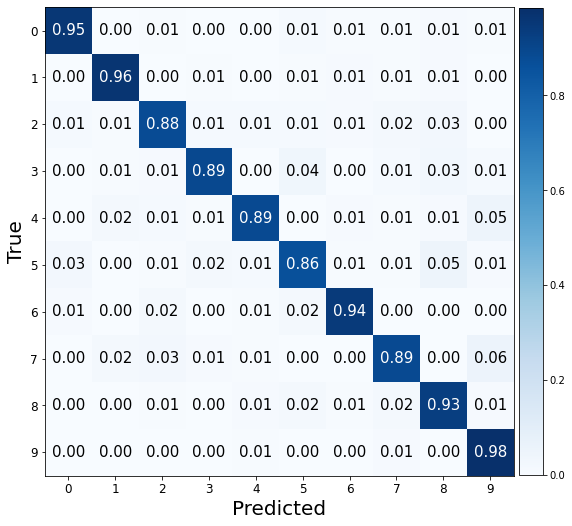

###################

ne: 170, hd:70, wd:0.2, lr: 0.002, bs:300 
Valid Evaluation loss: 0.22824984788894653. f1:0.9297629859911181 acc: 0.9300000071525574 


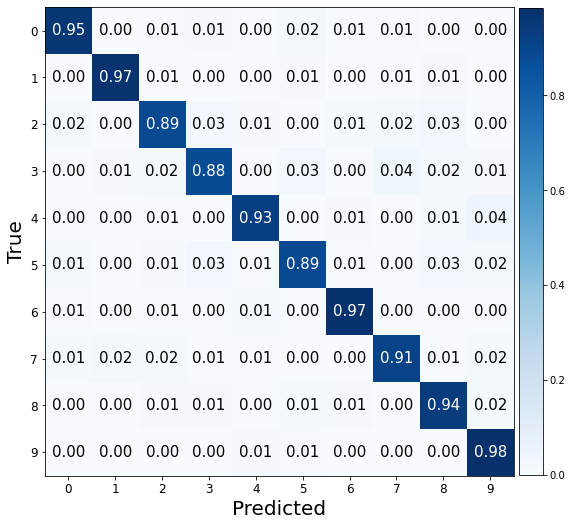

###################

ne: 170, hd:100, wd:0.2, lr: 0.002, bs:300 
Valid Evaluation loss: 0.21235798299312592. f1:0.9279667790414019 acc: 0.9279999732971191 


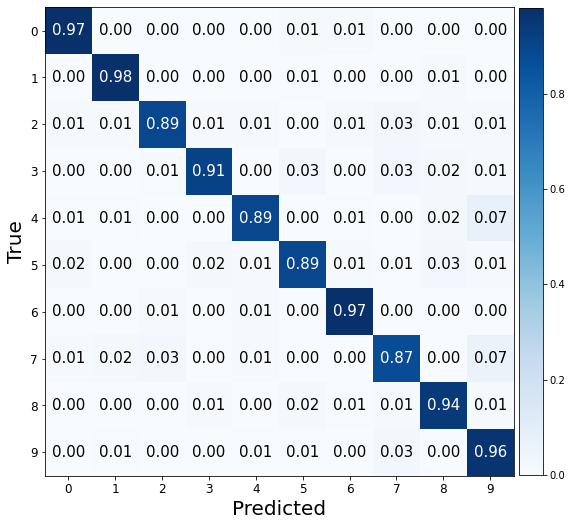

###################

ne: 170, hd:120, wd:0.2, lr: 0.002, bs:300 
Valid Evaluation loss: 0.22209642827510834. f1:0.9282907572933624 acc: 0.9284999966621399 


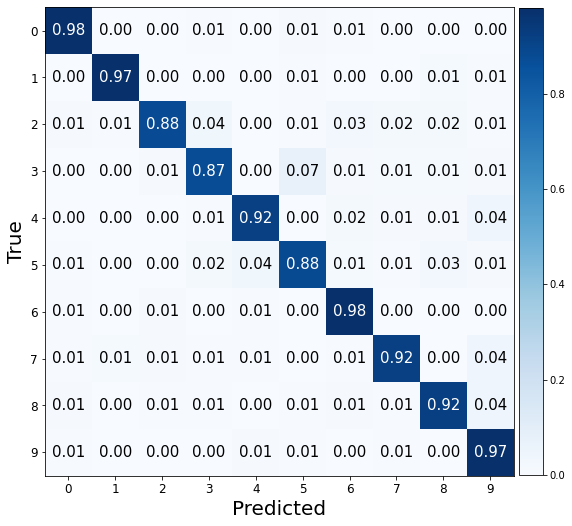

###################

ne: 170, hd:70, wd:0.002, lr: 0.02, bs:300 
Valid Evaluation loss: 1.1913938522338867. f1:0.5381978709227757 acc: 0.5824999809265137 


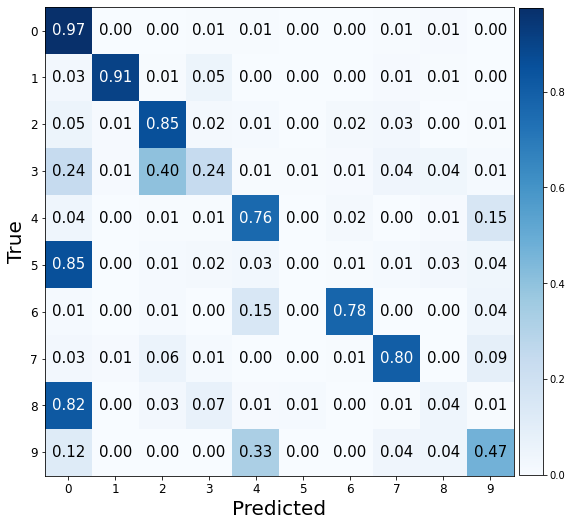

###################

ne: 170, hd:100, wd:0.002, lr: 0.02, bs:300 
Valid Evaluation loss: 2.048347234725952. f1:0.1595442617147463 acc: 0.22200000286102295 


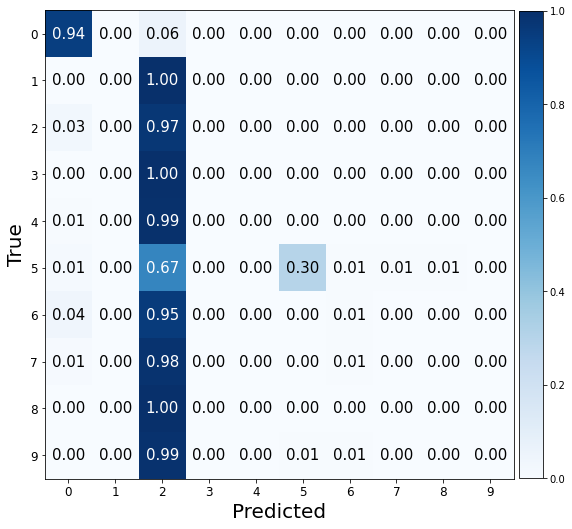

###################

ne: 170, hd:120, wd:0.002, lr: 0.02, bs:300 
Valid Evaluation loss: 2.1732897758483887. f1:0.38505426201888004 acc: 0.4404999911785126 


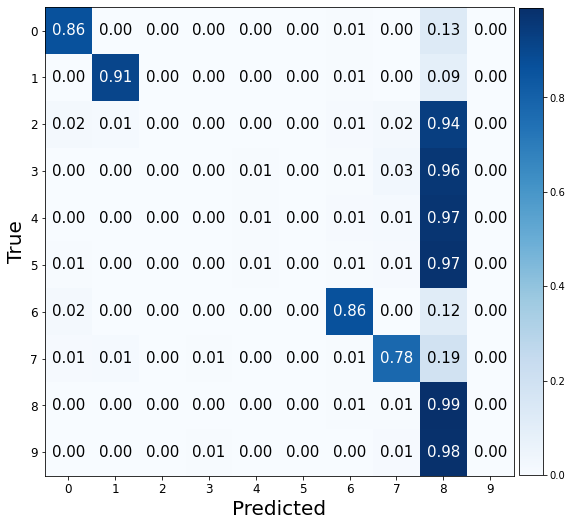

###################

ne: 170, hd:70, wd:0.02, lr: 0.02, bs:300 
Valid Evaluation loss: 0.9345091581344604. f1:0.7243944810609406 acc: 0.7394999861717224 


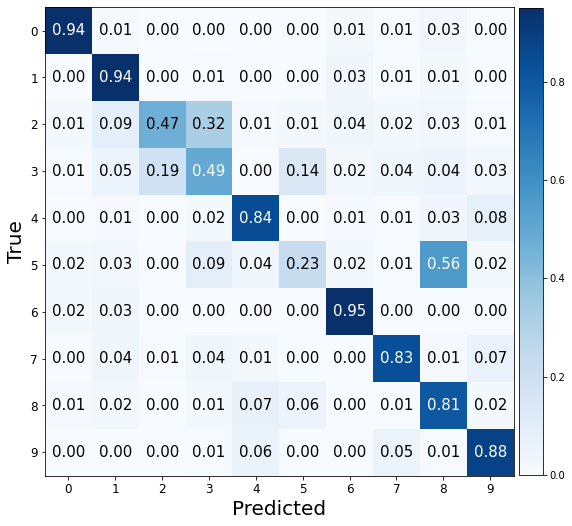

###################

ne: 170, hd:100, wd:0.02, lr: 0.02, bs:300 
Valid Evaluation loss: 1.5219355821609497. f1:0.47432248849152747 acc: 0.5205000042915344 


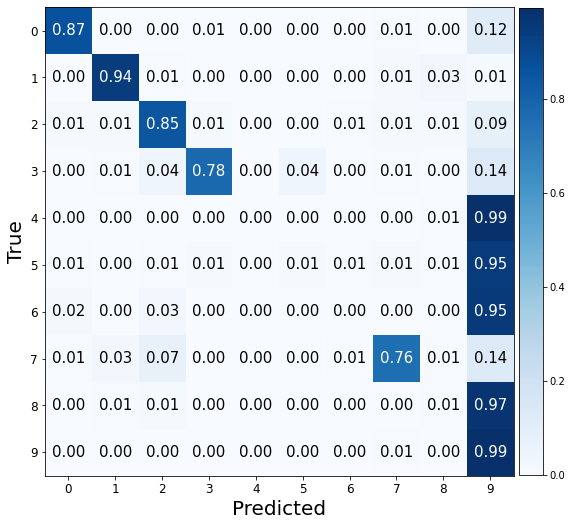

###################

ne: 170, hd:120, wd:0.02, lr: 0.02, bs:300 
Valid Evaluation loss: 2.0769264698028564. f1:0.22060741491239097 acc: 0.304500013589859 


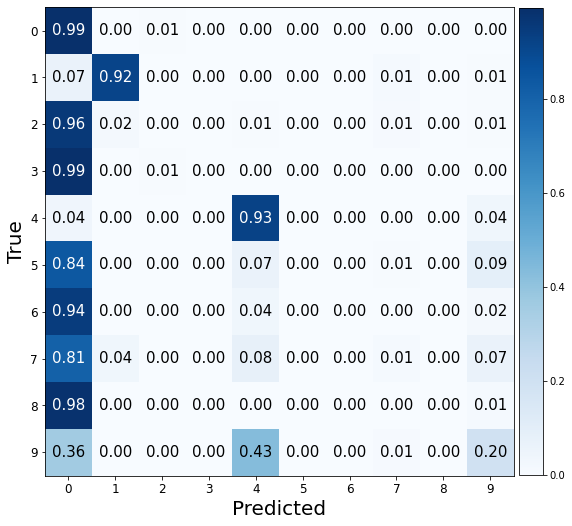

###################

ne: 170, hd:70, wd:0.2, lr: 0.02, bs:300 
Valid Evaluation loss: 0.6068259477615356. f1:0.8128352623243102 acc: 0.8174999952316284 


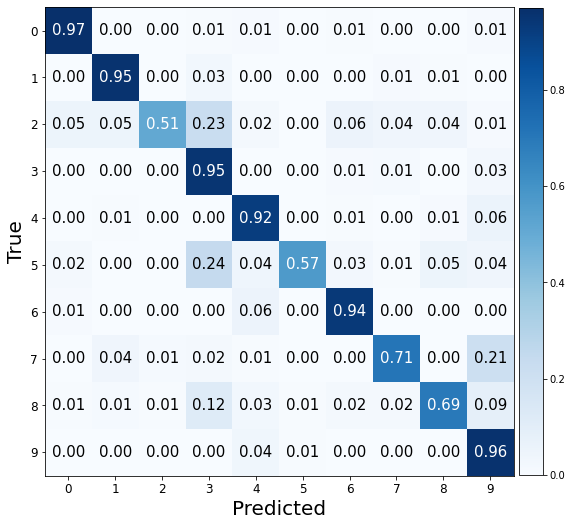

###################

ne: 170, hd:100, wd:0.2, lr: 0.02, bs:300 
Valid Evaluation loss: 1.482795238494873. f1:0.5204529672344518 acc: 0.559499979019165 


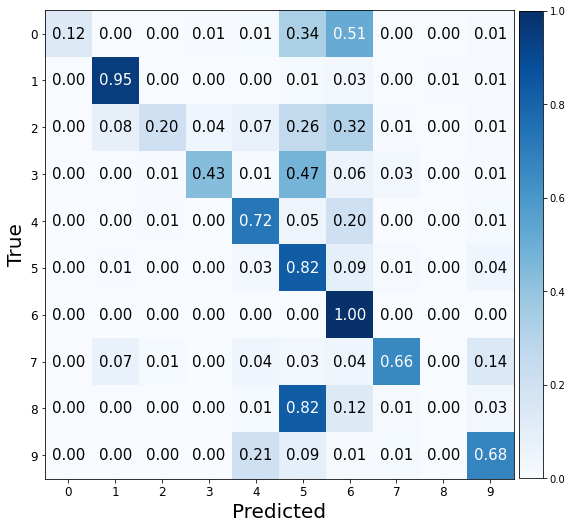

###################

ne: 170, hd:120, wd:0.2, lr: 0.02, bs:300 
Valid Evaluation loss: 0.33877331018447876. f1:0.8910570523469653 acc: 0.8914999961853027 


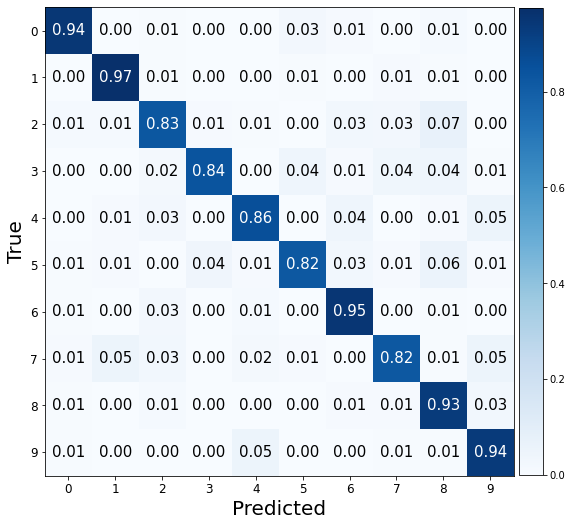

###################

ne: 170, hd:70, wd:0.002, lr: 0.2, bs:300 
Valid Evaluation loss: 2.3027098178863525. f1:0.01818181818181818 acc: 0.10000000149011612 


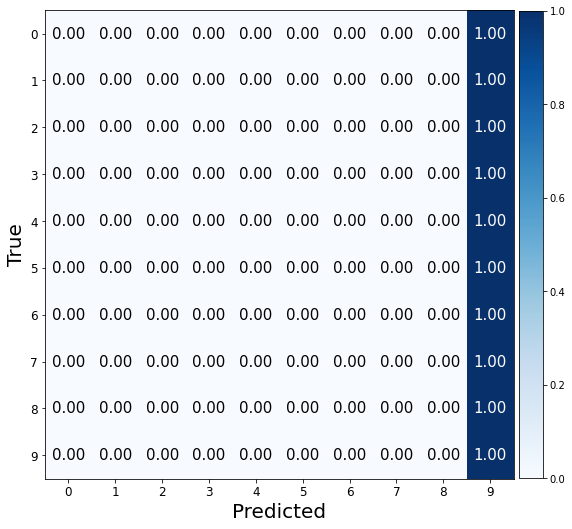

###################

ne: 170, hd:100, wd:0.002, lr: 0.2, bs:300 
Valid Evaluation loss: 2.306060314178467. f1:0.01818181818181818 acc: 0.10000000149011612 


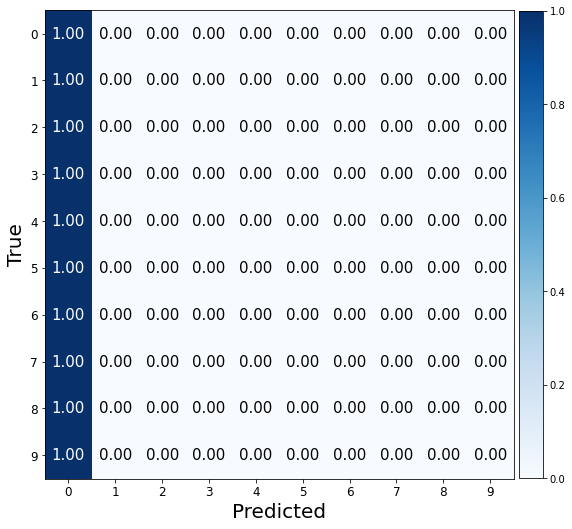

###################

ne: 170, hd:120, wd:0.002, lr: 0.2, bs:300 
Valid Evaluation loss: 2.3248322010040283. f1:0.01818181818181818 acc: 0.10000000149011612 


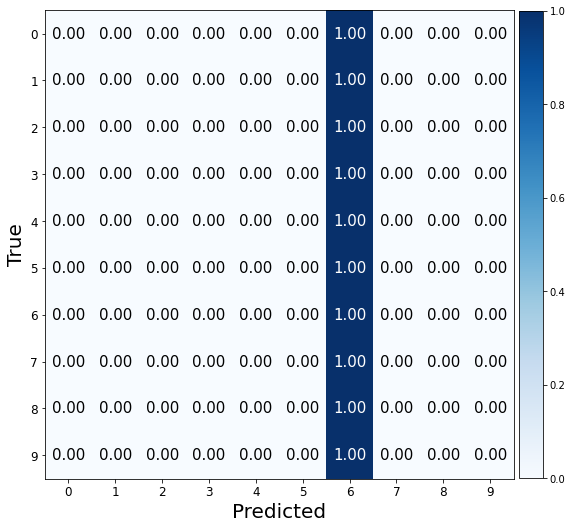

###################

ne: 170, hd:70, wd:0.02, lr: 0.2, bs:300 
Valid Evaluation loss: 2.3961546421051025. f1:0.019221777981691467 acc: 0.10050000250339508 


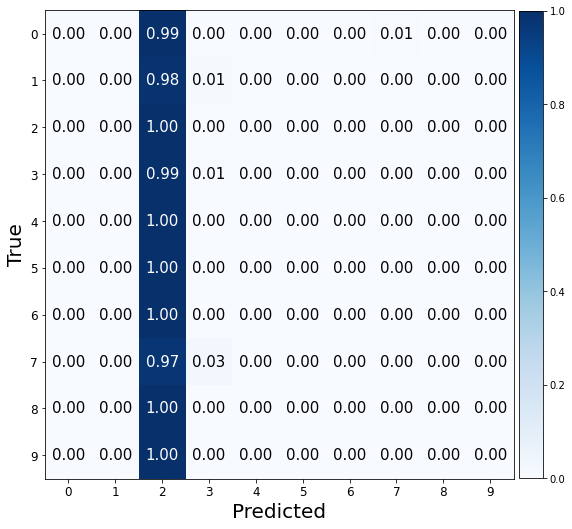

###################

ne: 170, hd:100, wd:0.02, lr: 0.2, bs:300 
Valid Evaluation loss: 2.3335766792297363. f1:0.01828153564899452 acc: 0.10000000149011612 


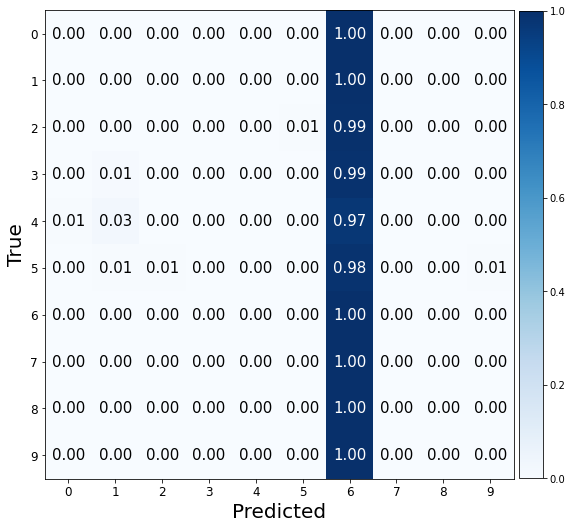

###################

ne: 170, hd:120, wd:0.02, lr: 0.2, bs:300 
Valid Evaluation loss: 2.5739188194274902. f1:0.02846301090699699 acc: 0.10499999672174454 


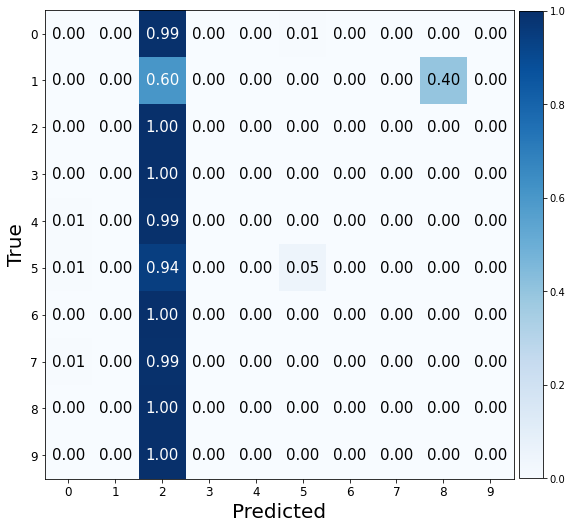

###################

ne: 170, hd:70, wd:0.2, lr: 0.2, bs:300 
Valid Evaluation loss: 2.3025875091552734. f1:0.01818181818181818 acc: 0.10000000149011612 


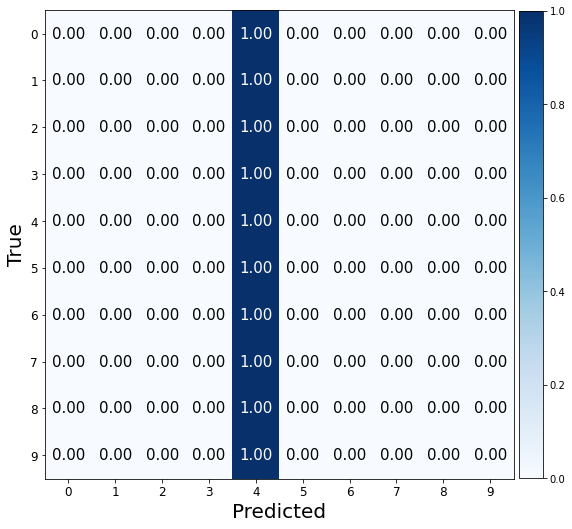

###################

ne: 170, hd:100, wd:0.2, lr: 0.2, bs:300 
Valid Evaluation loss: 10.400837898254395. f1:0.03160194820088249 acc: 0.10700000077486038 


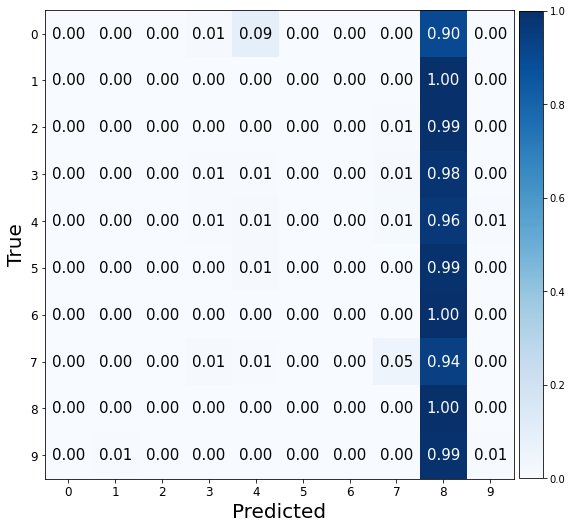

###################

ne: 170, hd:120, wd:0.2, lr: 0.2, bs:300 
Valid Evaluation loss: 2.395442008972168. f1:0.07087179717800786 acc: 0.13199999928474426 


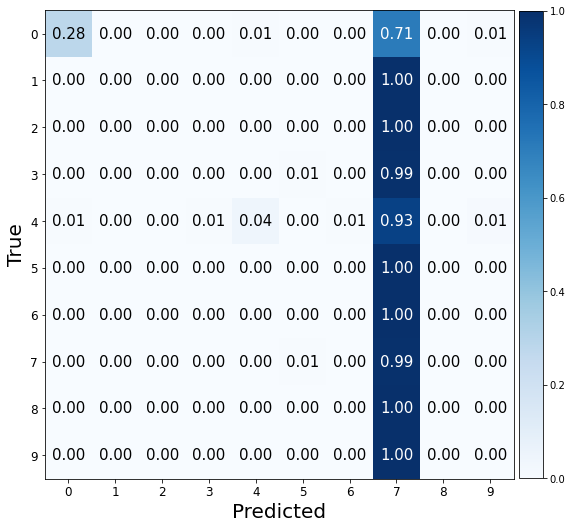

###################

ne: 170, hd:70, wd:0.002, lr: 0.002, bs:600 
Valid Evaluation loss: 0.3363608717918396. f1:0.912452830645264 acc: 0.9125000238418579 


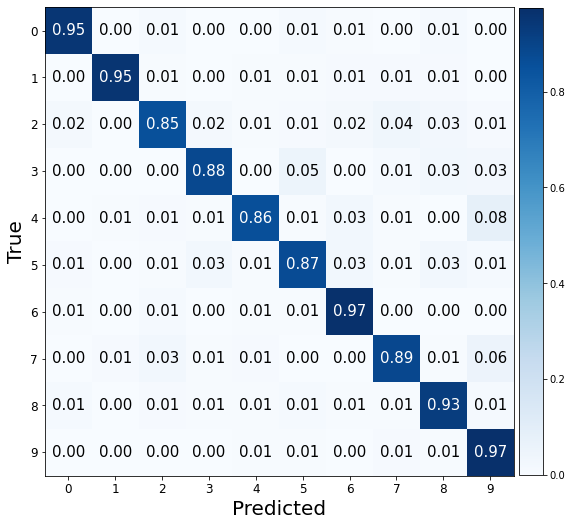

###################

ne: 170, hd:100, wd:0.002, lr: 0.002, bs:600 
Valid Evaluation loss: 0.3545543849468231. f1:0.9239009794483893 acc: 0.9240000247955322 


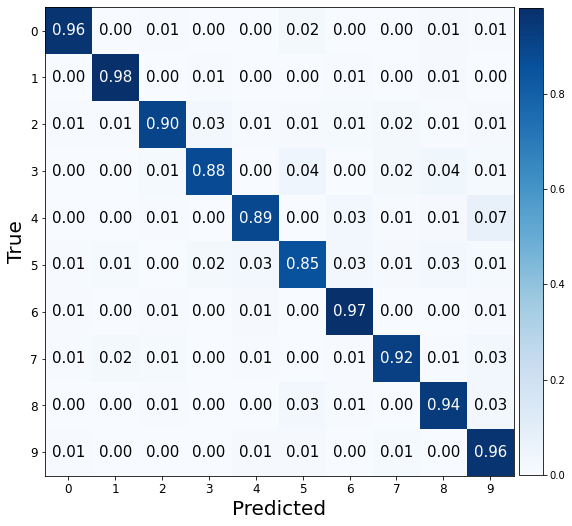

###################

ne: 170, hd:120, wd:0.002, lr: 0.002, bs:600 
Valid Evaluation loss: 0.39815717935562134. f1:0.9156391445167726 acc: 0.9154999852180481 


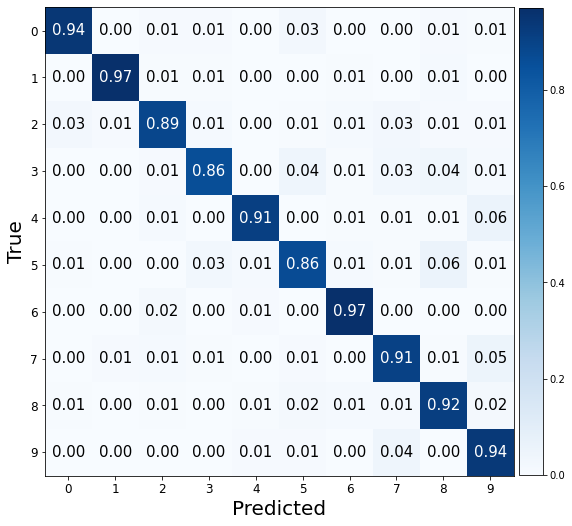

###################

ne: 170, hd:70, wd:0.02, lr: 0.002, bs:600 
Valid Evaluation loss: 0.34928929805755615. f1:0.9105856606503357 acc: 0.9110000133514404 


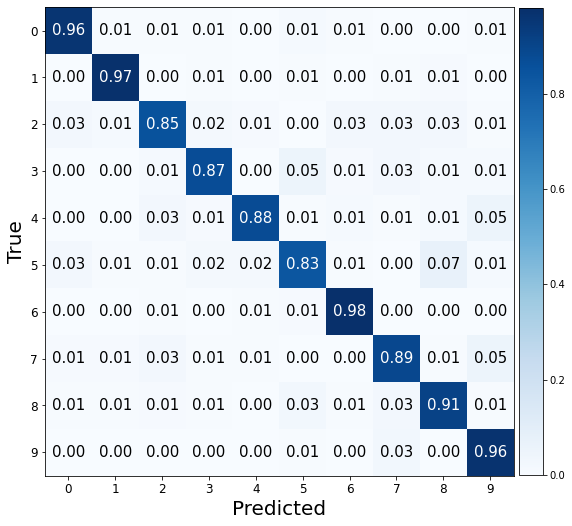

###################

ne: 170, hd:100, wd:0.02, lr: 0.002, bs:600 
Valid Evaluation loss: 0.27536848187446594. f1:0.9210532208051804 acc: 0.9210000038146973 


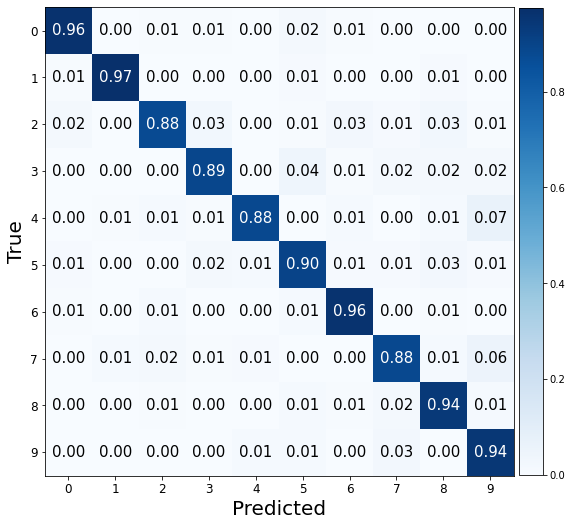

###################

ne: 170, hd:120, wd:0.02, lr: 0.002, bs:600 
Valid Evaluation loss: 0.2902083098888397. f1:0.9217984286643064 acc: 0.921999990940094 


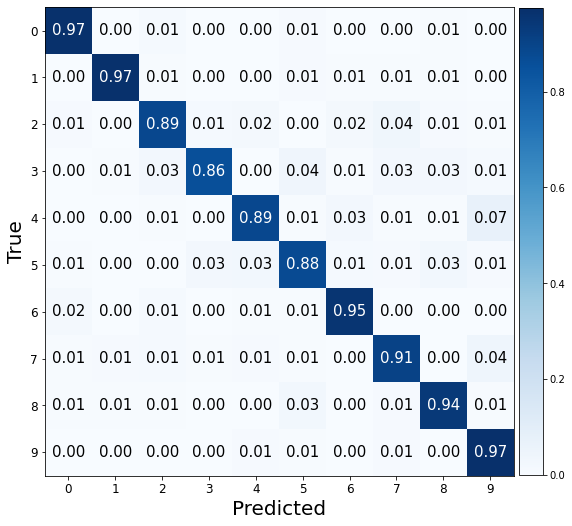

###################

ne: 170, hd:70, wd:0.2, lr: 0.002, bs:600 
Valid Evaluation loss: 0.22498174011707306. f1:0.9317111689602413 acc: 0.9319999814033508 


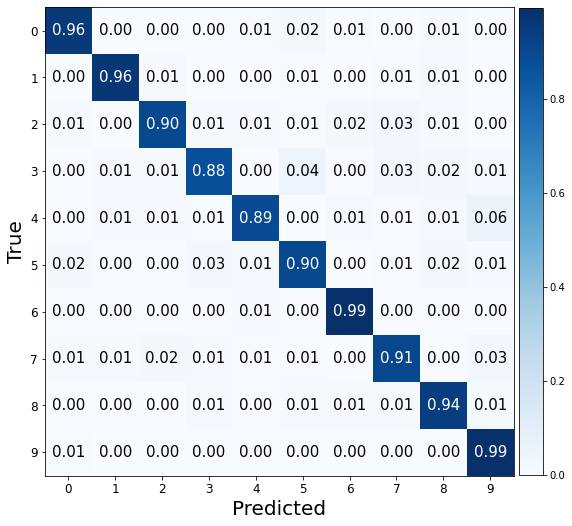

###################

ne: 170, hd:100, wd:0.2, lr: 0.002, bs:600 
Valid Evaluation loss: 0.20458008348941803. f1:0.9393471614044694 acc: 0.9394999742507935 


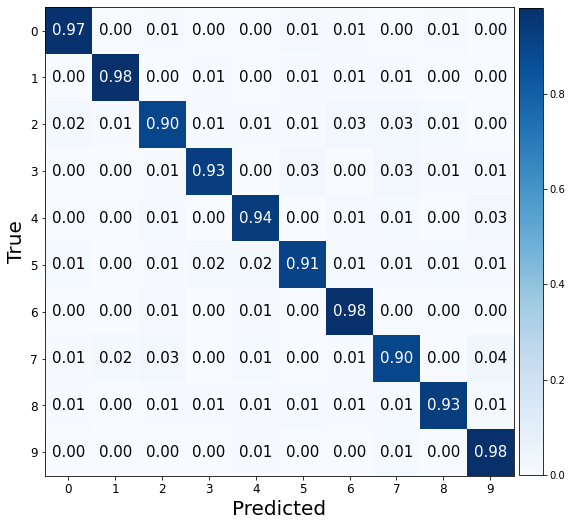

###################

ne: 170, hd:120, wd:0.2, lr: 0.002, bs:600 
Valid Evaluation loss: 0.2257615029811859. f1:0.9302723850897616 acc: 0.9304999709129333 


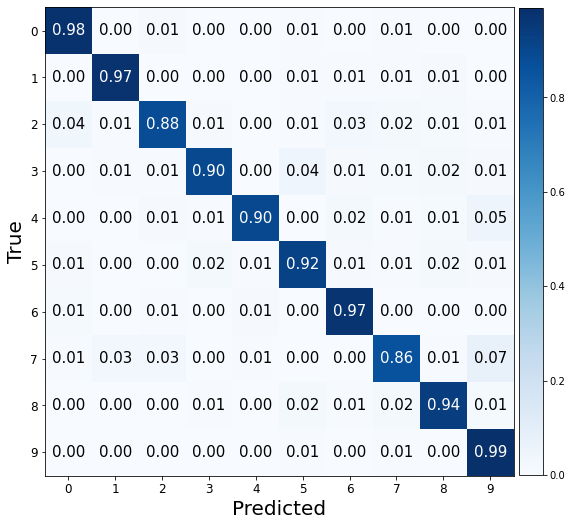

###################

ne: 170, hd:70, wd:0.002, lr: 0.02, bs:600 
Valid Evaluation loss: 2.0469603538513184. f1:0.11591961393941592 acc: 0.19449999928474426 


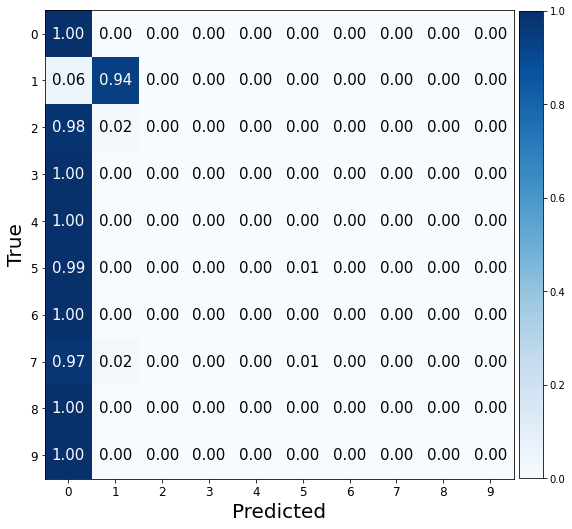

###################

ne: 170, hd:100, wd:0.002, lr: 0.02, bs:600 
Valid Evaluation loss: 0.8554341197013855. f1:0.808730368451589 acc: 0.8065000176429749 


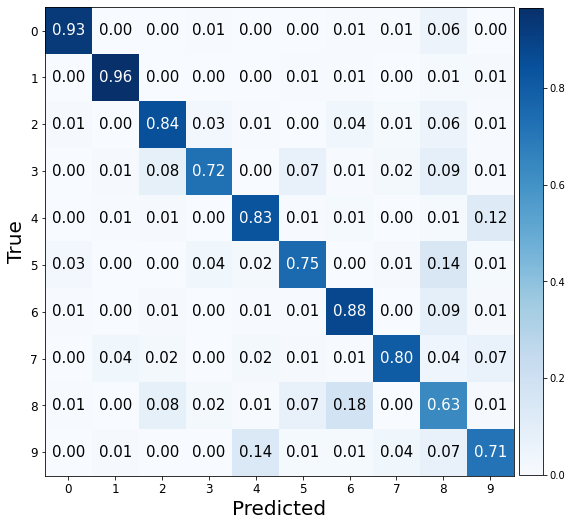

###################

ne: 170, hd:120, wd:0.002, lr: 0.02, bs:600 
Valid Evaluation loss: 2.0451126098632812. f1:0.11413491587486979 acc: 0.19099999964237213 


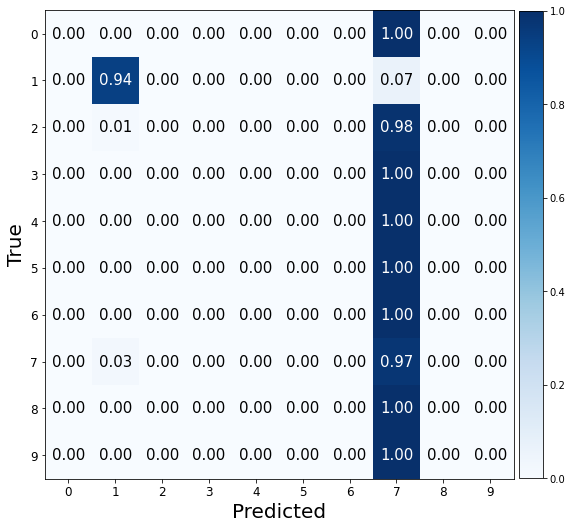

###################

ne: 170, hd:70, wd:0.02, lr: 0.02, bs:600 
Valid Evaluation loss: 0.7460983395576477. f1:0.7421592353686547 acc: 0.7634999752044678 


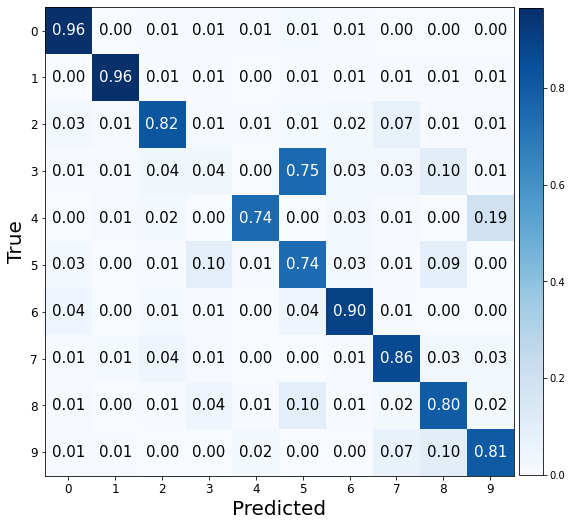

###################

ne: 170, hd:100, wd:0.02, lr: 0.02, bs:600 
Valid Evaluation loss: 0.8014413714408875. f1:0.8019822276619164 acc: 0.809499979019165 


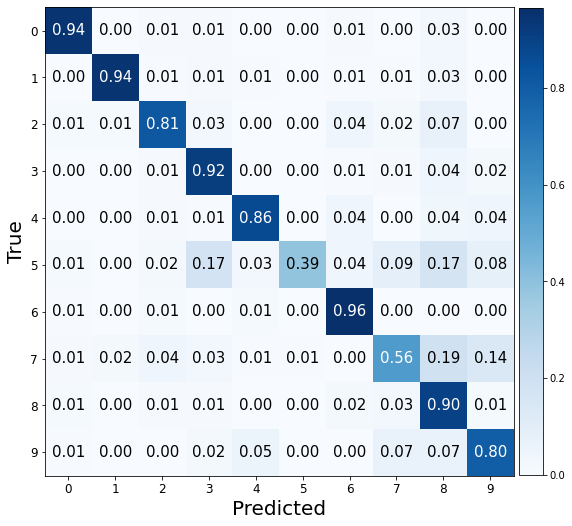

###################

ne: 170, hd:120, wd:0.02, lr: 0.02, bs:600 
Valid Evaluation loss: 1.804219365119934. f1:0.28557782763304146 acc: 0.34299999475479126 


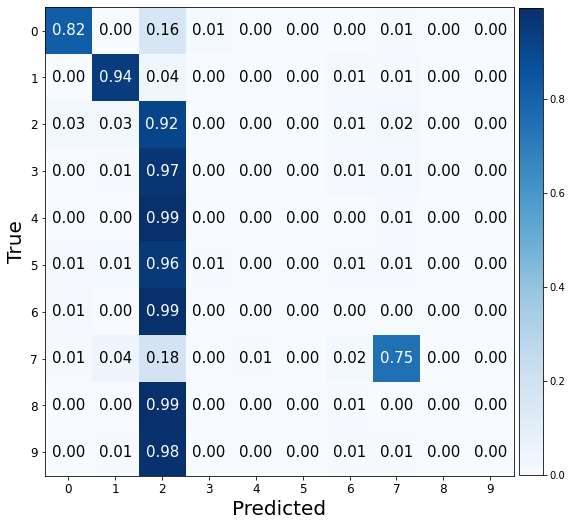

###################

ne: 170, hd:70, wd:0.2, lr: 0.02, bs:600 
Valid Evaluation loss: 0.8995064496994019. f1:0.7385950282719078 acc: 0.7574999928474426 


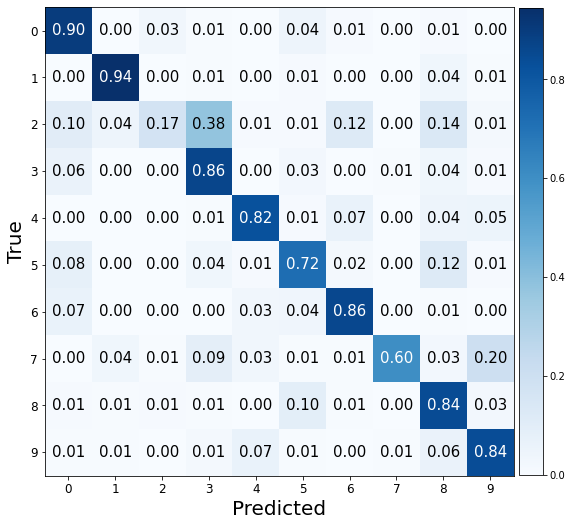

###################

ne: 170, hd:100, wd:0.2, lr: 0.02, bs:600 
Valid Evaluation loss: 0.549203097820282. f1:0.8395566870361441 acc: 0.8410000205039978 


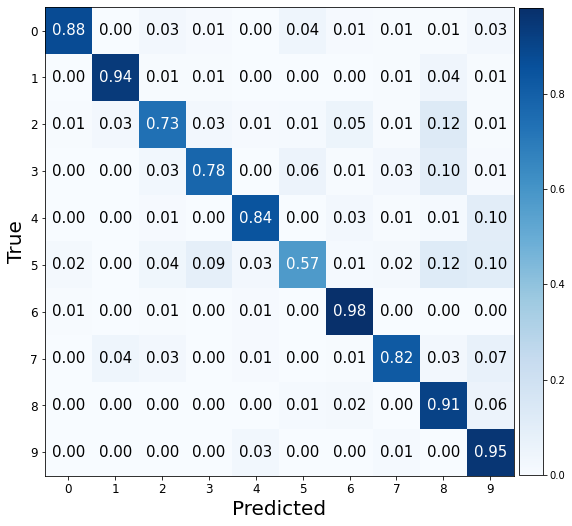

###################

ne: 170, hd:120, wd:0.2, lr: 0.02, bs:600 
Valid Evaluation loss: 2.8008182048797607. f1:0.22268071442134413 acc: 0.2770000100135803 


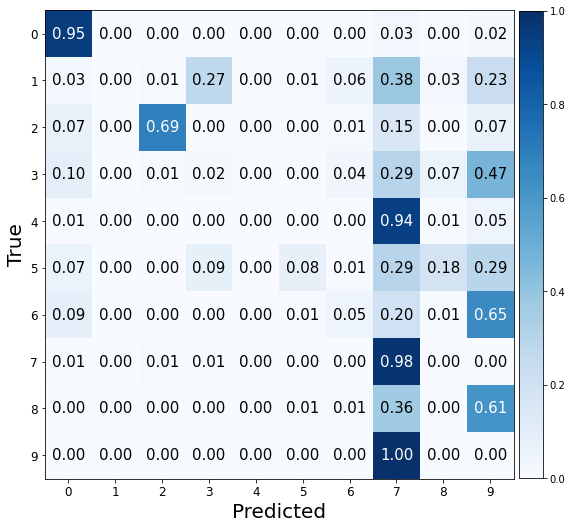

###################

ne: 170, hd:70, wd:0.002, lr: 0.2, bs:600 
Valid Evaluation loss: 2.30273699760437. f1:0.01818181818181818 acc: 0.10000000149011612 


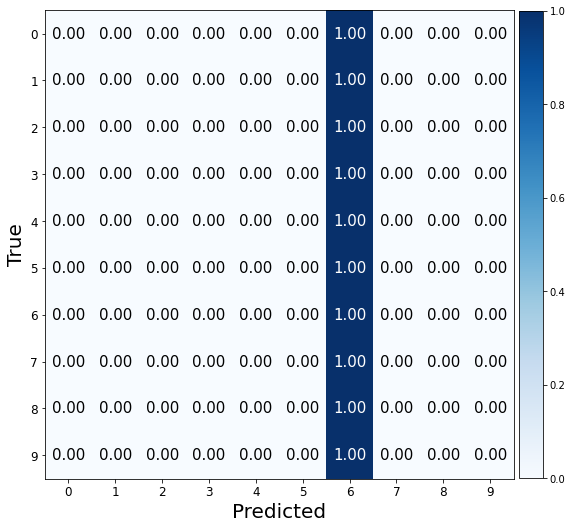

###################

ne: 170, hd:100, wd:0.002, lr: 0.2, bs:600 
Valid Evaluation loss: 2.3172686100006104. f1:0.01818181818181818 acc: 0.10000000149011612 


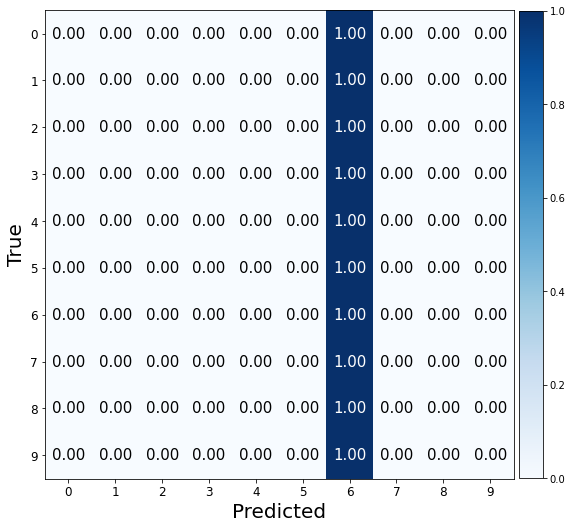

###################

ne: 170, hd:120, wd:0.002, lr: 0.2, bs:600 
Valid Evaluation loss: 2.302600145339966. f1:0.01818181818181818 acc: 0.10000000149011612 


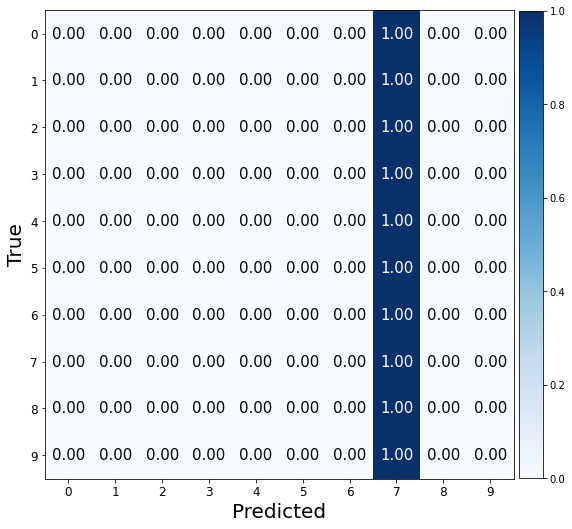

###################

ne: 170, hd:70, wd:0.02, lr: 0.2, bs:600 
Valid Evaluation loss: 2.338869333267212. f1:0.06546025811461997 acc: 0.1289999932050705 


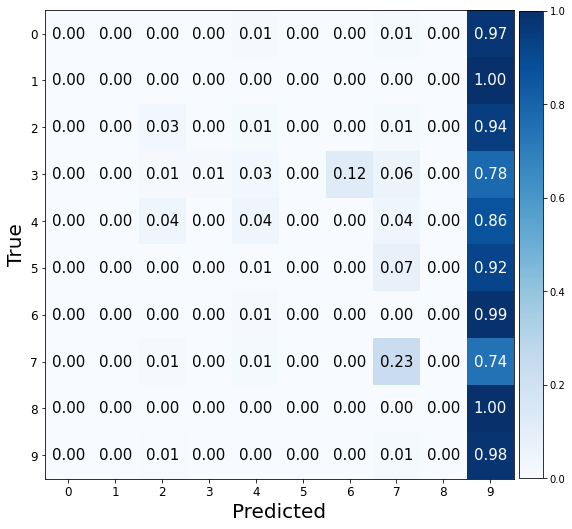

###################

ne: 170, hd:100, wd:0.02, lr: 0.2, bs:600 
Valid Evaluation loss: 2.352072238922119. f1:0.01821493624772313 acc: 0.10000000149011612 


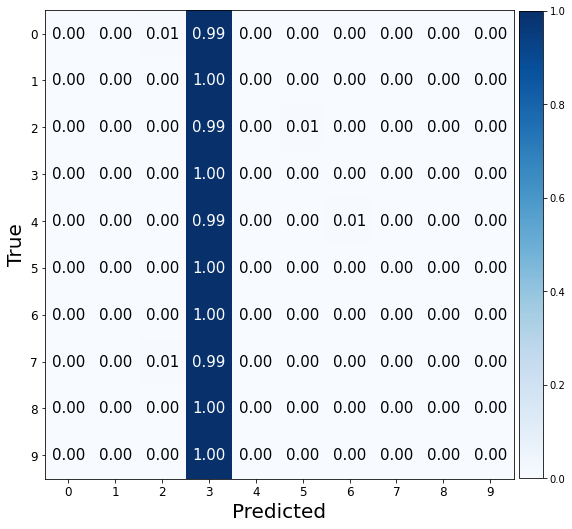

###################

ne: 170, hd:120, wd:0.02, lr: 0.2, bs:600 
Valid Evaluation loss: 2.3025898933410645. f1:0.01818181818181818 acc: 0.10000000149011612 


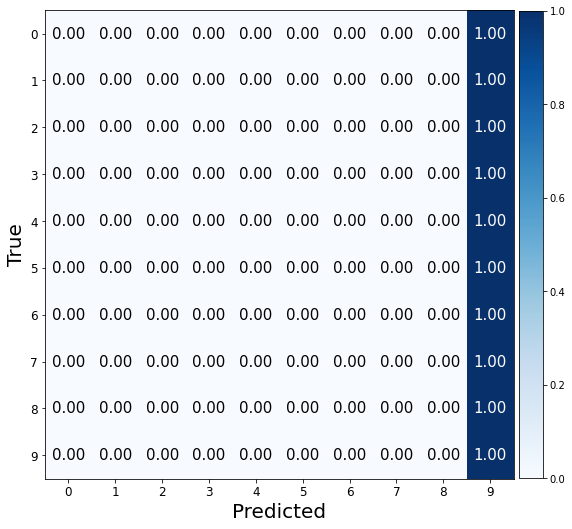

###################

ne: 170, hd:70, wd:0.2, lr: 0.2, bs:600 
Valid Evaluation loss: 2.3051364421844482. f1:0.01818181818181818 acc: 0.10000000149011612 


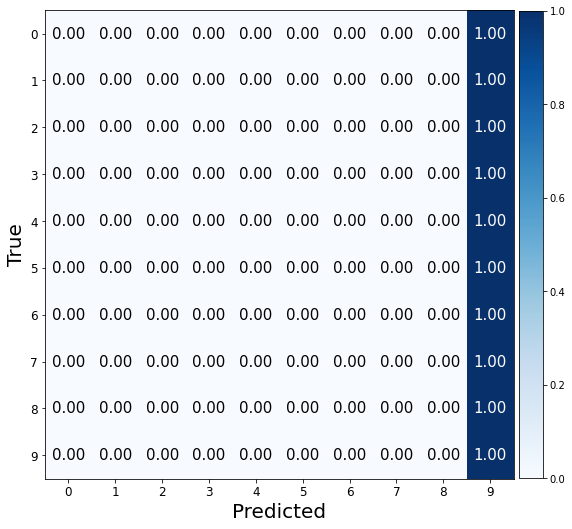

###################

ne: 170, hd:100, wd:0.2, lr: 0.2, bs:600 
Valid Evaluation loss: 4.632452487945557. f1:0.024779842625146493 acc: 0.10350000113248825 


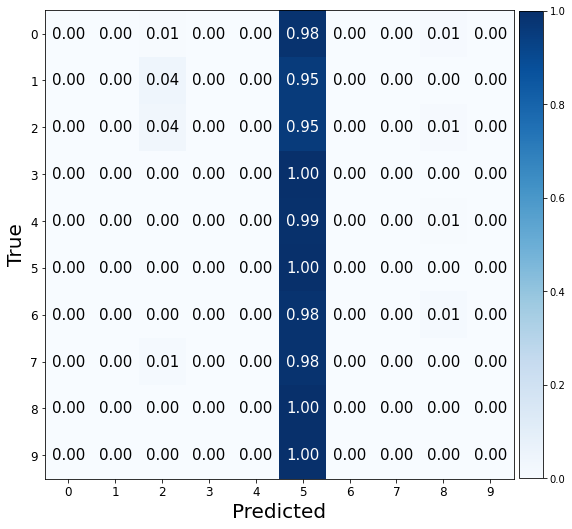

###################

ne: 170, hd:120, wd:0.2, lr: 0.2, bs:600 
Valid Evaluation loss: 2.308950662612915. f1:0.01818181818181818 acc: 0.10000000149011612 


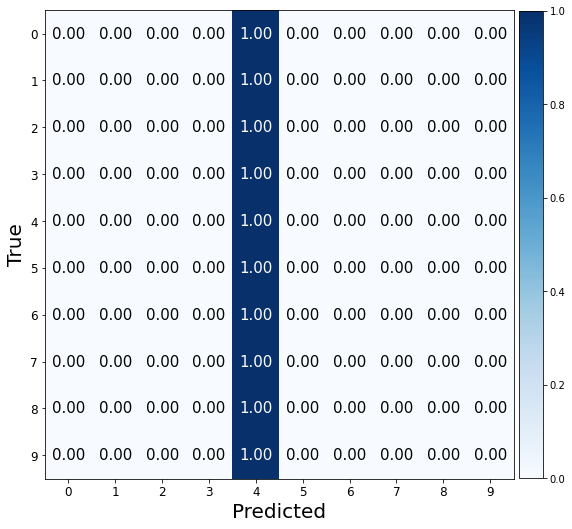

###################

ne: 170, hd:70, wd:0.002, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.3777155876159668. f1:0.9103928497067659 acc: 0.9104999899864197 


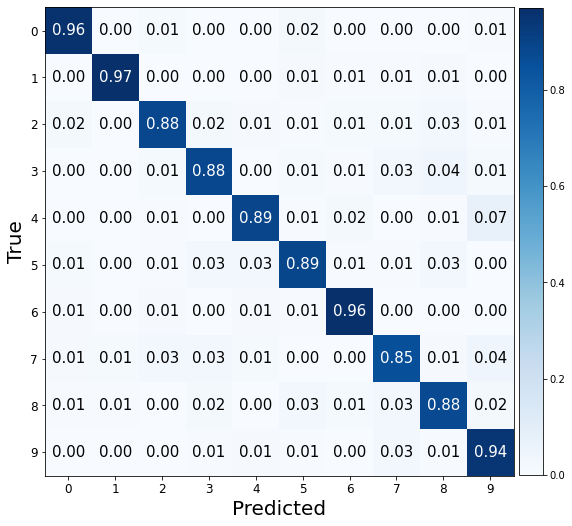

###################

ne: 170, hd:100, wd:0.002, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.3289355933666229. f1:0.922402049409663 acc: 0.9225000143051147 


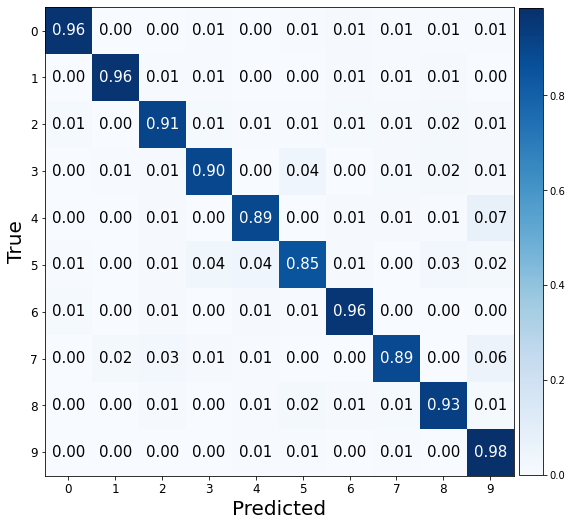

###################

ne: 170, hd:120, wd:0.002, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.312009334564209. f1:0.9234539285712453 acc: 0.9235000014305115 


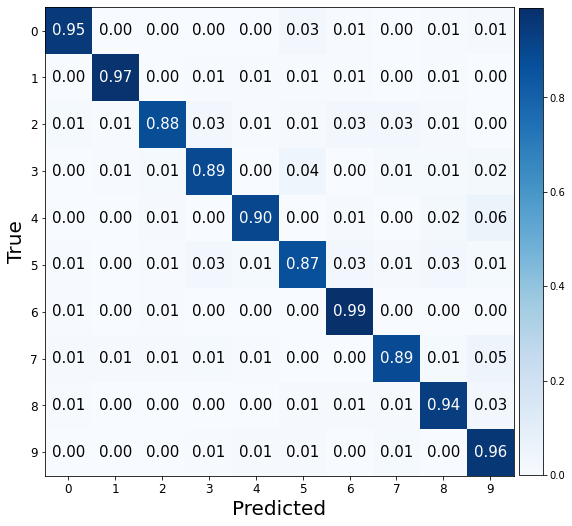

###################

ne: 170, hd:70, wd:0.02, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.2811163365840912. f1:0.9243420107392593 acc: 0.9244999885559082 


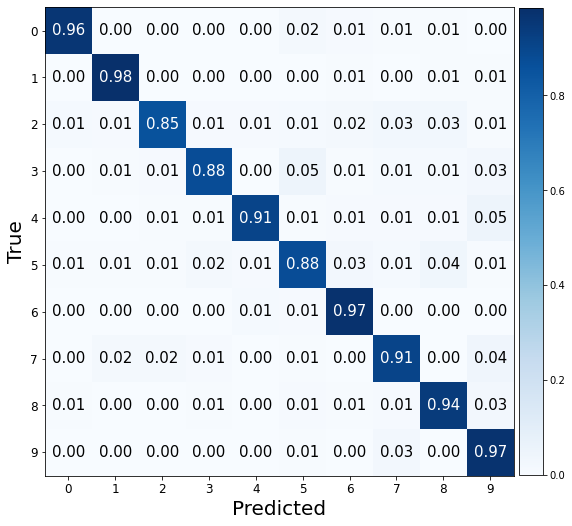

###################

ne: 170, hd:100, wd:0.02, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.26100948452949524. f1:0.92633719334879 acc: 0.9265000224113464 


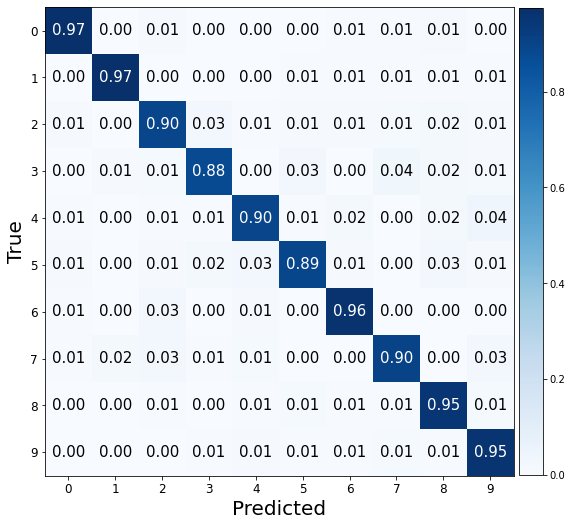

###################

ne: 170, hd:120, wd:0.02, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.28450557589530945. f1:0.9199186755452129 acc: 0.9200000166893005 


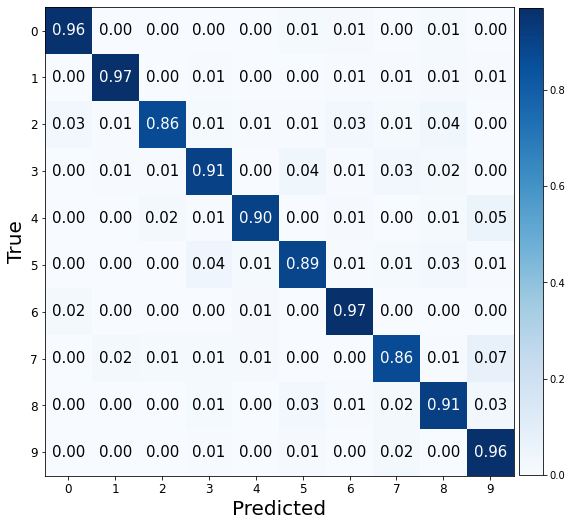

###################

ne: 170, hd:70, wd:0.2, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.22236879169940948. f1:0.9307739554678353 acc: 0.9309999942779541 


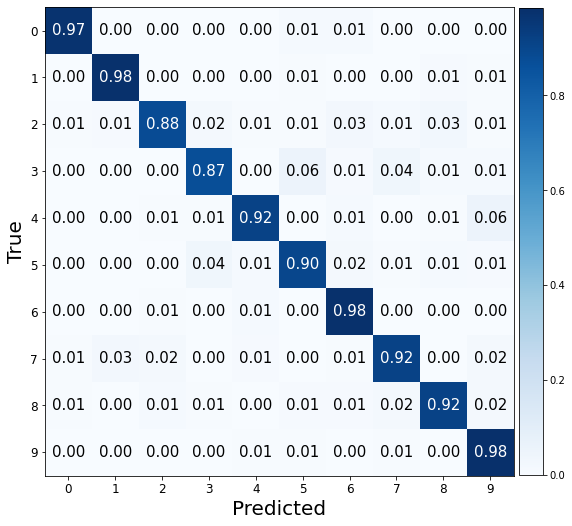

###################

ne: 170, hd:100, wd:0.2, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.19973739981651306. f1:0.930377959926324 acc: 0.9304999709129333 


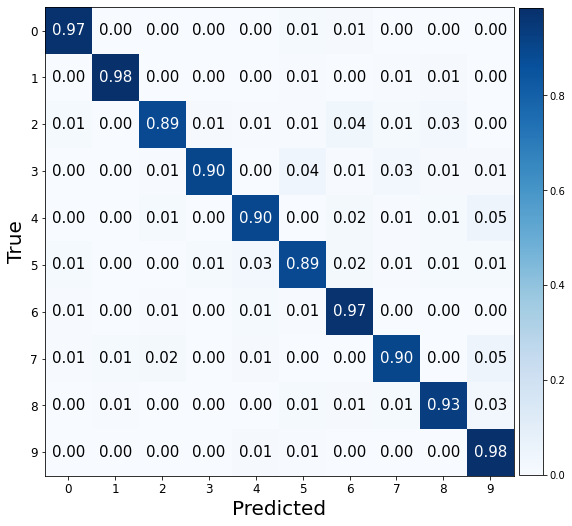

###################

ne: 170, hd:120, wd:0.2, lr: 0.002, bs:1100 
Valid Evaluation loss: 0.22052335739135742. f1:0.9252578689635464 acc: 0.9254999756813049 


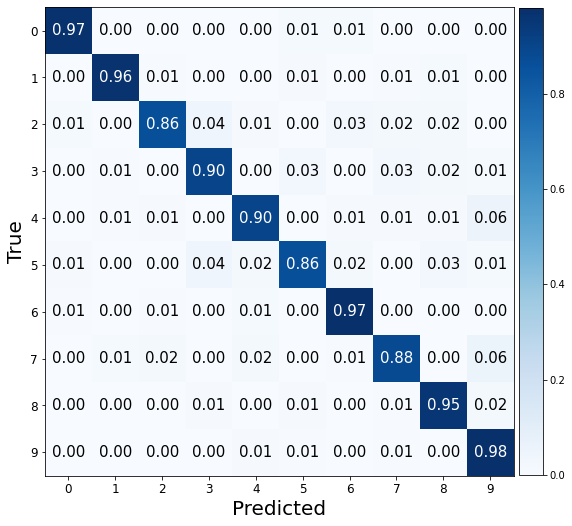

###################

ne: 170, hd:70, wd:0.002, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.2876019477844238. f1:0.4696322255962335 acc: 0.534500002861023 


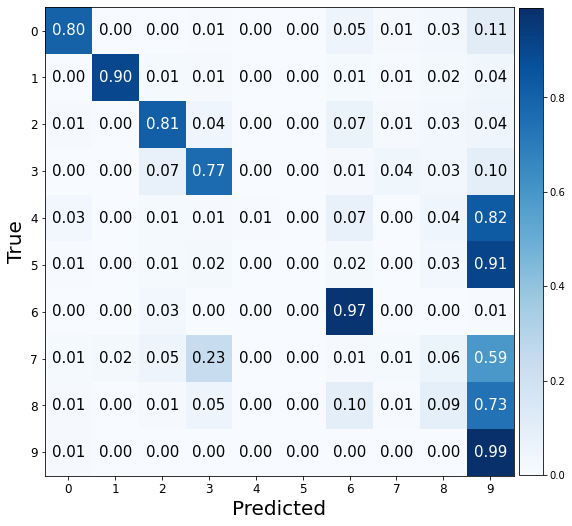

###################

ne: 170, hd:100, wd:0.002, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.5768402814865112. f1:0.3894280475143046 acc: 0.44699999690055847 


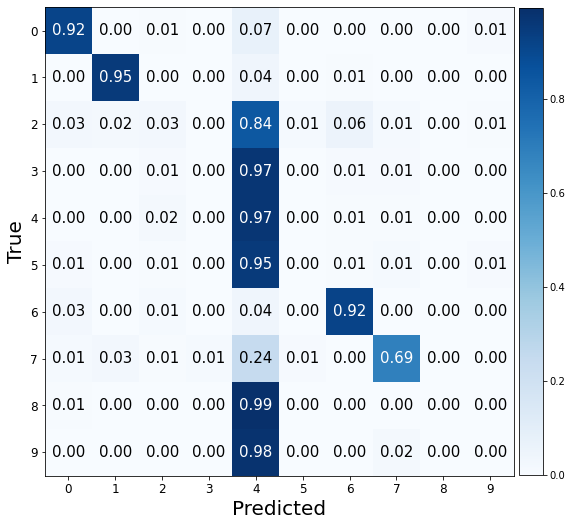

###################

ne: 170, hd:120, wd:0.002, lr: 0.02, bs:1100 
Valid Evaluation loss: 2.1144964694976807. f1:0.20170403854744284 acc: 0.27300000190734863 


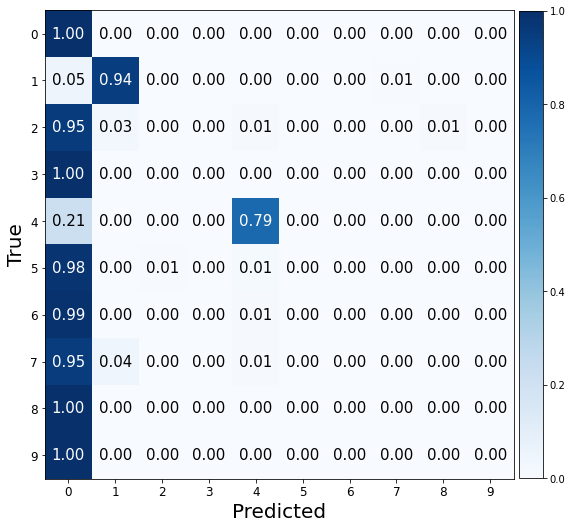

###################

ne: 170, hd:70, wd:0.02, lr: 0.02, bs:1100 
Valid Evaluation loss: 0.485603004693985. f1:0.8791210751846092 acc: 0.8784999847412109 


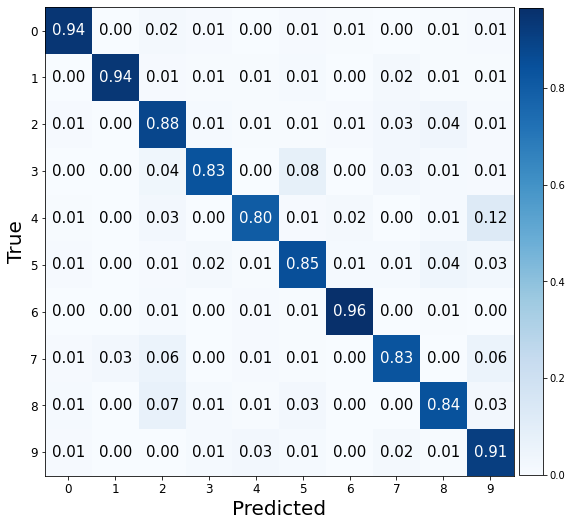

###################

ne: 170, hd:100, wd:0.02, lr: 0.02, bs:1100 
Valid Evaluation loss: 2.093238353729248. f1:0.11282929292929293 acc: 0.1914999932050705 


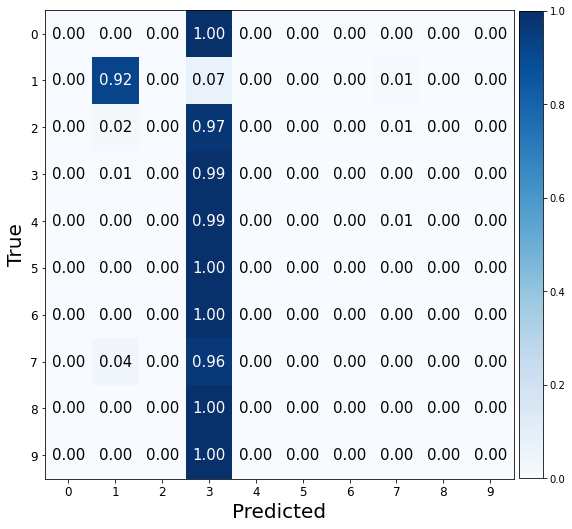

###################

ne: 170, hd:120, wd:0.02, lr: 0.02, bs:1100 
Valid Evaluation loss: 0.7107862830162048. f1:0.7717274094930323 acc: 0.7985000014305115 


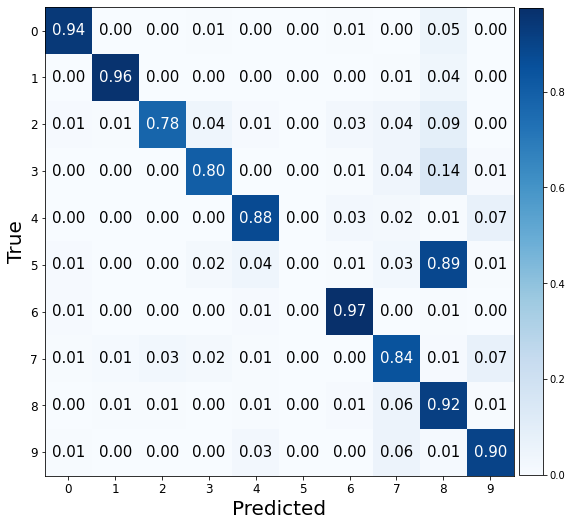

###################

ne: 170, hd:70, wd:0.2, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.474780559539795. f1:0.5721429073042323 acc: 0.6100000143051147 


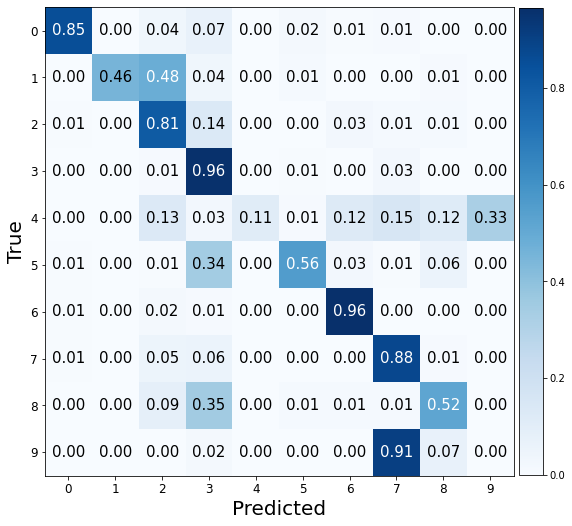

###################

ne: 170, hd:100, wd:0.2, lr: 0.02, bs:1100 
Valid Evaluation loss: 0.9763097167015076. f1:0.6228550998063372 acc: 0.6690000295639038 


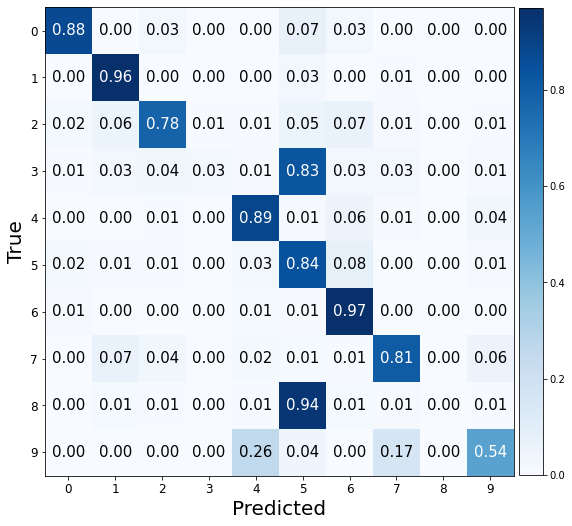

###################

ne: 170, hd:120, wd:0.2, lr: 0.02, bs:1100 
Valid Evaluation loss: 1.5889848470687866. f1:0.42904923603423295 acc: 0.4404999911785126 


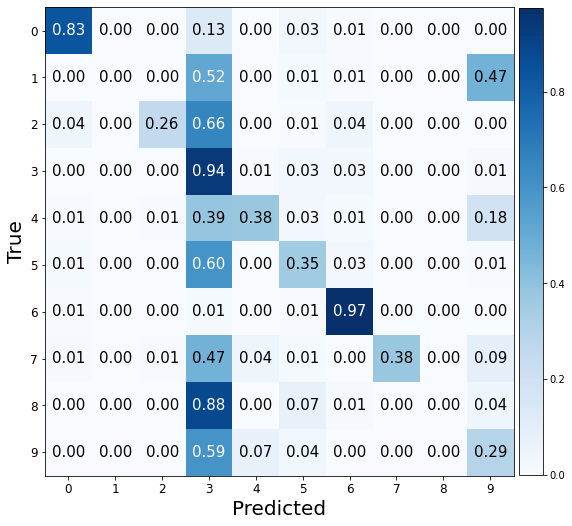

###################

ne: 170, hd:70, wd:0.002, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.30261492729187. f1:0.01818181818181818 acc: 0.10000000149011612 


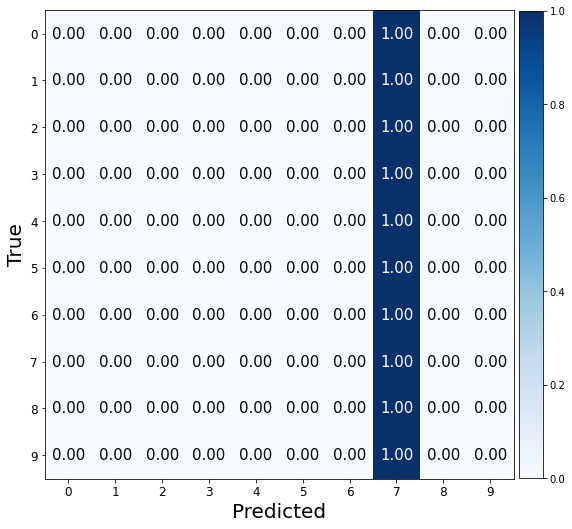

###################

ne: 170, hd:100, wd:0.002, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.3026773929595947. f1:0.01818181818181818 acc: 0.10000000149011612 


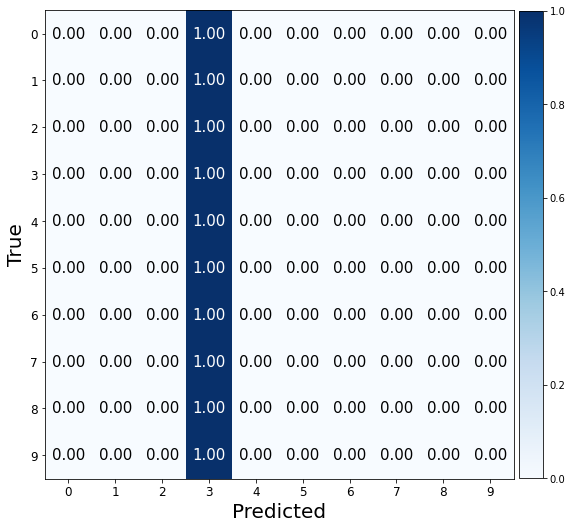

###################

ne: 170, hd:120, wd:0.002, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.3034586906433105. f1:0.01818181818181818 acc: 0.10000000149011612 


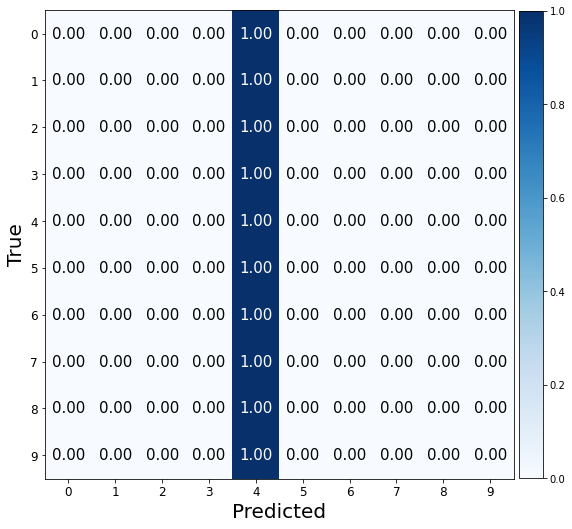

###################

ne: 170, hd:70, wd:0.02, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.472233295440674. f1:0.01920362678100853 acc: 0.10050000250339508 


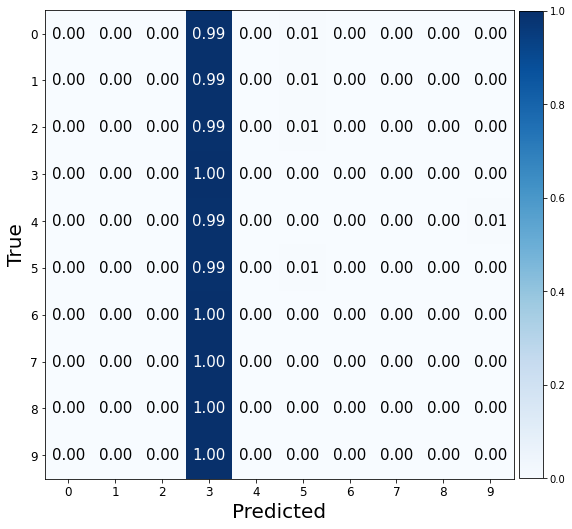

###################

ne: 170, hd:100, wd:0.02, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.353811264038086. f1:0.01818181818181818 acc: 0.10000000149011612 


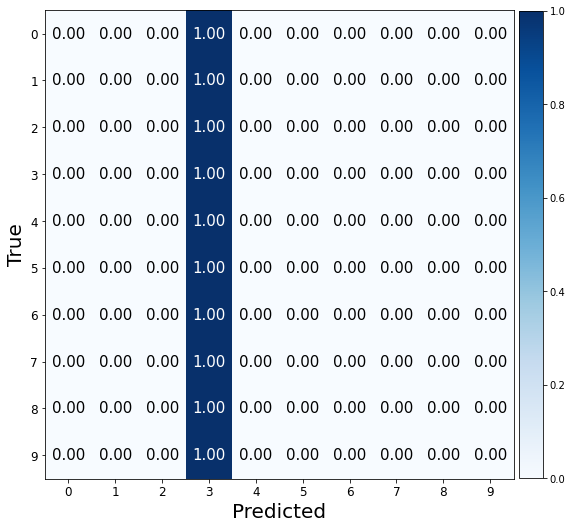

###################

ne: 170, hd:120, wd:0.02, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.403721570968628. f1:0.02987244894134399 acc: 0.10599999874830246 


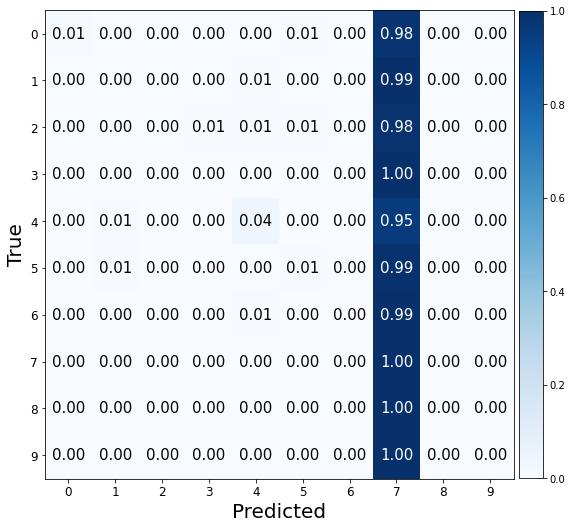

###################

ne: 170, hd:70, wd:0.2, lr: 0.2, bs:1100 
Valid Evaluation loss: 4.813796043395996. f1:0.058629326159772996 acc: 0.17149999737739563 


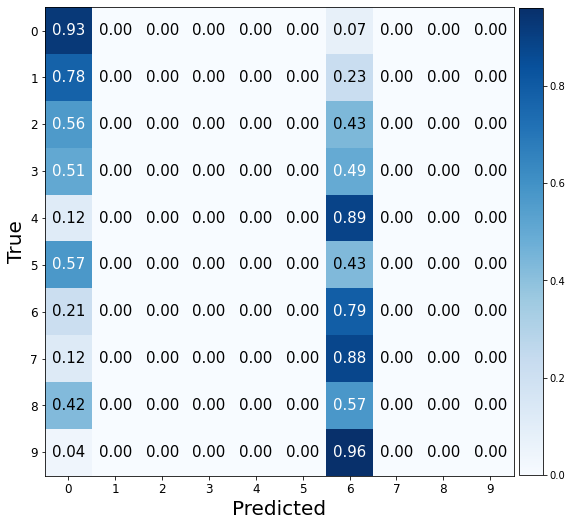

###################

ne: 170, hd:100, wd:0.2, lr: 0.2, bs:1100 
Valid Evaluation loss: 2.385685682296753. f1:0.07667859846480943 acc: 0.13899999856948853 


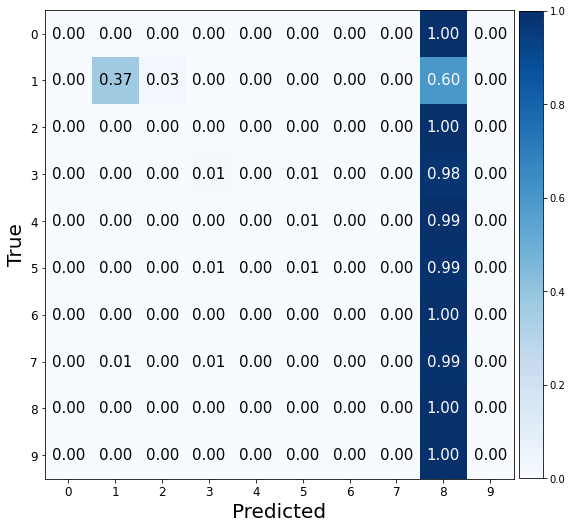

###################

ne: 170, hd:120, wd:0.2, lr: 0.2, bs:1100 
Valid Evaluation loss: 3.3469302654266357. f1:0.0192967351655074 acc: 0.10050000250339508 


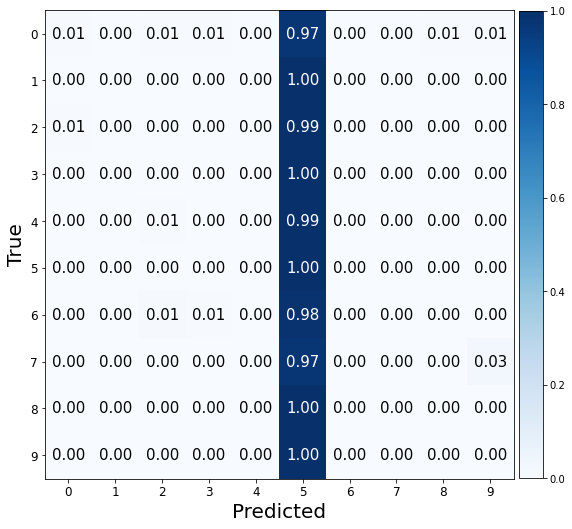

###################



In [22]:
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from tqdm.notebook import tqdm


bs_list = [300,600,1100]
lr_list = [0.002,0.02,0.2]
wd_list = [0.002,0.02,0.2]
hd_list = [70,100,120]
ne_list = [70,130,170]

pbar = tqdm(total=len(bs_list)*len(lr_list)*len(wd_list)*len(hd_list)*len(ne_list))

for ne in ne_list:
  for bs in bs_list:
    train_ds = TensorDataset(X_train, Y_train)
    train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True)

    for lr in lr_list:
      for wd in wd_list:
        for hd in hd_list:
          input_dim = 28*28
          out_dim = 10
          hidden = hd

          model = torch.nn.Sequential(
            torch.nn.Linear(input_dim, hidden),
            torch.nn.ReLU(),
            torch.nn.Linear(hidden, hidden),
            torch.nn.ReLU(),
            torch.nn.Linear(hidden, out_dim)
          )

          optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
          criterion = torch.nn.CrossEntropyLoss()

          print('ne: {}, hd:{}, wd:{}, lr: {}, bs:{} '.format(ne,hd,wd,lr,bs))
          train_valid(model,ne,optimizer,criterion)
          print('###################\n')

          pbar.update()
pbar.close()

ANÁLISIS

Teniendo en cuenta los metaparámetros utilizados en el caso base explicado, lo que se hizo para el primer modelo fue mantener el tipo de modelo, pero disminuyendo en magnitud los metaparámetros. El resultado fue que el modelo no era muy adecuado en la identificación de los números ya que presentaba errores elevados. En el segundo modelo, se cambió el modelo específicamente y se elevaron en magnitud los valores de los metaparámetros. De los resultados, se puede decir que el segundo modelo respondió de forma más adecuada. A continuación se muestran los metaparámetros empleados en el modelo que presentó mejores resultados:

bs_list = [300,600,1100]



lr_list = [0.002,0.02,0.2]


wd_list = [0.002,0.02,0.2]


hd_list = [70,100,120]


ne_list = [70,130,170]

En cada uno de los modelos se mostró la matriz de confusión y los resultados obtenidos. 